# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = [False, False],
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "time_cat",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2,
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1, 
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=['status_control', 'zone'],
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "afriat_v4_1"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
/tmp/ipykernel_998227/891505844.py:50: UserWarning: `(None, ['status_control', 'zone'])` is defined as `batch_key` or `categorical_covariate`, it will be given to both encoder and decoder. Make sure this does not contain information of any of your disentenglement targets. For example, if `donor_id` is chosen as a batch key, do not disentengle donor level information such as `sex` or `age`. The decoder should not use the disentengled latent spaces, simply ignores, if it is already given a batch_key. 
  tardis.MyModel.setup_anndata(adata, **dataset_params)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: 34kas4zp
Name: hokey-senate-157
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/34kas4zp
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240504_161242-34kas4zp/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `training` set. Number of elements in each group: 2549,2565,1694,3433,1641,3361
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `validation` set. Number of elements in each group: 656,637,414,857,408,838
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:08<1:21:15,  8.14s/it]

Epoch 1/600:   0%|          | 1/600 [00:08<1:21:15,  8.14s/it, v_num=zp_1, total_loss_train=3.72e+3, kl_local_train=49.5]

Epoch 2/600:   0%|          | 1/600 [00:08<1:21:15,  8.14s/it, v_num=zp_1, total_loss_train=3.72e+3, kl_local_train=49.5]

Epoch 2/600:   0%|          | 2/600 [00:15<1:17:15,  7.75s/it, v_num=zp_1, total_loss_train=3.72e+3, kl_local_train=49.5]

Epoch 2/600:   0%|          | 2/600 [00:15<1:17:15,  7.75s/it, v_num=zp_1, total_loss_train=3.23e+3, kl_local_train=71.8]

Epoch 3/600:   0%|          | 2/600 [00:15<1:17:15,  7.75s/it, v_num=zp_1, total_loss_train=3.23e+3, kl_local_train=71.8]

Epoch 3/600:   0%|          | 3/600 [00:23<1:16:35,  7.70s/it, v_num=zp_1, total_loss_train=3.23e+3, kl_local_train=71.8]

Epoch 3/600:   0%|          | 3/600 [00:23<1:16:35,  7.70s/it, v_num=zp_1, total_loss_train=3.22e+3, kl_local_train=72.8]

Epoch 4/600:   0%|          | 3/600 [00:23<1:16:35,  7.70s/it, v_num=zp_1, total_loss_train=3.22e+3, kl_local_train=72.8]

Epoch 4/600:   1%|          | 4/600 [00:30<1:15:17,  7.58s/it, v_num=zp_1, total_loss_train=3.22e+3, kl_local_train=72.8]

Epoch 4/600:   1%|          | 4/600 [00:30<1:15:17,  7.58s/it, v_num=zp_1, total_loss_train=3.21e+3, kl_local_train=68.5]

Epoch 5/600:   1%|          | 4/600 [00:30<1:15:17,  7.58s/it, v_num=zp_1, total_loss_train=3.21e+3, kl_local_train=68.5]

Epoch 5/600:   1%|          | 5/600 [00:38<1:15:00,  7.56s/it, v_num=zp_1, total_loss_train=3.21e+3, kl_local_train=68.5]

Epoch 5/600:   1%|          | 5/600 [00:38<1:15:00,  7.56s/it, v_num=zp_1, total_loss_train=3.21e+3, kl_local_train=56.2]

Epoch 6/600:   1%|          | 5/600 [00:39<1:15:00,  7.56s/it, v_num=zp_1, total_loss_train=3.21e+3, kl_local_train=56.2]

Epoch 6/600:   1%|          | 6/600 [00:45<1:15:22,  7.61s/it, v_num=zp_1, total_loss_train=3.21e+3, kl_local_train=56.2]

Epoch 6/600:   1%|          | 6/600 [00:45<1:15:22,  7.61s/it, v_num=zp_1, total_loss_train=3.2e+3, kl_local_train=44.5, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.0109, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0352]

Epoch 7/600:   1%|          | 6/600 [00:45<1:15:22,  7.61s/it, v_num=zp_1, total_loss_train=3.2e+3, kl_local_train=44.5, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.0109, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0352]

Epoch 7/600:   1%|          | 7/600 [00:52<1:12:54,  7.38s/it, v_num=zp_1, total_loss_train=3.2e+3, kl_local_train=44.5, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.0109, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0352]

Epoch 7/600:   1%|          | 7/600 [00:52<1:12:54,  7.38s/it, v_num=zp_1, total_loss_train=3.19e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.0109, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0352]

Epoch 8/600:   1%|          | 7/600 [00:52<1:12:54,  7.38s/it, v_num=zp_1, total_loss_train=3.19e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.0109, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0352]

Epoch 8/600:   1%|▏         | 8/600 [00:59<1:11:03,  7.20s/it, v_num=zp_1, total_loss_train=3.19e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.0109, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0352]

Epoch 8/600:   1%|▏         | 8/600 [00:59<1:11:03,  7.20s/it, v_num=zp_1, total_loss_train=3.18e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.0109, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0352]

Epoch 9/600:   1%|▏         | 8/600 [00:59<1:11:03,  7.20s/it, v_num=zp_1, total_loss_train=3.18e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.0109, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0352]

Epoch 9/600:   2%|▏         | 9/600 [01:06<1:09:48,  7.09s/it, v_num=zp_1, total_loss_train=3.18e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.0109, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0352]

Epoch 9/600:   2%|▏         | 9/600 [01:06<1:09:48,  7.09s/it, v_num=zp_1, total_loss_train=3.17e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.0109, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0352]

Epoch 10/600:   2%|▏         | 9/600 [01:06<1:09:48,  7.09s/it, v_num=zp_1, total_loss_train=3.17e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.0109, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0352]

Epoch 10/600:   2%|▏         | 10/600 [01:13<1:09:09,  7.03s/it, v_num=zp_1, total_loss_train=3.17e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.0109, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0352]

Epoch 10/600:   2%|▏         | 10/600 [01:13<1:09:09,  7.03s/it, v_num=zp_1, total_loss_train=3.17e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.0109, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0352]

Epoch 11/600:   2%|▏         | 10/600 [01:14<1:09:09,  7.03s/it, v_num=zp_1, total_loss_train=3.17e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.0109, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0352]

Epoch 11/600:   2%|▏         | 11/600 [01:21<1:10:54,  7.22s/it, v_num=zp_1, total_loss_train=3.17e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.0109, metric_mi|time_cat_train=0.0126, metric_mi|mouse_train=0.0352]

Epoch 11/600:   2%|▏         | 11/600 [01:21<1:10:54,  7.22s/it, v_num=zp_1, total_loss_train=3.16e+3, kl_local_train=66.1, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0956, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.102] 

Epoch 12/600:   2%|▏         | 11/600 [01:21<1:10:54,  7.22s/it, v_num=zp_1, total_loss_train=3.16e+3, kl_local_train=66.1, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0956, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.102]

Epoch 12/600:   2%|▏         | 12/600 [01:27<1:09:26,  7.09s/it, v_num=zp_1, total_loss_train=3.16e+3, kl_local_train=66.1, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0956, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.102]

Epoch 12/600:   2%|▏         | 12/600 [01:27<1:09:26,  7.09s/it, v_num=zp_1, total_loss_train=3.15e+3, kl_local_train=74, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0956, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.102]  

Epoch 13/600:   2%|▏         | 12/600 [01:27<1:09:26,  7.09s/it, v_num=zp_1, total_loss_train=3.15e+3, kl_local_train=74, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0956, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.102]

Epoch 13/600:   2%|▏         | 13/600 [01:34<1:08:24,  6.99s/it, v_num=zp_1, total_loss_train=3.15e+3, kl_local_train=74, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0956, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.102]

Epoch 13/600:   2%|▏         | 13/600 [01:34<1:08:24,  6.99s/it, v_num=zp_1, total_loss_train=3.15e+3, kl_local_train=77.8, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0956, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.102]

Epoch 14/600:   2%|▏         | 13/600 [01:34<1:08:24,  6.99s/it, v_num=zp_1, total_loss_train=3.15e+3, kl_local_train=77.8, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0956, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.102]

Epoch 14/600:   2%|▏         | 14/600 [01:41<1:07:40,  6.93s/it, v_num=zp_1, total_loss_train=3.15e+3, kl_local_train=77.8, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0956, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.102]

Epoch 14/600:   2%|▏         | 14/600 [01:41<1:07:40,  6.93s/it, v_num=zp_1, total_loss_train=3.15e+3, kl_local_train=78.2, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0956, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.102]

Epoch 15/600:   2%|▏         | 14/600 [01:41<1:07:40,  6.93s/it, v_num=zp_1, total_loss_train=3.15e+3, kl_local_train=78.2, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0956, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.102]

Epoch 15/600:   2%|▎         | 15/600 [01:48<1:07:40,  6.94s/it, v_num=zp_1, total_loss_train=3.15e+3, kl_local_train=78.2, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0956, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.102]

Epoch 15/600:   2%|▎         | 15/600 [01:48<1:07:40,  6.94s/it, v_num=zp_1, total_loss_train=3.14e+3, kl_local_train=78.4, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0956, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.102]

Epoch 16/600:   2%|▎         | 15/600 [01:49<1:07:40,  6.94s/it, v_num=zp_1, total_loss_train=3.14e+3, kl_local_train=78.4, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0956, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.102]

Epoch 16/600:   3%|▎         | 16/600 [01:55<1:09:40,  7.16s/it, v_num=zp_1, total_loss_train=3.14e+3, kl_local_train=78.4, metric_mi|status_control_train=0.0617, metric_mi|zone_train=0.0956, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.102]

Epoch 16/600:   3%|▎         | 16/600 [01:55<1:09:40,  7.16s/it, v_num=zp_1, total_loss_train=3.14e+3, kl_local_train=80, metric_mi|status_control_train=0.0813, metric_mi|zone_train=0.0701, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.146]   

Epoch 17/600:   3%|▎         | 16/600 [01:55<1:09:40,  7.16s/it, v_num=zp_1, total_loss_train=3.14e+3, kl_local_train=80, metric_mi|status_control_train=0.0813, metric_mi|zone_train=0.0701, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.146]

Epoch 17/600:   3%|▎         | 17/600 [02:02<1:08:30,  7.05s/it, v_num=zp_1, total_loss_train=3.14e+3, kl_local_train=80, metric_mi|status_control_train=0.0813, metric_mi|zone_train=0.0701, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.146]

Epoch 17/600:   3%|▎         | 17/600 [02:02<1:08:30,  7.05s/it, v_num=zp_1, total_loss_train=3.14e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0813, metric_mi|zone_train=0.0701, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.146]

Epoch 18/600:   3%|▎         | 17/600 [02:02<1:08:30,  7.05s/it, v_num=zp_1, total_loss_train=3.14e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0813, metric_mi|zone_train=0.0701, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.146]

Epoch 18/600:   3%|▎         | 18/600 [02:09<1:07:39,  6.98s/it, v_num=zp_1, total_loss_train=3.14e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0813, metric_mi|zone_train=0.0701, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.146]

Epoch 18/600:   3%|▎         | 18/600 [02:09<1:07:39,  6.98s/it, v_num=zp_1, total_loss_train=3.13e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0813, metric_mi|zone_train=0.0701, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.146]

Epoch 19/600:   3%|▎         | 18/600 [02:09<1:07:39,  6.98s/it, v_num=zp_1, total_loss_train=3.13e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0813, metric_mi|zone_train=0.0701, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.146]

Epoch 19/600:   3%|▎         | 19/600 [02:16<1:07:02,  6.92s/it, v_num=zp_1, total_loss_train=3.13e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0813, metric_mi|zone_train=0.0701, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.146]

Epoch 19/600:   3%|▎         | 19/600 [02:16<1:07:02,  6.92s/it, v_num=zp_1, total_loss_train=3.13e+3, kl_local_train=83.2, metric_mi|status_control_train=0.0813, metric_mi|zone_train=0.0701, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.146]

Epoch 20/600:   3%|▎         | 19/600 [02:16<1:07:02,  6.92s/it, v_num=zp_1, total_loss_train=3.13e+3, kl_local_train=83.2, metric_mi|status_control_train=0.0813, metric_mi|zone_train=0.0701, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.146]

Epoch 20/600:   3%|▎         | 20/600 [02:23<1:06:46,  6.91s/it, v_num=zp_1, total_loss_train=3.13e+3, kl_local_train=83.2, metric_mi|status_control_train=0.0813, metric_mi|zone_train=0.0701, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.146]

Epoch 20/600:   3%|▎         | 20/600 [02:23<1:06:46,  6.91s/it, v_num=zp_1, total_loss_train=3.13e+3, kl_local_train=84.6, metric_mi|status_control_train=0.0813, metric_mi|zone_train=0.0701, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.146]

Epoch 21/600:   3%|▎         | 20/600 [02:24<1:06:46,  6.91s/it, v_num=zp_1, total_loss_train=3.13e+3, kl_local_train=84.6, metric_mi|status_control_train=0.0813, metric_mi|zone_train=0.0701, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.146]

Epoch 21/600:   4%|▎         | 21/600 [02:30<1:08:55,  7.14s/it, v_num=zp_1, total_loss_train=3.13e+3, kl_local_train=84.6, metric_mi|status_control_train=0.0813, metric_mi|zone_train=0.0701, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.146]

Epoch 21/600:   4%|▎         | 21/600 [02:30<1:08:55,  7.14s/it, v_num=zp_1, total_loss_train=3.13e+3, kl_local_train=85, metric_mi|status_control_train=0.0971, metric_mi|zone_train=0.0574, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.166]  

Epoch 22/600:   4%|▎         | 21/600 [02:30<1:08:55,  7.14s/it, v_num=zp_1, total_loss_train=3.13e+3, kl_local_train=85, metric_mi|status_control_train=0.0971, metric_mi|zone_train=0.0574, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.166]

Epoch 22/600:   4%|▎         | 22/600 [02:37<1:07:49,  7.04s/it, v_num=zp_1, total_loss_train=3.13e+3, kl_local_train=85, metric_mi|status_control_train=0.0971, metric_mi|zone_train=0.0574, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.166]

Epoch 22/600:   4%|▎         | 22/600 [02:37<1:07:49,  7.04s/it, v_num=zp_1, total_loss_train=3.13e+3, kl_local_train=85.7, metric_mi|status_control_train=0.0971, metric_mi|zone_train=0.0574, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.166]

Epoch 23/600:   4%|▎         | 22/600 [02:37<1:07:49,  7.04s/it, v_num=zp_1, total_loss_train=3.13e+3, kl_local_train=85.7, metric_mi|status_control_train=0.0971, metric_mi|zone_train=0.0574, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.166]

Epoch 23/600:   4%|▍         | 23/600 [02:44<1:07:01,  6.97s/it, v_num=zp_1, total_loss_train=3.13e+3, kl_local_train=85.7, metric_mi|status_control_train=0.0971, metric_mi|zone_train=0.0574, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.166]

Epoch 23/600:   4%|▍         | 23/600 [02:44<1:07:01,  6.97s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=87.7, metric_mi|status_control_train=0.0971, metric_mi|zone_train=0.0574, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.166]

Epoch 24/600:   4%|▍         | 23/600 [02:44<1:07:01,  6.97s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=87.7, metric_mi|status_control_train=0.0971, metric_mi|zone_train=0.0574, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.166]

Epoch 24/600:   4%|▍         | 24/600 [02:51<1:06:25,  6.92s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=87.7, metric_mi|status_control_train=0.0971, metric_mi|zone_train=0.0574, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.166]

Epoch 24/600:   4%|▍         | 24/600 [02:51<1:06:25,  6.92s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=88.6, metric_mi|status_control_train=0.0971, metric_mi|zone_train=0.0574, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.166]

Epoch 25/600:   4%|▍         | 24/600 [02:51<1:06:25,  6.92s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=88.6, metric_mi|status_control_train=0.0971, metric_mi|zone_train=0.0574, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.166]

Epoch 25/600:   4%|▍         | 25/600 [02:58<1:06:17,  6.92s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=88.6, metric_mi|status_control_train=0.0971, metric_mi|zone_train=0.0574, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.166]

Epoch 25/600:   4%|▍         | 25/600 [02:58<1:06:17,  6.92s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=88.8, metric_mi|status_control_train=0.0971, metric_mi|zone_train=0.0574, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.166]

Epoch 26/600:   4%|▍         | 25/600 [02:59<1:06:17,  6.92s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=88.8, metric_mi|status_control_train=0.0971, metric_mi|zone_train=0.0574, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.166]

Epoch 26/600:   4%|▍         | 26/600 [03:05<1:08:25,  7.15s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=88.8, metric_mi|status_control_train=0.0971, metric_mi|zone_train=0.0574, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.166]

Epoch 26/600:   4%|▍         | 26/600 [03:05<1:08:25,  7.15s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=89.1, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0457, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.177] 

Epoch 27/600:   4%|▍         | 26/600 [03:05<1:08:25,  7.15s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=89.1, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0457, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.177]

Epoch 27/600:   4%|▍         | 27/600 [03:12<1:07:19,  7.05s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=89.1, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0457, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.177]

Epoch 27/600:   4%|▍         | 27/600 [03:12<1:07:19,  7.05s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=89.5, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0457, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.177]

Epoch 28/600:   4%|▍         | 27/600 [03:12<1:07:19,  7.05s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=89.5, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0457, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.177]

Epoch 28/600:   5%|▍         | 28/600 [03:19<1:06:36,  6.99s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=89.5, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0457, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.177]

Epoch 28/600:   5%|▍         | 28/600 [03:19<1:06:36,  6.99s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=90.1, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0457, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.177]

Epoch 29/600:   5%|▍         | 28/600 [03:19<1:06:36,  6.99s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=90.1, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0457, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.177]

Epoch 29/600:   5%|▍         | 29/600 [03:26<1:06:00,  6.94s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=90.1, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0457, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.177]

Epoch 29/600:   5%|▍         | 29/600 [03:26<1:06:00,  6.94s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=90.5, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0457, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.177]

Epoch 30/600:   5%|▍         | 29/600 [03:26<1:06:00,  6.94s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=90.5, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0457, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.177]

Epoch 30/600:   5%|▌         | 30/600 [03:33<1:07:04,  7.06s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=90.5, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0457, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.177]

Epoch 30/600:   5%|▌         | 30/600 [03:33<1:07:04,  7.06s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=91.6, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0457, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.177]

Epoch 31/600:   5%|▌         | 30/600 [03:34<1:07:04,  7.06s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=91.6, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0457, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.177]

Epoch 31/600:   5%|▌         | 31/600 [03:41<1:08:44,  7.25s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=91.6, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0457, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.177]

Epoch 31/600:   5%|▌         | 31/600 [03:41<1:08:44,  7.25s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=92.8, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.181]

Epoch 32/600:   5%|▌         | 31/600 [03:41<1:08:44,  7.25s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=92.8, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.181]

Epoch 32/600:   5%|▌         | 32/600 [03:48<1:07:25,  7.12s/it, v_num=zp_1, total_loss_train=3.12e+3, kl_local_train=92.8, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.181]

Epoch 32/600:   5%|▌         | 32/600 [03:48<1:07:25,  7.12s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=92.8, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.181]

Epoch 33/600:   5%|▌         | 32/600 [03:48<1:07:25,  7.12s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=92.8, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.181]

Epoch 33/600:   6%|▌         | 33/600 [03:55<1:06:25,  7.03s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=92.8, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.181]

Epoch 33/600:   6%|▌         | 33/600 [03:55<1:06:25,  7.03s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=94.4, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.181]

Epoch 34/600:   6%|▌         | 33/600 [03:55<1:06:25,  7.03s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=94.4, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.181]

Epoch 34/600:   6%|▌         | 34/600 [04:01<1:05:44,  6.97s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=94.4, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.181]

Epoch 34/600:   6%|▌         | 34/600 [04:01<1:05:44,  6.97s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=93.6, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.181]

Epoch 35/600:   6%|▌         | 34/600 [04:01<1:05:44,  6.97s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=93.6, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.181]

Epoch 35/600:   6%|▌         | 35/600 [04:08<1:05:47,  6.99s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=93.6, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.181]

Epoch 35/600:   6%|▌         | 35/600 [04:08<1:05:47,  6.99s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=93.1, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.181]

Epoch 36/600:   6%|▌         | 35/600 [04:09<1:05:47,  6.99s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=93.1, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.181]

Epoch 36/600:   6%|▌         | 36/600 [04:16<1:07:50,  7.22s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=93.1, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.181]

Epoch 36/600:   6%|▌         | 36/600 [04:16<1:07:50,  7.22s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=93.5, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0325, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.183]

Epoch 37/600:   6%|▌         | 36/600 [04:16<1:07:50,  7.22s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=93.5, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0325, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.183]

Epoch 37/600:   6%|▌         | 37/600 [04:23<1:06:51,  7.12s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=93.5, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0325, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.183]

Epoch 37/600:   6%|▌         | 37/600 [04:23<1:06:51,  7.12s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=94.2, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0325, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.183]

Epoch 38/600:   6%|▌         | 37/600 [04:23<1:06:51,  7.12s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=94.2, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0325, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.183]

Epoch 38/600:   6%|▋         | 38/600 [04:30<1:06:07,  7.06s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=94.2, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0325, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.183]

Epoch 38/600:   6%|▋         | 38/600 [04:30<1:06:07,  7.06s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.3, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0325, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.183]

Epoch 39/600:   6%|▋         | 38/600 [04:30<1:06:07,  7.06s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.3, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0325, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.183]

Epoch 39/600:   6%|▋         | 39/600 [04:37<1:05:28,  7.00s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.3, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0325, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.183]

Epoch 39/600:   6%|▋         | 39/600 [04:37<1:05:28,  7.00s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=94.6, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0325, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.183]

Epoch 40/600:   6%|▋         | 39/600 [04:37<1:05:28,  7.00s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=94.6, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0325, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.183]

Epoch 40/600:   7%|▋         | 40/600 [04:44<1:06:23,  7.11s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=94.6, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0325, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.183]

Epoch 40/600:   7%|▋         | 40/600 [04:44<1:06:23,  7.11s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=94, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0325, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.183]  

Epoch 41/600:   7%|▋         | 40/600 [04:45<1:06:23,  7.11s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=94, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0325, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.183]

Epoch 41/600:   7%|▋         | 41/600 [04:52<1:08:09,  7.32s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=94, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0325, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.183]

Epoch 41/600:   7%|▋         | 41/600 [04:52<1:08:09,  7.32s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.6, metric_mi|status_control_train=0.0986, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 42/600:   7%|▋         | 41/600 [04:52<1:08:09,  7.32s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.6, metric_mi|status_control_train=0.0986, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 42/600:   7%|▋         | 42/600 [04:59<1:06:44,  7.18s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.6, metric_mi|status_control_train=0.0986, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 42/600:   7%|▋         | 42/600 [04:59<1:06:44,  7.18s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.9, metric_mi|status_control_train=0.0986, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 43/600:   7%|▋         | 42/600 [04:59<1:06:44,  7.18s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.9, metric_mi|status_control_train=0.0986, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 43/600:   7%|▋         | 43/600 [05:06<1:05:55,  7.10s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.9, metric_mi|status_control_train=0.0986, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 43/600:   7%|▋         | 43/600 [05:06<1:05:55,  7.10s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.4, metric_mi|status_control_train=0.0986, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 44/600:   7%|▋         | 43/600 [05:06<1:05:55,  7.10s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.4, metric_mi|status_control_train=0.0986, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 44/600:   7%|▋         | 44/600 [05:13<1:05:08,  7.03s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.4, metric_mi|status_control_train=0.0986, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 44/600:   7%|▋         | 44/600 [05:13<1:05:08,  7.03s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=96.5, metric_mi|status_control_train=0.0986, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 45/600:   7%|▋         | 44/600 [05:13<1:05:08,  7.03s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=96.5, metric_mi|status_control_train=0.0986, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 45/600:   8%|▊         | 45/600 [05:20<1:05:44,  7.11s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=96.5, metric_mi|status_control_train=0.0986, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 45/600:   8%|▊         | 45/600 [05:20<1:05:44,  7.11s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=96.6, metric_mi|status_control_train=0.0986, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 46/600:   8%|▊         | 45/600 [05:21<1:05:44,  7.11s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=96.6, metric_mi|status_control_train=0.0986, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 46/600:   8%|▊         | 46/600 [05:28<1:07:35,  7.32s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=96.6, metric_mi|status_control_train=0.0986, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 46/600:   8%|▊         | 46/600 [05:28<1:07:35,  7.32s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.5, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0276, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 47/600:   8%|▊         | 46/600 [05:28<1:07:35,  7.32s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.5, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0276, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 47/600:   8%|▊         | 47/600 [05:35<1:06:11,  7.18s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.5, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0276, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 47/600:   8%|▊         | 47/600 [05:35<1:06:11,  7.18s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.3, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0276, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 48/600:   8%|▊         | 47/600 [05:35<1:06:11,  7.18s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.3, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0276, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 48/600:   8%|▊         | 48/600 [05:42<1:05:09,  7.08s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.3, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0276, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 48/600:   8%|▊         | 48/600 [05:42<1:05:09,  7.08s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.5, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0276, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 49/600:   8%|▊         | 48/600 [05:42<1:05:09,  7.08s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.5, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0276, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 49/600:   8%|▊         | 49/600 [05:48<1:04:22,  7.01s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.5, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0276, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 49/600:   8%|▊         | 49/600 [05:48<1:04:22,  7.01s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.4, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0276, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 50/600:   8%|▊         | 49/600 [05:48<1:04:22,  7.01s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.4, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0276, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 50/600:   8%|▊         | 50/600 [05:56<1:04:44,  7.06s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=95.4, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0276, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 50/600:   8%|▊         | 50/600 [05:56<1:04:44,  7.06s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=96.5, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0276, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 51/600:   8%|▊         | 50/600 [05:56<1:04:44,  7.06s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=96.5, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0276, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 51/600:   8%|▊         | 51/600 [06:03<1:06:28,  7.27s/it, v_num=zp_1, total_loss_train=3.11e+3, kl_local_train=96.5, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0276, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.178]

Epoch 51/600:   8%|▊         | 51/600 [06:03<1:06:28,  7.27s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=95.2, metric_mi|status_control_train=0.0958, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.18]

Epoch 52/600:   8%|▊         | 51/600 [06:03<1:06:28,  7.27s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=95.2, metric_mi|status_control_train=0.0958, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.18]

Epoch 52/600:   9%|▊         | 52/600 [06:10<1:05:12,  7.14s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=95.2, metric_mi|status_control_train=0.0958, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.18]

Epoch 52/600:   9%|▊         | 52/600 [06:10<1:05:12,  7.14s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=95.5, metric_mi|status_control_train=0.0958, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.18]

Epoch 53/600:   9%|▊         | 52/600 [06:10<1:05:12,  7.14s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=95.5, metric_mi|status_control_train=0.0958, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.18]

Epoch 53/600:   9%|▉         | 53/600 [06:17<1:04:15,  7.05s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=95.5, metric_mi|status_control_train=0.0958, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.18]

Epoch 53/600:   9%|▉         | 53/600 [06:17<1:04:15,  7.05s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=95, metric_mi|status_control_train=0.0958, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.18]  

Epoch 54/600:   9%|▉         | 53/600 [06:17<1:04:15,  7.05s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=95, metric_mi|status_control_train=0.0958, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.18]

Epoch 54/600:   9%|▉         | 54/600 [06:24<1:03:33,  6.98s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=95, metric_mi|status_control_train=0.0958, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.18]

Epoch 54/600:   9%|▉         | 54/600 [06:24<1:03:33,  6.98s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=94.6, metric_mi|status_control_train=0.0958, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.18]

Epoch 55/600:   9%|▉         | 54/600 [06:24<1:03:33,  6.98s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=94.6, metric_mi|status_control_train=0.0958, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.18]

Epoch 55/600:   9%|▉         | 55/600 [06:31<1:03:01,  6.94s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=94.6, metric_mi|status_control_train=0.0958, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.18]

Epoch 55/600:   9%|▉         | 55/600 [06:31<1:03:01,  6.94s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=95, metric_mi|status_control_train=0.0958, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.18]  

Epoch 56/600:   9%|▉         | 55/600 [06:32<1:03:01,  6.94s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=95, metric_mi|status_control_train=0.0958, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.18]

Epoch 56/600:   9%|▉         | 56/600 [06:38<1:04:59,  7.17s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=95, metric_mi|status_control_train=0.0958, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.18]

Epoch 56/600:   9%|▉         | 56/600 [06:38<1:04:59,  7.17s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=95.1, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0255, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.183]

Epoch 57/600:   9%|▉         | 56/600 [06:38<1:04:59,  7.17s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=95.1, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0255, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.183]

Epoch 57/600:  10%|▉         | 57/600 [06:45<1:04:00,  7.07s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=95.1, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0255, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.183]

Epoch 57/600:  10%|▉         | 57/600 [06:45<1:04:00,  7.07s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=94.4, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0255, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.183]

Epoch 58/600:  10%|▉         | 57/600 [06:45<1:04:00,  7.07s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=94.4, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0255, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.183]

Epoch 58/600:  10%|▉         | 58/600 [06:52<1:03:15,  7.00s/it, v_num=zp_1, total_loss_train=3.1e+3, kl_local_train=94.4, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0255, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.183]

Epoch 58/600:  10%|▉         | 58/600 [06:52<1:03:15,  7.00s/it, v_num=zp_1, total_loss_train=3.09e+3, kl_local_train=94.2, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0255, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.183]

Epoch 59/600:  10%|▉         | 58/600 [06:52<1:03:15,  7.00s/it, v_num=zp_1, total_loss_train=3.09e+3, kl_local_train=94.2, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0255, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.183]

Epoch 59/600:  10%|▉         | 59/600 [06:59<1:02:52,  6.97s/it, v_num=zp_1, total_loss_train=3.09e+3, kl_local_train=94.2, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0255, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.183]

Epoch 59/600:  10%|▉         | 59/600 [06:59<1:02:52,  6.97s/it, v_num=zp_1, total_loss_train=3.09e+3, kl_local_train=92.7, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0255, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.183]

Epoch 60/600:  10%|▉         | 59/600 [06:59<1:02:52,  6.97s/it, v_num=zp_1, total_loss_train=3.09e+3, kl_local_train=92.7, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0255, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.183]

Epoch 60/600:  10%|█         | 60/600 [07:06<1:03:37,  7.07s/it, v_num=zp_1, total_loss_train=3.09e+3, kl_local_train=92.7, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0255, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.183]

Epoch 60/600:  10%|█         | 60/600 [07:06<1:03:37,  7.07s/it, v_num=zp_1, total_loss_train=3.09e+3, kl_local_train=93.2, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0255, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.183]

Epoch 61/600:  10%|█         | 60/600 [07:07<1:03:37,  7.07s/it, v_num=zp_1, total_loss_train=3.09e+3, kl_local_train=93.2, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0255, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.183]

Epoch 61/600:  10%|█         | 61/600 [07:14<1:05:18,  7.27s/it, v_num=zp_1, total_loss_train=3.09e+3, kl_local_train=93.2, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0255, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.183]

Epoch 61/600:  10%|█         | 61/600 [07:14<1:05:18,  7.27s/it, v_num=zp_1, total_loss_train=3.09e+3, kl_local_train=92.9, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.217, metric_mi|mouse_train=0.185]

Epoch 62/600:  10%|█         | 61/600 [07:14<1:05:18,  7.27s/it, v_num=zp_1, total_loss_train=3.09e+3, kl_local_train=92.9, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.217, metric_mi|mouse_train=0.185]

Epoch 62/600:  10%|█         | 62/600 [07:21<1:04:09,  7.16s/it, v_num=zp_1, total_loss_train=3.09e+3, kl_local_train=92.9, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.217, metric_mi|mouse_train=0.185]

Epoch 62/600:  10%|█         | 62/600 [07:21<1:04:09,  7.16s/it, v_num=zp_1, total_loss_train=3.09e+3, kl_local_train=91.4, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.217, metric_mi|mouse_train=0.185]

Epoch 63/600:  10%|█         | 62/600 [07:21<1:04:09,  7.16s/it, v_num=zp_1, total_loss_train=3.09e+3, kl_local_train=91.4, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.217, metric_mi|mouse_train=0.185]

Epoch 63/600:  10%|█         | 63/600 [07:28<1:03:16,  7.07s/it, v_num=zp_1, total_loss_train=3.09e+3, kl_local_train=91.4, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.217, metric_mi|mouse_train=0.185]

Epoch 63/600:  10%|█         | 63/600 [07:28<1:03:16,  7.07s/it, v_num=zp_1, total_loss_train=3.09e+3, kl_local_train=92.6, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.217, metric_mi|mouse_train=0.185]

Epoch 64/600:  10%|█         | 63/600 [07:28<1:03:16,  7.07s/it, v_num=zp_1, total_loss_train=3.09e+3, kl_local_train=92.6, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.217, metric_mi|mouse_train=0.185]

Epoch 64/600:  11%|█         | 64/600 [07:35<1:02:35,  7.01s/it, v_num=zp_1, total_loss_train=3.09e+3, kl_local_train=92.6, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.217, metric_mi|mouse_train=0.185]

Epoch 64/600:  11%|█         | 64/600 [07:35<1:02:35,  7.01s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=91.7, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.217, metric_mi|mouse_train=0.185]

Epoch 65/600:  11%|█         | 64/600 [07:35<1:02:35,  7.01s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=91.7, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.217, metric_mi|mouse_train=0.185]

Epoch 65/600:  11%|█         | 65/600 [07:42<1:02:32,  7.01s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=91.7, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.217, metric_mi|mouse_train=0.185]

Epoch 65/600:  11%|█         | 65/600 [07:42<1:02:32,  7.01s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=90.6, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.217, metric_mi|mouse_train=0.185]

Epoch 66/600:  11%|█         | 65/600 [07:42<1:02:32,  7.01s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=90.6, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.217, metric_mi|mouse_train=0.185]

Epoch 66/600:  11%|█         | 66/600 [07:50<1:05:10,  7.32s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=90.6, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.217, metric_mi|mouse_train=0.185]

Epoch 66/600:  11%|█         | 66/600 [07:50<1:05:10,  7.32s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=91, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.187]   

Epoch 67/600:  11%|█         | 66/600 [07:50<1:05:10,  7.32s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=91, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.187]

Epoch 67/600:  11%|█         | 67/600 [07:57<1:03:50,  7.19s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=91, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.187]

Epoch 67/600:  11%|█         | 67/600 [07:57<1:03:50,  7.19s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=90.5, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.187]

Epoch 68/600:  11%|█         | 67/600 [07:57<1:03:50,  7.19s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=90.5, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.187]

Epoch 68/600:  11%|█▏        | 68/600 [08:03<1:02:54,  7.09s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=90.5, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.187]

Epoch 68/600:  11%|█▏        | 68/600 [08:03<1:02:54,  7.09s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=91.3, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.187]

Epoch 69/600:  11%|█▏        | 68/600 [08:03<1:02:54,  7.09s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=91.3, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.187]

Epoch 69/600:  12%|█▏        | 69/600 [08:10<1:02:11,  7.03s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=91.3, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.187]

Epoch 69/600:  12%|█▏        | 69/600 [08:10<1:02:11,  7.03s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=90.7, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.187]

Epoch 70/600:  12%|█▏        | 69/600 [08:10<1:02:11,  7.03s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=90.7, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.187]

Epoch 70/600:  12%|█▏        | 70/600 [08:18<1:03:02,  7.14s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=90.7, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.187]

Epoch 70/600:  12%|█▏        | 70/600 [08:18<1:03:02,  7.14s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=90.4, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.187]

Epoch 71/600:  12%|█▏        | 70/600 [08:19<1:03:02,  7.14s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=90.4, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.187]

Epoch 71/600:  12%|█▏        | 71/600 [08:25<1:04:29,  7.31s/it, v_num=zp_1, total_loss_train=3.08e+3, kl_local_train=90.4, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.187]

Epoch 71/600:  12%|█▏        | 71/600 [08:25<1:04:29,  7.31s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=89.8, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.186]

Epoch 72/600:  12%|█▏        | 71/600 [08:25<1:04:29,  7.31s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=89.8, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.186]

Epoch 72/600:  12%|█▏        | 72/600 [08:32<1:03:14,  7.19s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=89.8, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.186]

Epoch 72/600:  12%|█▏        | 72/600 [08:32<1:03:14,  7.19s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=89, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.186]  

Epoch 73/600:  12%|█▏        | 72/600 [08:32<1:03:14,  7.19s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=89, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.186]

Epoch 73/600:  12%|█▏        | 73/600 [08:39<1:02:19,  7.10s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=89, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.186]

Epoch 73/600:  12%|█▏        | 73/600 [08:39<1:02:19,  7.10s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=88.5, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.186]

Epoch 74/600:  12%|█▏        | 73/600 [08:39<1:02:19,  7.10s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=88.5, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.186]

Epoch 74/600:  12%|█▏        | 74/600 [08:46<1:01:40,  7.04s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=88.5, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.186]

Epoch 74/600:  12%|█▏        | 74/600 [08:46<1:01:40,  7.04s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=87.7, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.186]

Epoch 75/600:  12%|█▏        | 74/600 [08:46<1:01:40,  7.04s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=87.7, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.186]

Epoch 75/600:  12%|█▎        | 75/600 [08:53<1:02:29,  7.14s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=87.7, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.186]

Epoch 75/600:  12%|█▎        | 75/600 [08:53<1:02:29,  7.14s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=88.4, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.186]

Epoch 76/600:  12%|█▎        | 75/600 [08:54<1:02:29,  7.14s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=88.4, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.186]

Epoch 76/600:  13%|█▎        | 76/600 [09:01<1:04:01,  7.33s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=88.4, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.186]

Epoch 76/600:  13%|█▎        | 76/600 [09:01<1:04:01,  7.33s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=87.5, metric_mi|status_control_train=0.128, metric_mi|zone_train=0.0231, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.185]

Epoch 77/600:  13%|█▎        | 76/600 [09:01<1:04:01,  7.33s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=87.5, metric_mi|status_control_train=0.128, metric_mi|zone_train=0.0231, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.185]

Epoch 77/600:  13%|█▎        | 77/600 [09:08<1:02:47,  7.20s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=87.5, metric_mi|status_control_train=0.128, metric_mi|zone_train=0.0231, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.185]

Epoch 77/600:  13%|█▎        | 77/600 [09:08<1:02:47,  7.20s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=87.3, metric_mi|status_control_train=0.128, metric_mi|zone_train=0.0231, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.185]

Epoch 78/600:  13%|█▎        | 77/600 [09:08<1:02:47,  7.20s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=87.3, metric_mi|status_control_train=0.128, metric_mi|zone_train=0.0231, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.185]

Epoch 78/600:  13%|█▎        | 78/600 [09:15<1:02:00,  7.13s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=87.3, metric_mi|status_control_train=0.128, metric_mi|zone_train=0.0231, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.185]

Epoch 78/600:  13%|█▎        | 78/600 [09:15<1:02:00,  7.13s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=86.6, metric_mi|status_control_train=0.128, metric_mi|zone_train=0.0231, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.185]

Epoch 79/600:  13%|█▎        | 78/600 [09:15<1:02:00,  7.13s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=86.6, metric_mi|status_control_train=0.128, metric_mi|zone_train=0.0231, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.185]

Epoch 79/600:  13%|█▎        | 79/600 [09:22<1:01:17,  7.06s/it, v_num=zp_1, total_loss_train=3.07e+3, kl_local_train=86.6, metric_mi|status_control_train=0.128, metric_mi|zone_train=0.0231, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.185]

Epoch 79/600:  13%|█▎        | 79/600 [09:22<1:01:17,  7.06s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=86.9, metric_mi|status_control_train=0.128, metric_mi|zone_train=0.0231, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.185]

Epoch 80/600:  13%|█▎        | 79/600 [09:22<1:01:17,  7.06s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=86.9, metric_mi|status_control_train=0.128, metric_mi|zone_train=0.0231, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.185]

Epoch 80/600:  13%|█▎        | 80/600 [09:29<1:02:05,  7.16s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=86.9, metric_mi|status_control_train=0.128, metric_mi|zone_train=0.0231, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.185]

Epoch 80/600:  13%|█▎        | 80/600 [09:29<1:02:05,  7.16s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=86.9, metric_mi|status_control_train=0.128, metric_mi|zone_train=0.0231, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.185]

Epoch 81/600:  13%|█▎        | 80/600 [09:30<1:02:05,  7.16s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=86.9, metric_mi|status_control_train=0.128, metric_mi|zone_train=0.0231, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.185]

Epoch 81/600:  14%|█▎        | 81/600 [09:37<1:03:59,  7.40s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=86.9, metric_mi|status_control_train=0.128, metric_mi|zone_train=0.0231, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.185]

Epoch 81/600:  14%|█▎        | 81/600 [09:37<1:03:59,  7.40s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=85.7, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.218, metric_mi|mouse_train=0.182]

Epoch 82/600:  14%|█▎        | 81/600 [09:37<1:03:59,  7.40s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=85.7, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.218, metric_mi|mouse_train=0.182]

Epoch 82/600:  14%|█▎        | 82/600 [09:44<1:02:40,  7.26s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=85.7, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.218, metric_mi|mouse_train=0.182]

Epoch 82/600:  14%|█▎        | 82/600 [09:44<1:02:40,  7.26s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=85.1, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.218, metric_mi|mouse_train=0.182]

Epoch 83/600:  14%|█▎        | 82/600 [09:44<1:02:40,  7.26s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=85.1, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.218, metric_mi|mouse_train=0.182]

Epoch 83/600:  14%|█▍        | 83/600 [09:51<1:01:42,  7.16s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=85.1, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.218, metric_mi|mouse_train=0.182]

Epoch 83/600:  14%|█▍        | 83/600 [09:51<1:01:42,  7.16s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=85.5, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.218, metric_mi|mouse_train=0.182]

Epoch 84/600:  14%|█▍        | 83/600 [09:51<1:01:42,  7.16s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=85.5, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.218, metric_mi|mouse_train=0.182]

Epoch 84/600:  14%|█▍        | 84/600 [09:58<1:00:55,  7.08s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=85.5, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.218, metric_mi|mouse_train=0.182]

Epoch 84/600:  14%|█▍        | 84/600 [09:58<1:00:55,  7.08s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=84.6, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.218, metric_mi|mouse_train=0.182]

Epoch 85/600:  14%|█▍        | 84/600 [09:58<1:00:55,  7.08s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=84.6, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.218, metric_mi|mouse_train=0.182]

Epoch 85/600:  14%|█▍        | 85/600 [10:05<1:00:37,  7.06s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=84.6, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.218, metric_mi|mouse_train=0.182]

Epoch 85/600:  14%|█▍        | 85/600 [10:05<1:00:37,  7.06s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=85, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.218, metric_mi|mouse_train=0.182]  

Epoch 86/600:  14%|█▍        | 85/600 [10:06<1:00:37,  7.06s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=85, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.218, metric_mi|mouse_train=0.182]

Epoch 86/600:  14%|█▍        | 86/600 [10:13<1:02:24,  7.29s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=85, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.218, metric_mi|mouse_train=0.182]

Epoch 86/600:  14%|█▍        | 86/600 [10:13<1:02:24,  7.29s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=84.5, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.215, metric_mi|mouse_train=0.179]

Epoch 87/600:  14%|█▍        | 86/600 [10:13<1:02:24,  7.29s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=84.5, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.215, metric_mi|mouse_train=0.179]

Epoch 87/600:  14%|█▍        | 87/600 [10:20<1:01:22,  7.18s/it, v_num=zp_1, total_loss_train=3.06e+3, kl_local_train=84.5, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.215, metric_mi|mouse_train=0.179]

Epoch 87/600:  14%|█▍        | 87/600 [10:20<1:01:22,  7.18s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=84.4, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.215, metric_mi|mouse_train=0.179]

Epoch 88/600:  14%|█▍        | 87/600 [10:20<1:01:22,  7.18s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=84.4, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.215, metric_mi|mouse_train=0.179]

Epoch 88/600:  15%|█▍        | 88/600 [10:27<1:00:34,  7.10s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=84.4, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.215, metric_mi|mouse_train=0.179]

Epoch 88/600:  15%|█▍        | 88/600 [10:27<1:00:34,  7.10s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=83.8, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.215, metric_mi|mouse_train=0.179]

Epoch 89/600:  15%|█▍        | 88/600 [10:27<1:00:34,  7.10s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=83.8, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.215, metric_mi|mouse_train=0.179]

Epoch 89/600:  15%|█▍        | 89/600 [10:34<59:59,  7.04s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=83.8, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.215, metric_mi|mouse_train=0.179]  

Epoch 89/600:  15%|█▍        | 89/600 [10:34<59:59,  7.04s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=84, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.215, metric_mi|mouse_train=0.179]  

Epoch 90/600:  15%|█▍        | 89/600 [10:34<59:59,  7.04s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=84, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.215, metric_mi|mouse_train=0.179]

Epoch 90/600:  15%|█▌        | 90/600 [10:41<59:47,  7.04s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=84, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.215, metric_mi|mouse_train=0.179]

Epoch 90/600:  15%|█▌        | 90/600 [10:41<59:47,  7.04s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=82.6, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.215, metric_mi|mouse_train=0.179]

Epoch 91/600:  15%|█▌        | 90/600 [10:42<59:47,  7.04s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=82.6, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.215, metric_mi|mouse_train=0.179]

Epoch 91/600:  15%|█▌        | 91/600 [10:49<1:02:23,  7.35s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=82.6, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.215, metric_mi|mouse_train=0.179]

Epoch 91/600:  15%|█▌        | 91/600 [10:49<1:02:23,  7.35s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=82.5, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 92/600:  15%|█▌        | 91/600 [10:49<1:02:23,  7.35s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=82.5, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 92/600:  15%|█▌        | 92/600 [10:56<1:02:00,  7.32s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=82.5, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 92/600:  15%|█▌        | 92/600 [10:56<1:02:00,  7.32s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=82.4, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 93/600:  15%|█▌        | 92/600 [10:56<1:02:00,  7.32s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=82.4, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 93/600:  16%|█▌        | 93/600 [11:03<1:01:39,  7.30s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=82.4, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 93/600:  16%|█▌        | 93/600 [11:03<1:01:39,  7.30s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=81.8, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 94/600:  16%|█▌        | 93/600 [11:03<1:01:39,  7.30s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=81.8, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 94/600:  16%|█▌        | 94/600 [11:11<1:01:21,  7.28s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=81.8, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 94/600:  16%|█▌        | 94/600 [11:11<1:01:21,  7.28s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=81.8, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 95/600:  16%|█▌        | 94/600 [11:11<1:01:21,  7.28s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=81.8, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 95/600:  16%|█▌        | 95/600 [11:18<1:01:38,  7.32s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=81.8, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 95/600:  16%|█▌        | 95/600 [11:18<1:01:38,  7.32s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=80.9, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 96/600:  16%|█▌        | 95/600 [11:19<1:01:38,  7.32s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=80.9, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 96/600:  16%|█▌        | 96/600 [11:26<1:03:28,  7.56s/it, v_num=zp_1, total_loss_train=3.05e+3, kl_local_train=80.9, metric_mi|status_control_train=0.125, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 96/600:  16%|█▌        | 96/600 [11:26<1:03:28,  7.56s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=81.6, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.174]

Epoch 97/600:  16%|█▌        | 96/600 [11:26<1:03:28,  7.56s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=81.6, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.174]

Epoch 97/600:  16%|█▌        | 97/600 [11:33<1:02:28,  7.45s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=81.6, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.174]

Epoch 97/600:  16%|█▌        | 97/600 [11:33<1:02:28,  7.45s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=81.4, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.174]

Epoch 98/600:  16%|█▌        | 97/600 [11:33<1:02:28,  7.45s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=81.4, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.174]

Epoch 98/600:  16%|█▋        | 98/600 [11:41<1:01:49,  7.39s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=81.4, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.174]

Epoch 98/600:  16%|█▋        | 98/600 [11:41<1:01:49,  7.39s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=81.9, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.174]

Epoch 99/600:  16%|█▋        | 98/600 [11:41<1:01:49,  7.39s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=81.9, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.174]

Epoch 99/600:  16%|█▋        | 99/600 [11:48<1:01:17,  7.34s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=81.9, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.174]

Epoch 99/600:  16%|█▋        | 99/600 [11:48<1:01:17,  7.34s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=81.9, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.174]

Epoch 100/600:  16%|█▋        | 99/600 [11:48<1:01:17,  7.34s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=81.9, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.174]

Epoch 100/600:  17%|█▋        | 100/600 [11:55<1:00:47,  7.30s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=81.9, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.174]

Epoch 100/600:  17%|█▋        | 100/600 [11:55<1:00:47,  7.30s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=81.6, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.174]

Epoch 101/600:  17%|█▋        | 100/600 [11:56<1:00:47,  7.30s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=81.6, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.174]

Epoch 101/600:  17%|█▋        | 101/600 [12:03<1:02:46,  7.55s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=81.6, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.174]

Epoch 101/600:  17%|█▋        | 101/600 [12:03<1:02:46,  7.55s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=81.2, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.208, metric_mi|mouse_train=0.173] 

Epoch 102/600:  17%|█▋        | 101/600 [12:03<1:02:46,  7.55s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=81.2, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.208, metric_mi|mouse_train=0.173]

Epoch 102/600:  17%|█▋        | 102/600 [12:10<1:01:54,  7.46s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=81.2, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.208, metric_mi|mouse_train=0.173]

Epoch 102/600:  17%|█▋        | 102/600 [12:10<1:01:54,  7.46s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=80.8, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.208, metric_mi|mouse_train=0.173]

Epoch 103/600:  17%|█▋        | 102/600 [12:10<1:01:54,  7.46s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=80.8, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.208, metric_mi|mouse_train=0.173]

Epoch 103/600:  17%|█▋        | 103/600 [12:18<1:01:11,  7.39s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=80.8, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.208, metric_mi|mouse_train=0.173]

Epoch 103/600:  17%|█▋        | 103/600 [12:18<1:01:11,  7.39s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=80.1, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.208, metric_mi|mouse_train=0.173]

Epoch 104/600:  17%|█▋        | 103/600 [12:18<1:01:11,  7.39s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=80.1, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.208, metric_mi|mouse_train=0.173]

Epoch 104/600:  17%|█▋        | 104/600 [12:25<1:00:37,  7.33s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=80.1, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.208, metric_mi|mouse_train=0.173]

Epoch 104/600:  17%|█▋        | 104/600 [12:25<1:00:37,  7.33s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=79.9, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.208, metric_mi|mouse_train=0.173]

Epoch 105/600:  17%|█▋        | 104/600 [12:25<1:00:37,  7.33s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=79.9, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.208, metric_mi|mouse_train=0.173]

Epoch 105/600:  18%|█▊        | 105/600 [12:32<1:00:36,  7.35s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=79.9, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.208, metric_mi|mouse_train=0.173]

Epoch 105/600:  18%|█▊        | 105/600 [12:32<1:00:36,  7.35s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=79.5, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.208, metric_mi|mouse_train=0.173]

Epoch 106/600:  18%|█▊        | 105/600 [12:33<1:00:36,  7.35s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=79.5, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.208, metric_mi|mouse_train=0.173]

Epoch 106/600:  18%|█▊        | 106/600 [12:40<1:02:14,  7.56s/it, v_num=zp_1, total_loss_train=3.04e+3, kl_local_train=79.5, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.208, metric_mi|mouse_train=0.173]

Epoch 106/600:  18%|█▊        | 106/600 [12:40<1:02:14,  7.56s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=79.5, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.172]

Epoch 107/600:  18%|█▊        | 106/600 [12:40<1:02:14,  7.56s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=79.5, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.172]

Epoch 107/600:  18%|█▊        | 107/600 [12:47<1:01:17,  7.46s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=79.5, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.172]

Epoch 107/600:  18%|█▊        | 107/600 [12:47<1:01:17,  7.46s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=79.2, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.172]

Epoch 108/600:  18%|█▊        | 107/600 [12:47<1:01:17,  7.46s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=79.2, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.172]

Epoch 108/600:  18%|█▊        | 108/600 [12:55<1:00:30,  7.38s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=79.2, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.172]

Epoch 108/600:  18%|█▊        | 108/600 [12:55<1:00:30,  7.38s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=78.8, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.172]

Epoch 109/600:  18%|█▊        | 108/600 [12:55<1:00:30,  7.38s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=78.8, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.172]

Epoch 109/600:  18%|█▊        | 109/600 [13:02<59:57,  7.33s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=78.8, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.172]  

Epoch 109/600:  18%|█▊        | 109/600 [13:02<59:57,  7.33s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=79.5, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.172]

Epoch 110/600:  18%|█▊        | 109/600 [13:02<59:57,  7.33s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=79.5, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.172]

Epoch 110/600:  18%|█▊        | 110/600 [13:09<59:59,  7.35s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=79.5, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.172]

Epoch 110/600:  18%|█▊        | 110/600 [13:09<59:59,  7.35s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=78.9, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.172]

Epoch 111/600:  18%|█▊        | 110/600 [13:10<59:59,  7.35s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=78.9, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.172]

Epoch 111/600:  18%|█▊        | 111/600 [13:17<1:01:40,  7.57s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=78.9, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.172]

Epoch 111/600:  18%|█▊        | 111/600 [13:17<1:01:40,  7.57s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=78.2, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0194, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.171]

Epoch 112/600:  18%|█▊        | 111/600 [13:17<1:01:40,  7.57s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=78.2, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0194, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.171]

Epoch 112/600:  19%|█▊        | 112/600 [13:24<1:00:39,  7.46s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=78.2, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0194, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.171]

Epoch 112/600:  19%|█▊        | 112/600 [13:24<1:00:39,  7.46s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=77.7, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0194, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.171]

Epoch 113/600:  19%|█▊        | 112/600 [13:24<1:00:39,  7.46s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=77.7, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0194, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.171]

Epoch 113/600:  19%|█▉        | 113/600 [13:32<59:54,  7.38s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=77.7, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0194, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.171]  

Epoch 113/600:  19%|█▉        | 113/600 [13:32<59:54,  7.38s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=77.4, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0194, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.171]

Epoch 114/600:  19%|█▉        | 113/600 [13:32<59:54,  7.38s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=77.4, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0194, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.171]

Epoch 114/600:  19%|█▉        | 114/600 [13:39<59:19,  7.32s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=77.4, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0194, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.171]

Epoch 114/600:  19%|█▉        | 114/600 [13:39<59:19,  7.32s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=77.2, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0194, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.171]

Epoch 115/600:  19%|█▉        | 114/600 [13:39<59:19,  7.32s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=77.2, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0194, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.171]

Epoch 115/600:  19%|█▉        | 115/600 [13:46<59:30,  7.36s/it, v_num=zp_1, total_loss_train=3.03e+3, kl_local_train=77.2, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0194, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.171]

Epoch 115/600:  19%|█▉        | 115/600 [13:46<59:30,  7.36s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=77, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0194, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.171]  

Epoch 116/600:  19%|█▉        | 115/600 [13:47<59:30,  7.36s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=77, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0194, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.171]

Epoch 116/600:  19%|█▉        | 116/600 [13:54<1:01:04,  7.57s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=77, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0194, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.171]

Epoch 116/600:  19%|█▉        | 116/600 [13:54<1:01:04,  7.57s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=76.7, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.17]

Epoch 117/600:  19%|█▉        | 116/600 [13:54<1:01:04,  7.57s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=76.7, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.17]

Epoch 117/600:  20%|█▉        | 117/600 [14:02<1:00:00,  7.45s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=76.7, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.17]

Epoch 117/600:  20%|█▉        | 117/600 [14:02<1:00:00,  7.45s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=77.2, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.17]

Epoch 118/600:  20%|█▉        | 117/600 [14:02<1:00:00,  7.45s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=77.2, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.17]

Epoch 118/600:  20%|█▉        | 118/600 [14:09<59:13,  7.37s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=77.2, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.17]  

Epoch 118/600:  20%|█▉        | 118/600 [14:09<59:13,  7.37s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=76.8, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.17]

Epoch 119/600:  20%|█▉        | 118/600 [14:09<59:13,  7.37s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=76.8, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.17]

Epoch 119/600:  20%|█▉        | 119/600 [14:16<58:46,  7.33s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=76.8, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.17]

Epoch 119/600:  20%|█▉        | 119/600 [14:16<58:46,  7.33s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=75.9, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.17]

Epoch 120/600:  20%|█▉        | 119/600 [14:16<58:46,  7.33s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=75.9, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.17]

Epoch 120/600:  20%|██        | 120/600 [14:23<58:26,  7.30s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=75.9, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.17]

Epoch 120/600:  20%|██        | 120/600 [14:23<58:26,  7.30s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=75.7, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.17]

Epoch 121/600:  20%|██        | 120/600 [14:24<58:26,  7.30s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=75.7, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.17]

Epoch 121/600:  20%|██        | 121/600 [14:31<59:41,  7.48s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=75.7, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.205, metric_mi|mouse_train=0.17]

Epoch 121/600:  20%|██        | 121/600 [14:31<59:41,  7.48s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=76.2, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.169]

Epoch 122/600:  20%|██        | 121/600 [14:31<59:41,  7.48s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=76.2, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.169]

Epoch 122/600:  20%|██        | 122/600 [14:38<58:29,  7.34s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=76.2, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.169]

Epoch 122/600:  20%|██        | 122/600 [14:38<58:29,  7.34s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=75.5, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.169]

Epoch 123/600:  20%|██        | 122/600 [14:38<58:29,  7.34s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=75.5, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.169]

Epoch 123/600:  20%|██        | 123/600 [14:45<57:58,  7.29s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=75.5, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.169]

Epoch 123/600:  20%|██        | 123/600 [14:45<57:58,  7.29s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=75.5, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.169]

Epoch 124/600:  20%|██        | 123/600 [14:45<57:58,  7.29s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=75.5, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.169]

Epoch 124/600:  21%|██        | 124/600 [14:52<57:12,  7.21s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=75.5, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.169]

Epoch 124/600:  21%|██        | 124/600 [14:52<57:12,  7.21s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=75.4, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.169]

Epoch 125/600:  21%|██        | 124/600 [14:52<57:12,  7.21s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=75.4, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.169]

Epoch 125/600:  21%|██        | 125/600 [14:59<56:33,  7.14s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=75.4, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.169]

Epoch 125/600:  21%|██        | 125/600 [14:59<56:33,  7.14s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=75.5, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.169]

Epoch 126/600:  21%|██        | 125/600 [15:00<56:33,  7.14s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=75.5, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.169]

Epoch 126/600:  21%|██        | 126/600 [15:07<58:54,  7.46s/it, v_num=zp_1, total_loss_train=3.02e+3, kl_local_train=75.5, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.169]

Epoch 126/600:  21%|██        | 126/600 [15:07<58:54,  7.46s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=75, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.167] 

Epoch 127/600:  21%|██        | 126/600 [15:08<58:54,  7.46s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=75, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.167]

Epoch 127/600:  21%|██        | 127/600 [15:15<58:26,  7.41s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=75, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.167]

Epoch 127/600:  21%|██        | 127/600 [15:15<58:26,  7.41s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.7, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.167]

Epoch 128/600:  21%|██        | 127/600 [15:15<58:26,  7.41s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.7, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.167]

Epoch 128/600:  21%|██▏       | 128/600 [15:22<58:05,  7.38s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.7, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.167]

Epoch 128/600:  21%|██▏       | 128/600 [15:22<58:05,  7.38s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=75, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.167]  

Epoch 129/600:  21%|██▏       | 128/600 [15:22<58:05,  7.38s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=75, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.167]

Epoch 129/600:  22%|██▏       | 129/600 [15:29<57:48,  7.36s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=75, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.167]

Epoch 129/600:  22%|██▏       | 129/600 [15:29<57:48,  7.36s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.7, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.167]

Epoch 130/600:  22%|██▏       | 129/600 [15:29<57:48,  7.36s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.7, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.167]

Epoch 130/600:  22%|██▏       | 130/600 [15:37<57:57,  7.40s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.7, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.167]

Epoch 130/600:  22%|██▏       | 130/600 [15:37<57:57,  7.40s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.6, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.167]

Epoch 131/600:  22%|██▏       | 130/600 [15:38<57:57,  7.40s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.6, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.167]

Epoch 131/600:  22%|██▏       | 131/600 [15:45<59:37,  7.63s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.6, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.167]

Epoch 131/600:  22%|██▏       | 131/600 [15:45<59:37,  7.63s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.2, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.166]  

Epoch 132/600:  22%|██▏       | 131/600 [15:45<59:37,  7.63s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.2, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.166]

Epoch 132/600:  22%|██▏       | 132/600 [15:52<58:43,  7.53s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.2, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.166]

Epoch 132/600:  22%|██▏       | 132/600 [15:52<58:43,  7.53s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=75.1, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.166]

Epoch 133/600:  22%|██▏       | 132/600 [15:52<58:43,  7.53s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=75.1, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.166]

Epoch 133/600:  22%|██▏       | 133/600 [16:00<58:02,  7.46s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=75.1, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.166]

Epoch 133/600:  22%|██▏       | 133/600 [16:00<58:02,  7.46s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.5, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.166]

Epoch 134/600:  22%|██▏       | 133/600 [16:00<58:02,  7.46s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.5, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.166]

Epoch 134/600:  22%|██▏       | 134/600 [16:07<57:35,  7.42s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.5, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.166]

Epoch 134/600:  22%|██▏       | 134/600 [16:07<57:35,  7.42s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.4, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.166]

Epoch 135/600:  22%|██▏       | 134/600 [16:07<57:35,  7.42s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.4, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.166]

Epoch 135/600:  22%|██▎       | 135/600 [16:14<57:37,  7.44s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.4, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.166]

Epoch 135/600:  22%|██▎       | 135/600 [16:14<57:37,  7.44s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.3, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.166]

Epoch 136/600:  22%|██▎       | 135/600 [16:15<57:37,  7.44s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.3, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.166]

Epoch 136/600:  23%|██▎       | 136/600 [16:23<59:11,  7.65s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=74.3, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.166]

Epoch 136/600:  23%|██▎       | 136/600 [16:23<59:11,  7.65s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=73.7, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.164]

Epoch 137/600:  23%|██▎       | 136/600 [16:23<59:11,  7.65s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=73.7, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.164]

Epoch 137/600:  23%|██▎       | 137/600 [16:30<58:14,  7.55s/it, v_num=zp_1, total_loss_train=3.01e+3, kl_local_train=73.7, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.164]

Epoch 137/600:  23%|██▎       | 137/600 [16:30<58:14,  7.55s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=73.6, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.164]   

Epoch 138/600:  23%|██▎       | 137/600 [16:30<58:14,  7.55s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=73.6, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.164]

Epoch 138/600:  23%|██▎       | 138/600 [16:37<57:30,  7.47s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=73.6, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.164]

Epoch 138/600:  23%|██▎       | 138/600 [16:37<57:30,  7.47s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=72.6, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.164]

Epoch 139/600:  23%|██▎       | 138/600 [16:37<57:30,  7.47s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=72.6, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.164]

Epoch 139/600:  23%|██▎       | 139/600 [16:45<56:58,  7.42s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=72.6, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.164]

Epoch 139/600:  23%|██▎       | 139/600 [16:45<56:58,  7.42s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=72.4, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.164]

Epoch 140/600:  23%|██▎       | 139/600 [16:45<56:58,  7.42s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=72.4, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.164]

Epoch 140/600:  23%|██▎       | 140/600 [16:52<57:02,  7.44s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=72.4, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.164]

Epoch 140/600:  23%|██▎       | 140/600 [16:52<57:02,  7.44s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=73.7, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.164]

Epoch 141/600:  23%|██▎       | 140/600 [16:53<57:02,  7.44s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=73.7, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.164]

Epoch 141/600:  24%|██▎       | 141/600 [17:00<58:34,  7.66s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=73.7, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.164]

Epoch 141/600:  24%|██▎       | 141/600 [17:00<58:34,  7.66s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=72.7, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.164]

Epoch 142/600:  24%|██▎       | 141/600 [17:00<58:34,  7.66s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=72.7, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.164]

Epoch 142/600:  24%|██▎       | 142/600 [17:07<57:24,  7.52s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=72.7, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.164]

Epoch 142/600:  24%|██▎       | 142/600 [17:07<57:24,  7.52s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=72.1, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.164]

Epoch 143/600:  24%|██▎       | 142/600 [17:07<57:24,  7.52s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=72.1, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.164]

Epoch 143/600:  24%|██▍       | 143/600 [17:15<56:28,  7.42s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=72.1, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.164]

Epoch 143/600:  24%|██▍       | 143/600 [17:15<56:28,  7.42s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=72.2, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.164]

Epoch 144/600:  24%|██▍       | 143/600 [17:15<56:28,  7.42s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=72.2, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.164]

Epoch 144/600:  24%|██▍       | 144/600 [17:22<55:44,  7.33s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=72.2, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.164]

Epoch 144/600:  24%|██▍       | 144/600 [17:22<55:44,  7.33s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=71.2, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.164]

Epoch 145/600:  24%|██▍       | 144/600 [17:22<55:44,  7.33s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=71.2, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.164]

Epoch 145/600:  24%|██▍       | 145/600 [17:29<55:36,  7.33s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=71.2, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.164]

Epoch 145/600:  24%|██▍       | 145/600 [17:29<55:36,  7.33s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=71.8, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.164]

Epoch 146/600:  24%|██▍       | 145/600 [17:30<55:36,  7.33s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=71.8, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.164]

Epoch 146/600:  24%|██▍       | 146/600 [17:37<57:02,  7.54s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=71.8, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.164]

Epoch 146/600:  24%|██▍       | 146/600 [17:37<57:02,  7.54s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=72, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]  

Epoch 147/600:  24%|██▍       | 146/600 [17:37<57:02,  7.54s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=72, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 147/600:  24%|██▍       | 147/600 [17:44<56:02,  7.42s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=72, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 147/600:  24%|██▍       | 147/600 [17:44<56:02,  7.42s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=71.8, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 148/600:  24%|██▍       | 147/600 [17:44<56:02,  7.42s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=71.8, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 148/600:  25%|██▍       | 148/600 [17:51<55:17,  7.34s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=71.8, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 148/600:  25%|██▍       | 148/600 [17:51<55:17,  7.34s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=71.8, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 149/600:  25%|██▍       | 148/600 [17:51<55:17,  7.34s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=71.8, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 149/600:  25%|██▍       | 149/600 [17:58<54:43,  7.28s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=71.8, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 149/600:  25%|██▍       | 149/600 [17:58<54:43,  7.28s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=71.8, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 150/600:  25%|██▍       | 149/600 [17:58<54:43,  7.28s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=71.8, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 150/600:  25%|██▌       | 150/600 [18:06<54:42,  7.29s/it, v_num=zp_1, total_loss_train=3e+3, kl_local_train=71.8, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 150/600:  25%|██▌       | 150/600 [18:06<54:42,  7.29s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=71.4, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 151/600:  25%|██▌       | 150/600 [18:07<54:42,  7.29s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=71.4, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 151/600:  25%|██▌       | 151/600 [18:14<56:08,  7.50s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=71.4, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 151/600:  25%|██▌       | 151/600 [18:14<56:08,  7.50s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=70.8, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]  

Epoch 152/600:  25%|██▌       | 151/600 [18:14<56:08,  7.50s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=70.8, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 152/600:  25%|██▌       | 152/600 [18:21<55:12,  7.39s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=70.8, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 152/600:  25%|██▌       | 152/600 [18:21<55:12,  7.39s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=70.5, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 153/600:  25%|██▌       | 152/600 [18:21<55:12,  7.39s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=70.5, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 153/600:  26%|██▌       | 153/600 [18:28<54:29,  7.32s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=70.5, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 153/600:  26%|██▌       | 153/600 [18:28<54:29,  7.32s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=71.4, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 154/600:  26%|██▌       | 153/600 [18:28<54:29,  7.32s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=71.4, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 154/600:  26%|██▌       | 154/600 [18:35<53:57,  7.26s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=71.4, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 154/600:  26%|██▌       | 154/600 [18:35<53:57,  7.26s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=70.8, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 155/600:  26%|██▌       | 154/600 [18:35<53:57,  7.26s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=70.8, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 155/600:  26%|██▌       | 155/600 [18:42<53:26,  7.20s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=70.8, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 155/600:  26%|██▌       | 155/600 [18:42<53:26,  7.20s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=69.8, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 156/600:  26%|██▌       | 155/600 [18:43<53:26,  7.20s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=69.8, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 156/600:  26%|██▌       | 156/600 [18:50<55:07,  7.45s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=69.8, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 156/600:  26%|██▌       | 156/600 [18:50<55:07,  7.45s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=70.6, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0173, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 157/600:  26%|██▌       | 156/600 [18:50<55:07,  7.45s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=70.6, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0173, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 157/600:  26%|██▌       | 157/600 [18:57<54:21,  7.36s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=70.6, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0173, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 157/600:  26%|██▌       | 157/600 [18:57<54:21,  7.36s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=69.8, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0173, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 158/600:  26%|██▌       | 157/600 [18:57<54:21,  7.36s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=69.8, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0173, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 158/600:  26%|██▋       | 158/600 [19:05<53:48,  7.30s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=69.8, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0173, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 158/600:  26%|██▋       | 158/600 [19:05<53:48,  7.30s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=70, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0173, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]  

Epoch 159/600:  26%|██▋       | 158/600 [19:05<53:48,  7.30s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=70, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0173, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 159/600:  26%|██▋       | 159/600 [19:12<53:21,  7.26s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=70, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0173, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 159/600:  26%|██▋       | 159/600 [19:12<53:21,  7.26s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=69.9, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0173, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 160/600:  26%|██▋       | 159/600 [19:12<53:21,  7.26s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=69.9, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0173, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 160/600:  27%|██▋       | 160/600 [19:19<52:54,  7.21s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=69.9, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0173, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 160/600:  27%|██▋       | 160/600 [19:19<52:54,  7.21s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=69.9, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0173, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 161/600:  27%|██▋       | 160/600 [19:20<52:54,  7.21s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=69.9, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0173, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 161/600:  27%|██▋       | 161/600 [19:27<54:32,  7.45s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=69.9, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0173, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 161/600:  27%|██▋       | 161/600 [19:27<54:32,  7.45s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=70.2, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.157]

Epoch 162/600:  27%|██▋       | 161/600 [19:27<54:32,  7.45s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=70.2, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.157]

Epoch 162/600:  27%|██▋       | 162/600 [19:34<53:44,  7.36s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=70.2, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.157]

Epoch 162/600:  27%|██▋       | 162/600 [19:34<53:44,  7.36s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=69.8, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.157]

Epoch 163/600:  27%|██▋       | 162/600 [19:34<53:44,  7.36s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=69.8, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.157]

Epoch 163/600:  27%|██▋       | 163/600 [19:41<53:14,  7.31s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=69.8, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.157]

Epoch 163/600:  27%|██▋       | 163/600 [19:41<53:14,  7.31s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=69.3, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.157]

Epoch 164/600:  27%|██▋       | 163/600 [19:41<53:14,  7.31s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=69.3, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.157]

Epoch 164/600:  27%|██▋       | 164/600 [19:48<52:45,  7.26s/it, v_num=zp_1, total_loss_train=2.99e+3, kl_local_train=69.3, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.157]

Epoch 164/600:  27%|██▋       | 164/600 [19:48<52:45,  7.26s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=69, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.157]  

Epoch 165/600:  27%|██▋       | 164/600 [19:48<52:45,  7.26s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=69, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.157]

Epoch 165/600:  28%|██▊       | 165/600 [19:56<53:09,  7.33s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=69, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.157]

Epoch 165/600:  28%|██▊       | 165/600 [19:56<53:09,  7.33s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=69.2, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.157]

Epoch 166/600:  28%|██▊       | 165/600 [19:57<53:09,  7.33s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=69.2, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.157]

Epoch 166/600:  28%|██▊       | 166/600 [20:04<54:29,  7.53s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=69.2, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.157]

Epoch 166/600:  28%|██▊       | 166/600 [20:04<54:29,  7.53s/it, v_num=zp_1, total_loss_train=2982.75, kl_local_train=69, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]  

Epoch 167/600:  28%|██▊       | 166/600 [20:04<54:29,  7.53s/it, v_num=zp_1, total_loss_train=2982.75, kl_local_train=69, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 167/600:  28%|██▊       | 167/600 [20:11<53:28,  7.41s/it, v_num=zp_1, total_loss_train=2982.75, kl_local_train=69, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 167/600:  28%|██▊       | 167/600 [20:11<53:28,  7.41s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.1, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 168/600:  28%|██▊       | 167/600 [20:11<53:28,  7.41s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.1, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 168/600:  28%|██▊       | 168/600 [20:18<52:44,  7.33s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.1, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 168/600:  28%|██▊       | 168/600 [20:18<52:44,  7.33s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.3, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 169/600:  28%|██▊       | 168/600 [20:18<52:44,  7.33s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.3, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 169/600:  28%|██▊       | 169/600 [20:25<52:12,  7.27s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.3, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 169/600:  28%|██▊       | 169/600 [20:25<52:12,  7.27s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.9, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 170/600:  28%|██▊       | 169/600 [20:25<52:12,  7.27s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.9, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 170/600:  28%|██▊       | 170/600 [20:32<51:39,  7.21s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.9, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 170/600:  28%|██▊       | 170/600 [20:32<51:39,  7.21s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.5, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 171/600:  28%|██▊       | 170/600 [20:33<51:39,  7.21s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.5, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 171/600:  28%|██▊       | 171/600 [20:40<53:12,  7.44s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.5, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 171/600:  28%|██▊       | 171/600 [20:40<53:12,  7.44s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.3, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 172/600:  28%|██▊       | 171/600 [20:40<53:12,  7.44s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.3, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 172/600:  29%|██▊       | 172/600 [20:47<52:25,  7.35s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.3, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 172/600:  29%|██▊       | 172/600 [20:47<52:25,  7.35s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.6, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 173/600:  29%|██▊       | 172/600 [20:47<52:25,  7.35s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.6, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 173/600:  29%|██▉       | 173/600 [20:55<51:48,  7.28s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.6, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 173/600:  29%|██▉       | 173/600 [20:55<51:48,  7.28s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=67.8, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 174/600:  29%|██▉       | 173/600 [20:55<51:48,  7.28s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=67.8, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 174/600:  29%|██▉       | 174/600 [21:02<51:21,  7.23s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=67.8, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 174/600:  29%|██▉       | 174/600 [21:02<51:21,  7.23s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.6, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 175/600:  29%|██▉       | 174/600 [21:02<51:21,  7.23s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.6, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 175/600:  29%|██▉       | 175/600 [21:09<51:19,  7.25s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.6, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 175/600:  29%|██▉       | 175/600 [21:09<51:19,  7.25s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.2, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 176/600:  29%|██▉       | 175/600 [21:10<51:19,  7.25s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.2, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 176/600:  29%|██▉       | 176/600 [21:17<52:46,  7.47s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=68.2, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 176/600:  29%|██▉       | 176/600 [21:17<52:46,  7.47s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=67.7, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157] 

Epoch 177/600:  29%|██▉       | 176/600 [21:17<52:46,  7.47s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=67.7, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 177/600:  30%|██▉       | 177/600 [21:24<52:03,  7.38s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=67.7, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 177/600:  30%|██▉       | 177/600 [21:24<52:03,  7.38s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=67.2, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 178/600:  30%|██▉       | 177/600 [21:24<52:03,  7.38s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=67.2, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 178/600:  30%|██▉       | 178/600 [21:31<51:24,  7.31s/it, v_num=zp_1, total_loss_train=2.98e+3, kl_local_train=67.2, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 178/600:  30%|██▉       | 178/600 [21:31<51:24,  7.31s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=67.8, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 179/600:  30%|██▉       | 178/600 [21:31<51:24,  7.31s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=67.8, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 179/600:  30%|██▉       | 179/600 [21:38<50:54,  7.25s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=67.8, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 179/600:  30%|██▉       | 179/600 [21:38<50:54,  7.25s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=68, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]  

Epoch 180/600:  30%|██▉       | 179/600 [21:38<50:54,  7.25s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=68, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 180/600:  30%|███       | 180/600 [21:45<50:22,  7.20s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=68, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 180/600:  30%|███       | 180/600 [21:45<50:22,  7.20s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=67.1, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 181/600:  30%|███       | 180/600 [21:46<50:22,  7.20s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=67.1, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 181/600:  30%|███       | 181/600 [21:53<51:54,  7.43s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=67.1, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.157]

Epoch 181/600:  30%|███       | 181/600 [21:53<51:54,  7.43s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=67.2, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 182/600:  30%|███       | 181/600 [21:53<51:54,  7.43s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=67.2, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 182/600:  30%|███       | 182/600 [22:01<51:14,  7.35s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=67.2, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 182/600:  30%|███       | 182/600 [22:01<51:14,  7.35s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=67, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]  

Epoch 183/600:  30%|███       | 182/600 [22:01<51:14,  7.35s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=67, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 183/600:  30%|███       | 183/600 [22:08<51:03,  7.35s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=67, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 183/600:  30%|███       | 183/600 [22:08<51:03,  7.35s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.8, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 184/600:  30%|███       | 183/600 [22:08<51:03,  7.35s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.8, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 184/600:  31%|███       | 184/600 [22:15<50:30,  7.29s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.8, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 184/600:  31%|███       | 184/600 [22:15<50:30,  7.29s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.7, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 185/600:  31%|███       | 184/600 [22:15<50:30,  7.29s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.7, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 185/600:  31%|███       | 185/600 [22:22<49:46,  7.20s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.7, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 185/600:  31%|███       | 185/600 [22:22<49:46,  7.20s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.8, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 186/600:  31%|███       | 185/600 [22:23<49:46,  7.20s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.8, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 186/600:  31%|███       | 186/600 [22:30<51:13,  7.42s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.8, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 186/600:  31%|███       | 186/600 [22:30<51:13,  7.42s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.5, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 187/600:  31%|███       | 186/600 [22:30<51:13,  7.42s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.5, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 187/600:  31%|███       | 187/600 [22:37<50:36,  7.35s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.5, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 187/600:  31%|███       | 187/600 [22:37<50:36,  7.35s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.4, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 188/600:  31%|███       | 187/600 [22:37<50:36,  7.35s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.4, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 188/600:  31%|███▏      | 188/600 [22:44<50:10,  7.31s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.4, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 188/600:  31%|███▏      | 188/600 [22:44<50:10,  7.31s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.7, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 189/600:  31%|███▏      | 188/600 [22:44<50:10,  7.31s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.7, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 189/600:  32%|███▏      | 189/600 [22:52<49:44,  7.26s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.7, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 189/600:  32%|███▏      | 189/600 [22:52<49:44,  7.26s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.7, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 190/600:  32%|███▏      | 189/600 [22:52<49:44,  7.26s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.7, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 190/600:  32%|███▏      | 190/600 [22:59<49:45,  7.28s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.7, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 190/600:  32%|███▏      | 190/600 [22:59<49:45,  7.28s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.9, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 191/600:  32%|███▏      | 190/600 [23:00<49:45,  7.28s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.9, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 191/600:  32%|███▏      | 191/600 [23:07<51:06,  7.50s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.9, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.156]

Epoch 191/600:  32%|███▏      | 191/600 [23:07<51:06,  7.50s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.3, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 192/600:  32%|███▏      | 191/600 [23:07<51:06,  7.50s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.3, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 192/600:  32%|███▏      | 192/600 [23:14<50:14,  7.39s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.3, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 192/600:  32%|███▏      | 192/600 [23:14<50:14,  7.39s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.7, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 193/600:  32%|███▏      | 192/600 [23:14<50:14,  7.39s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.7, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 193/600:  32%|███▏      | 193/600 [23:21<49:39,  7.32s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.7, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 193/600:  32%|███▏      | 193/600 [23:21<49:39,  7.32s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.3, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 194/600:  32%|███▏      | 193/600 [23:21<49:39,  7.32s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.3, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 194/600:  32%|███▏      | 194/600 [23:28<49:09,  7.27s/it, v_num=zp_1, total_loss_train=2.97e+3, kl_local_train=66.3, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 194/600:  32%|███▏      | 194/600 [23:28<49:09,  7.27s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.6, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 195/600:  32%|███▏      | 194/600 [23:28<49:09,  7.27s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.6, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 195/600:  32%|███▎      | 195/600 [23:36<49:11,  7.29s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.6, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 195/600:  32%|███▎      | 195/600 [23:36<49:11,  7.29s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=66.1, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 196/600:  32%|███▎      | 195/600 [23:37<49:11,  7.29s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=66.1, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 196/600:  33%|███▎      | 196/600 [23:44<50:30,  7.50s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=66.1, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 196/600:  33%|███▎      | 196/600 [23:44<50:30,  7.50s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.5, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 197/600:  33%|███▎      | 196/600 [23:44<50:30,  7.50s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.5, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 197/600:  33%|███▎      | 197/600 [23:51<49:43,  7.40s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.5, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 197/600:  33%|███▎      | 197/600 [23:51<49:43,  7.40s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]  

Epoch 198/600:  33%|███▎      | 197/600 [23:51<49:43,  7.40s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 198/600:  33%|███▎      | 198/600 [23:58<49:05,  7.33s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 198/600:  33%|███▎      | 198/600 [23:58<49:05,  7.33s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.2, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 199/600:  33%|███▎      | 198/600 [23:58<49:05,  7.33s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.2, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 199/600:  33%|███▎      | 199/600 [24:05<48:37,  7.28s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.2, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 199/600:  33%|███▎      | 199/600 [24:05<48:37,  7.28s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.3, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 200/600:  33%|███▎      | 199/600 [24:05<48:37,  7.28s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.3, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 200/600:  33%|███▎      | 200/600 [24:12<48:09,  7.22s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.3, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 200/600:  33%|███▎      | 200/600 [24:12<48:09,  7.22s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.2, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 201/600:  33%|███▎      | 200/600 [24:13<48:09,  7.22s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.2, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 201/600:  34%|███▎      | 201/600 [24:20<49:38,  7.47s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.2, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 201/600:  34%|███▎      | 201/600 [24:20<49:38,  7.47s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.4, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.153]

Epoch 202/600:  34%|███▎      | 201/600 [24:20<49:38,  7.47s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.4, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.153]

Epoch 202/600:  34%|███▎      | 202/600 [24:27<48:53,  7.37s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.4, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.153]

Epoch 202/600:  34%|███▎      | 202/600 [24:27<48:53,  7.37s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.3, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.153]

Epoch 203/600:  34%|███▎      | 202/600 [24:27<48:53,  7.37s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.3, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.153]

Epoch 203/600:  34%|███▍      | 203/600 [24:35<48:18,  7.30s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.3, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.153]

Epoch 203/600:  34%|███▍      | 203/600 [24:35<48:18,  7.30s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.1, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.153]

Epoch 204/600:  34%|███▍      | 203/600 [24:35<48:18,  7.30s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.1, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.153]

Epoch 204/600:  34%|███▍      | 204/600 [24:42<47:53,  7.26s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=65.1, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.153]

Epoch 204/600:  34%|███▍      | 204/600 [24:42<47:53,  7.26s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=64.9, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.153]

Epoch 205/600:  34%|███▍      | 204/600 [24:42<47:53,  7.26s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=64.9, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.153]

Epoch 205/600:  34%|███▍      | 205/600 [24:49<47:54,  7.28s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=64.9, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.153]

Epoch 205/600:  34%|███▍      | 205/600 [24:49<47:54,  7.28s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=64.7, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.153]

Epoch 206/600:  34%|███▍      | 205/600 [24:50<47:54,  7.28s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=64.7, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.153]

Epoch 206/600:  34%|███▍      | 206/600 [24:57<49:11,  7.49s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=64.7, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.153]

Epoch 206/600:  34%|███▍      | 206/600 [24:57<49:11,  7.49s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=64.2, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 207/600:  34%|███▍      | 206/600 [24:57<49:11,  7.49s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=64.2, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 207/600:  34%|███▍      | 207/600 [25:04<48:24,  7.39s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=64.2, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 207/600:  34%|███▍      | 207/600 [25:04<48:24,  7.39s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=64.6, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 208/600:  34%|███▍      | 207/600 [25:04<48:24,  7.39s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=64.6, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 208/600:  35%|███▍      | 208/600 [25:11<47:48,  7.32s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=64.6, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 208/600:  35%|███▍      | 208/600 [25:11<47:48,  7.32s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=64.4, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 209/600:  35%|███▍      | 208/600 [25:11<47:48,  7.32s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=64.4, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 209/600:  35%|███▍      | 209/600 [25:19<47:21,  7.27s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=64.4, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 209/600:  35%|███▍      | 209/600 [25:19<47:21,  7.27s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=63.7, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 210/600:  35%|███▍      | 209/600 [25:19<47:21,  7.27s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=63.7, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 210/600:  35%|███▌      | 210/600 [25:26<47:24,  7.29s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=63.7, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 210/600:  35%|███▌      | 210/600 [25:26<47:24,  7.29s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=64.3, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 211/600:  35%|███▌      | 210/600 [25:27<47:24,  7.29s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=64.3, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 211/600:  35%|███▌      | 211/600 [25:34<48:40,  7.51s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=64.3, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 211/600:  35%|███▌      | 211/600 [25:34<48:40,  7.51s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=63.9, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 212/600:  35%|███▌      | 211/600 [25:34<48:40,  7.51s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=63.9, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 212/600:  35%|███▌      | 212/600 [25:41<47:51,  7.40s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=63.9, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 212/600:  35%|███▌      | 212/600 [25:41<47:51,  7.40s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=63.7, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 213/600:  35%|███▌      | 212/600 [25:41<47:51,  7.40s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=63.7, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 213/600:  36%|███▌      | 213/600 [25:48<47:15,  7.33s/it, v_num=zp_1, total_loss_train=2.96e+3, kl_local_train=63.7, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 213/600:  36%|███▌      | 213/600 [25:48<47:15,  7.33s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.3, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 214/600:  36%|███▌      | 213/600 [25:48<47:15,  7.33s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.3, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 214/600:  36%|███▌      | 214/600 [25:55<46:47,  7.27s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.3, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 214/600:  36%|███▌      | 214/600 [25:55<46:47,  7.27s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.8, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 215/600:  36%|███▌      | 214/600 [25:55<46:47,  7.27s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.8, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 215/600:  36%|███▌      | 215/600 [26:03<46:49,  7.30s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.8, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 215/600:  36%|███▌      | 215/600 [26:03<46:49,  7.30s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=64.1, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 216/600:  36%|███▌      | 215/600 [26:04<46:49,  7.30s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=64.1, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 216/600:  36%|███▌      | 216/600 [26:11<48:04,  7.51s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=64.1, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.152]

Epoch 216/600:  36%|███▌      | 216/600 [26:11<48:04,  7.51s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.2, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151] 

Epoch 217/600:  36%|███▌      | 216/600 [26:11<48:04,  7.51s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.2, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 217/600:  36%|███▌      | 217/600 [26:18<47:15,  7.40s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.2, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 217/600:  36%|███▌      | 217/600 [26:18<47:15,  7.40s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.2, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 218/600:  36%|███▌      | 217/600 [26:18<47:15,  7.40s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.2, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 218/600:  36%|███▋      | 218/600 [26:25<46:38,  7.33s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.2, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 218/600:  36%|███▋      | 218/600 [26:25<46:38,  7.33s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.4, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 219/600:  36%|███▋      | 218/600 [26:25<46:38,  7.33s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.4, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 219/600:  36%|███▋      | 219/600 [26:32<46:11,  7.27s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.4, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 219/600:  36%|███▋      | 219/600 [26:32<46:11,  7.27s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.5, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 220/600:  36%|███▋      | 219/600 [26:32<46:11,  7.27s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.5, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 220/600:  37%|███▋      | 220/600 [26:39<46:11,  7.29s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.5, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 220/600:  37%|███▋      | 220/600 [26:39<46:11,  7.29s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.1, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 221/600:  37%|███▋      | 220/600 [26:40<46:11,  7.29s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.1, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 221/600:  37%|███▋      | 221/600 [26:47<47:24,  7.51s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63.1, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 221/600:  37%|███▋      | 221/600 [26:47<47:24,  7.51s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151] 

Epoch 222/600:  37%|███▋      | 221/600 [26:47<47:24,  7.51s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 222/600:  37%|███▋      | 222/600 [26:55<46:36,  7.40s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 222/600:  37%|███▋      | 222/600 [26:55<46:36,  7.40s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.9, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 223/600:  37%|███▋      | 222/600 [26:55<46:36,  7.40s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.9, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 223/600:  37%|███▋      | 223/600 [27:02<45:59,  7.32s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.9, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 223/600:  37%|███▋      | 223/600 [27:02<45:59,  7.32s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.9, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 224/600:  37%|███▋      | 223/600 [27:02<45:59,  7.32s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.9, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 224/600:  37%|███▋      | 224/600 [27:09<45:38,  7.28s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.9, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 224/600:  37%|███▋      | 224/600 [27:09<45:38,  7.28s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]  

Epoch 225/600:  37%|███▋      | 224/600 [27:09<45:38,  7.28s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 225/600:  38%|███▊      | 225/600 [27:16<45:40,  7.31s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=63, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 225/600:  38%|███▊      | 225/600 [27:16<45:40,  7.31s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.9, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 226/600:  38%|███▊      | 225/600 [27:17<45:40,  7.31s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.9, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 226/600:  38%|███▊      | 226/600 [27:24<46:51,  7.52s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.9, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 226/600:  38%|███▊      | 226/600 [27:24<46:51,  7.52s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.9, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 227/600:  38%|███▊      | 226/600 [27:24<46:51,  7.52s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.9, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 227/600:  38%|███▊      | 227/600 [27:31<46:04,  7.41s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.9, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 227/600:  38%|███▊      | 227/600 [27:32<46:04,  7.41s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.6, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 228/600:  38%|███▊      | 227/600 [27:32<46:04,  7.41s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.6, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 228/600:  38%|███▊      | 228/600 [27:39<45:28,  7.33s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.6, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 228/600:  38%|███▊      | 228/600 [27:39<45:28,  7.33s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.8, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 229/600:  38%|███▊      | 228/600 [27:39<45:28,  7.33s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.8, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 229/600:  38%|███▊      | 229/600 [27:46<45:05,  7.29s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.8, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 229/600:  38%|███▊      | 229/600 [27:46<45:05,  7.29s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.2, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 230/600:  38%|███▊      | 229/600 [27:46<45:05,  7.29s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.2, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 230/600:  38%|███▊      | 230/600 [27:53<44:42,  7.25s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.2, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 230/600:  38%|███▊      | 230/600 [27:53<44:42,  7.25s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.3, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 231/600:  38%|███▊      | 230/600 [27:54<44:42,  7.25s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.3, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 231/600:  38%|███▊      | 231/600 [28:01<46:01,  7.48s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.3, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 231/600:  38%|███▊      | 231/600 [28:01<46:01,  7.48s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.6, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 232/600:  38%|███▊      | 231/600 [28:01<46:01,  7.48s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.6, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 232/600:  39%|███▊      | 232/600 [28:08<45:27,  7.41s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.6, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 232/600:  39%|███▊      | 232/600 [28:08<45:27,  7.41s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.3, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 233/600:  39%|███▊      | 232/600 [28:08<45:27,  7.41s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.3, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 233/600:  39%|███▉      | 233/600 [28:15<44:53,  7.34s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.3, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 233/600:  39%|███▉      | 233/600 [28:15<44:53,  7.34s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.1, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 234/600:  39%|███▉      | 233/600 [28:15<44:53,  7.34s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.1, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 234/600:  39%|███▉      | 234/600 [28:23<44:26,  7.29s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.1, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 234/600:  39%|███▉      | 234/600 [28:23<44:26,  7.29s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.3, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 235/600:  39%|███▉      | 234/600 [28:23<44:26,  7.29s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.3, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 235/600:  39%|███▉      | 235/600 [28:30<44:28,  7.31s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=62.3, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 235/600:  39%|███▉      | 235/600 [28:30<44:28,  7.31s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=61.7, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 236/600:  39%|███▉      | 235/600 [28:31<44:28,  7.31s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=61.7, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 236/600:  39%|███▉      | 236/600 [28:38<45:40,  7.53s/it, v_num=zp_1, total_loss_train=2.95e+3, kl_local_train=61.7, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.151]

Epoch 236/600:  39%|███▉      | 236/600 [28:38<45:40,  7.53s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.5, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15] 

Epoch 237/600:  39%|███▉      | 236/600 [28:38<45:40,  7.53s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.5, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 237/600:  40%|███▉      | 237/600 [28:45<44:55,  7.42s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.5, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 237/600:  40%|███▉      | 237/600 [28:45<44:55,  7.42s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.9, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 238/600:  40%|███▉      | 237/600 [28:45<44:55,  7.42s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.9, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 238/600:  40%|███▉      | 238/600 [28:52<44:22,  7.35s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.9, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 238/600:  40%|███▉      | 238/600 [28:52<44:22,  7.35s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.4, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 239/600:  40%|███▉      | 238/600 [28:52<44:22,  7.35s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.4, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 239/600:  40%|███▉      | 239/600 [29:00<43:56,  7.30s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.4, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 239/600:  40%|███▉      | 239/600 [29:00<43:56,  7.30s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.4, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 240/600:  40%|███▉      | 239/600 [29:00<43:56,  7.30s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.4, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 240/600:  40%|████      | 240/600 [29:07<43:56,  7.32s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.4, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 240/600:  40%|████      | 240/600 [29:07<43:56,  7.32s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.2, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 241/600:  40%|████      | 240/600 [29:08<43:56,  7.32s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.2, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 241/600:  40%|████      | 241/600 [29:15<45:06,  7.54s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.2, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 241/600:  40%|████      | 241/600 [29:15<45:06,  7.54s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.2, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 242/600:  40%|████      | 241/600 [29:15<45:06,  7.54s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.2, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 242/600:  40%|████      | 242/600 [29:22<44:19,  7.43s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.2, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 242/600:  40%|████      | 242/600 [29:22<44:19,  7.43s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.4, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 243/600:  40%|████      | 242/600 [29:22<44:19,  7.43s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.4, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 243/600:  40%|████      | 243/600 [29:29<43:44,  7.35s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.4, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 243/600:  40%|████      | 243/600 [29:29<43:44,  7.35s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.5, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 244/600:  40%|████      | 243/600 [29:29<43:44,  7.35s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.5, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 244/600:  41%|████      | 244/600 [29:36<43:16,  7.29s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.5, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 244/600:  41%|████      | 244/600 [29:36<43:16,  7.29s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.4, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 245/600:  41%|████      | 244/600 [29:36<43:16,  7.29s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.4, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 245/600:  41%|████      | 245/600 [29:44<43:20,  7.32s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.4, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 245/600:  41%|████      | 245/600 [29:44<43:20,  7.32s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.6, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 246/600:  41%|████      | 245/600 [29:45<43:20,  7.32s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.6, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 246/600:  41%|████      | 246/600 [29:52<44:26,  7.53s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.6, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 246/600:  41%|████      | 246/600 [29:52<44:26,  7.53s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.9, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 247/600:  41%|████      | 246/600 [29:52<44:26,  7.53s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.9, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 247/600:  41%|████      | 247/600 [29:59<43:55,  7.47s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.9, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 247/600:  41%|████      | 247/600 [29:59<43:55,  7.47s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.9, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 248/600:  41%|████      | 247/600 [29:59<43:55,  7.47s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.9, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 248/600:  41%|████▏     | 248/600 [30:06<43:17,  7.38s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.9, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 248/600:  41%|████▏     | 248/600 [30:06<43:17,  7.38s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.1, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 249/600:  41%|████▏     | 248/600 [30:06<43:17,  7.38s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.1, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 249/600:  42%|████▏     | 249/600 [30:14<42:47,  7.32s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=61.1, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 249/600:  42%|████▏     | 249/600 [30:14<42:47,  7.32s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.4, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 250/600:  42%|████▏     | 249/600 [30:14<42:47,  7.32s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.4, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 250/600:  42%|████▏     | 250/600 [30:21<42:40,  7.31s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.4, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 250/600:  42%|████▏     | 250/600 [30:21<42:40,  7.31s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.5, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 251/600:  42%|████▏     | 250/600 [30:22<42:40,  7.31s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.5, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 251/600:  42%|████▏     | 251/600 [30:29<43:46,  7.53s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.5, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.15]

Epoch 251/600:  42%|████▏     | 251/600 [30:29<43:46,  7.53s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.6, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.15] 

Epoch 252/600:  42%|████▏     | 251/600 [30:29<43:46,  7.53s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.6, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.15]

Epoch 252/600:  42%|████▏     | 252/600 [30:36<43:01,  7.42s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.6, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.15]

Epoch 252/600:  42%|████▏     | 252/600 [30:36<43:01,  7.42s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.3, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.15]

Epoch 253/600:  42%|████▏     | 252/600 [30:36<43:01,  7.42s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.3, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.15]

Epoch 253/600:  42%|████▏     | 253/600 [30:43<42:26,  7.34s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.3, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.15]

Epoch 253/600:  42%|████▏     | 253/600 [30:43<42:26,  7.34s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.4, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.15]

Epoch 254/600:  42%|████▏     | 253/600 [30:43<42:26,  7.34s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.4, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.15]

Epoch 254/600:  42%|████▏     | 254/600 [30:50<42:00,  7.28s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.4, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.15]

Epoch 254/600:  42%|████▏     | 254/600 [30:50<42:00,  7.28s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.2, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.15]

Epoch 255/600:  42%|████▏     | 254/600 [30:50<42:00,  7.28s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.2, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.15]

Epoch 255/600:  42%|████▎     | 255/600 [30:58<41:59,  7.30s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.2, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.15]

Epoch 255/600:  42%|████▎     | 255/600 [30:58<41:59,  7.30s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=59.7, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.15]

Epoch 256/600:  42%|████▎     | 255/600 [30:59<41:59,  7.30s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=59.7, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.15]

Epoch 256/600:  43%|████▎     | 256/600 [31:06<43:06,  7.52s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=59.7, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.15]

Epoch 256/600:  43%|████▎     | 256/600 [31:06<43:06,  7.52s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.2, metric_mi|status_control_train=0.0992, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.148]

Epoch 257/600:  43%|████▎     | 256/600 [31:06<43:06,  7.52s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.2, metric_mi|status_control_train=0.0992, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.148]

Epoch 257/600:  43%|████▎     | 257/600 [31:13<42:20,  7.41s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.2, metric_mi|status_control_train=0.0992, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.148]

Epoch 257/600:  43%|████▎     | 257/600 [31:13<42:20,  7.41s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0992, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.148]

Epoch 258/600:  43%|████▎     | 257/600 [31:13<42:20,  7.41s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0992, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.148]

Epoch 258/600:  43%|████▎     | 258/600 [31:20<41:45,  7.33s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0992, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.148]

Epoch 258/600:  43%|████▎     | 258/600 [31:20<41:45,  7.33s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=59.9, metric_mi|status_control_train=0.0992, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.148]

Epoch 259/600:  43%|████▎     | 258/600 [31:20<41:45,  7.33s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=59.9, metric_mi|status_control_train=0.0992, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.148]

Epoch 259/600:  43%|████▎     | 259/600 [31:27<41:20,  7.27s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=59.9, metric_mi|status_control_train=0.0992, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.148]

Epoch 259/600:  43%|████▎     | 259/600 [31:27<41:20,  7.27s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0992, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.148]

Epoch 260/600:  43%|████▎     | 259/600 [31:27<41:20,  7.27s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0992, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.148]

Epoch 260/600:  43%|████▎     | 260/600 [31:34<41:08,  7.26s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0992, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.148]

Epoch 260/600:  43%|████▎     | 260/600 [31:34<41:08,  7.26s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60, metric_mi|status_control_train=0.0992, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.148]  

Epoch 261/600:  43%|████▎     | 260/600 [31:35<41:08,  7.26s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60, metric_mi|status_control_train=0.0992, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.148]

Epoch 261/600:  44%|████▎     | 261/600 [31:42<42:17,  7.49s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=60, metric_mi|status_control_train=0.0992, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.148]

Epoch 261/600:  44%|████▎     | 261/600 [31:42<42:17,  7.49s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0998, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.147]

Epoch 262/600:  44%|████▎     | 261/600 [31:42<42:17,  7.49s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0998, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.147]

Epoch 262/600:  44%|████▎     | 262/600 [31:50<41:36,  7.39s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0998, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.147]

Epoch 262/600:  44%|████▎     | 262/600 [31:50<41:36,  7.39s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0998, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.147]

Epoch 263/600:  44%|████▎     | 262/600 [31:50<41:36,  7.39s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0998, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.147]

Epoch 263/600:  44%|████▍     | 263/600 [31:57<41:04,  7.31s/it, v_num=zp_1, total_loss_train=2.94e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0998, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.147]

Epoch 263/600:  44%|████▍     | 263/600 [31:57<41:04,  7.31s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0998, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.147]

Epoch 264/600:  44%|████▍     | 263/600 [31:57<41:04,  7.31s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0998, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.147]

Epoch 264/600:  44%|████▍     | 264/600 [32:04<40:40,  7.26s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0998, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.147]

Epoch 264/600:  44%|████▍     | 264/600 [32:04<40:40,  7.26s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0998, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.147]

Epoch 265/600:  44%|████▍     | 264/600 [32:04<40:40,  7.26s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0998, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.147]

Epoch 265/600:  44%|████▍     | 265/600 [32:11<40:18,  7.22s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0998, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.147]

Epoch 265/600:  44%|████▍     | 265/600 [32:11<40:18,  7.22s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.1, metric_mi|status_control_train=0.0998, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.147]

Epoch 266/600:  44%|████▍     | 265/600 [32:12<40:18,  7.22s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.1, metric_mi|status_control_train=0.0998, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.147]

Epoch 266/600:  44%|████▍     | 266/600 [32:19<41:30,  7.46s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.1, metric_mi|status_control_train=0.0998, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.147]

Epoch 266/600:  44%|████▍     | 266/600 [32:19<41:30,  7.46s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.148]

Epoch 267/600:  44%|████▍     | 266/600 [32:19<41:30,  7.46s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.148]

Epoch 267/600:  44%|████▍     | 267/600 [32:26<40:52,  7.37s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.148]

Epoch 267/600:  44%|████▍     | 267/600 [32:26<40:52,  7.37s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.148]

Epoch 268/600:  44%|████▍     | 267/600 [32:26<40:52,  7.37s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.148]

Epoch 268/600:  45%|████▍     | 268/600 [32:33<40:24,  7.30s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.148]

Epoch 268/600:  45%|████▍     | 268/600 [32:33<40:24,  7.30s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.148]

Epoch 269/600:  45%|████▍     | 268/600 [32:33<40:24,  7.30s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.148]

Epoch 269/600:  45%|████▍     | 269/600 [32:40<40:01,  7.25s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.148]

Epoch 269/600:  45%|████▍     | 269/600 [32:40<40:01,  7.25s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.148]

Epoch 270/600:  45%|████▍     | 269/600 [32:40<40:01,  7.25s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.148]

Epoch 270/600:  45%|████▌     | 270/600 [32:48<39:55,  7.26s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.148]

Epoch 270/600:  45%|████▌     | 270/600 [32:48<39:55,  7.26s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.1, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.148]

Epoch 271/600:  45%|████▌     | 270/600 [32:49<39:55,  7.26s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.1, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.148]

Epoch 271/600:  45%|████▌     | 271/600 [32:56<41:03,  7.49s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.1, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.148]

Epoch 271/600:  45%|████▌     | 271/600 [32:56<41:03,  7.49s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.3, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]   

Epoch 272/600:  45%|████▌     | 271/600 [32:56<41:03,  7.49s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.3, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 272/600:  45%|████▌     | 272/600 [33:03<40:23,  7.39s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.3, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 272/600:  45%|████▌     | 272/600 [33:03<40:23,  7.39s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.3, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 273/600:  45%|████▌     | 272/600 [33:03<40:23,  7.39s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.3, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 273/600:  46%|████▌     | 273/600 [33:10<39:55,  7.32s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=59.3, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 273/600:  46%|████▌     | 273/600 [33:10<39:55,  7.32s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.8, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 274/600:  46%|████▌     | 273/600 [33:10<39:55,  7.32s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.8, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 274/600:  46%|████▌     | 274/600 [33:17<39:29,  7.27s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.8, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 274/600:  46%|████▌     | 274/600 [33:17<39:29,  7.27s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.4, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 275/600:  46%|████▌     | 274/600 [33:17<39:29,  7.27s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.4, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 275/600:  46%|████▌     | 275/600 [33:24<39:10,  7.23s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.4, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 275/600:  46%|████▌     | 275/600 [33:24<39:10,  7.23s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.7, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 276/600:  46%|████▌     | 275/600 [33:25<39:10,  7.23s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.7, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 276/600:  46%|████▌     | 276/600 [33:32<40:18,  7.47s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.7, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 276/600:  46%|████▌     | 276/600 [33:32<40:18,  7.47s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0994, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 277/600:  46%|████▌     | 276/600 [33:32<40:18,  7.47s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0994, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 277/600:  46%|████▌     | 277/600 [33:39<39:40,  7.37s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0994, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 277/600:  46%|████▌     | 277/600 [33:39<39:40,  7.37s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.4, metric_mi|status_control_train=0.0994, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 278/600:  46%|████▌     | 277/600 [33:40<39:40,  7.37s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.4, metric_mi|status_control_train=0.0994, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 278/600:  46%|████▋     | 278/600 [33:47<39:12,  7.31s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.4, metric_mi|status_control_train=0.0994, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 278/600:  46%|████▋     | 278/600 [33:47<39:12,  7.31s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0994, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 279/600:  46%|████▋     | 278/600 [33:47<39:12,  7.31s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0994, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 279/600:  46%|████▋     | 279/600 [33:54<38:52,  7.27s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0994, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 279/600:  46%|████▋     | 279/600 [33:54<38:52,  7.27s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.3, metric_mi|status_control_train=0.0994, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 280/600:  46%|████▋     | 279/600 [33:54<38:52,  7.27s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.3, metric_mi|status_control_train=0.0994, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 280/600:  47%|████▋     | 280/600 [34:01<38:31,  7.22s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.3, metric_mi|status_control_train=0.0994, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 280/600:  47%|████▋     | 280/600 [34:01<38:31,  7.22s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.5, metric_mi|status_control_train=0.0994, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 281/600:  47%|████▋     | 280/600 [34:02<38:31,  7.22s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.5, metric_mi|status_control_train=0.0994, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 281/600:  47%|████▋     | 281/600 [34:09<39:41,  7.46s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.5, metric_mi|status_control_train=0.0994, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.149]

Epoch 281/600:  47%|████▋     | 281/600 [34:09<39:41,  7.46s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.2, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.148]

Epoch 282/600:  47%|████▋     | 281/600 [34:09<39:41,  7.46s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.2, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.148]

Epoch 282/600:  47%|████▋     | 282/600 [34:16<39:04,  7.37s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.2, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.148]

Epoch 282/600:  47%|████▋     | 282/600 [34:16<39:04,  7.37s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.5, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.148]

Epoch 283/600:  47%|████▋     | 282/600 [34:16<39:04,  7.37s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.5, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.148]

Epoch 283/600:  47%|████▋     | 283/600 [34:23<38:36,  7.31s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.5, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.148]

Epoch 283/600:  47%|████▋     | 283/600 [34:23<38:36,  7.31s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.9, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.148]

Epoch 284/600:  47%|████▋     | 283/600 [34:23<38:36,  7.31s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.9, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.148]

Epoch 284/600:  47%|████▋     | 284/600 [34:30<38:16,  7.27s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.9, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.148]

Epoch 284/600:  47%|████▋     | 284/600 [34:30<38:16,  7.27s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.148]

Epoch 285/600:  47%|████▋     | 284/600 [34:30<38:16,  7.27s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.148]

Epoch 285/600:  48%|████▊     | 285/600 [34:38<38:09,  7.27s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.148]

Epoch 285/600:  48%|████▊     | 285/600 [34:38<38:09,  7.27s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.148]

Epoch 286/600:  48%|████▊     | 285/600 [34:39<38:09,  7.27s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.148]

Epoch 286/600:  48%|████▊     | 286/600 [34:46<39:13,  7.49s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.148]

Epoch 286/600:  48%|████▊     | 286/600 [34:46<39:13,  7.49s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.5, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.148]

Epoch 287/600:  48%|████▊     | 286/600 [34:46<39:13,  7.49s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.5, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.148]

Epoch 287/600:  48%|████▊     | 287/600 [34:53<38:35,  7.40s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58.5, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.148]

Epoch 287/600:  48%|████▊     | 287/600 [34:53<38:35,  7.40s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.5, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.148]

Epoch 288/600:  48%|████▊     | 287/600 [34:53<38:35,  7.40s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.5, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.148]

Epoch 288/600:  48%|████▊     | 288/600 [35:00<38:17,  7.36s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.5, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.148]

Epoch 288/600:  48%|████▊     | 288/600 [35:00<38:17,  7.36s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.148]  

Epoch 289/600:  48%|████▊     | 288/600 [35:00<38:17,  7.36s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.148]

Epoch 289/600:  48%|████▊     | 289/600 [35:07<37:49,  7.30s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=58, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.148]

Epoch 289/600:  48%|████▊     | 289/600 [35:07<37:49,  7.30s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.148]

Epoch 290/600:  48%|████▊     | 289/600 [35:07<37:49,  7.30s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.148]

Epoch 290/600:  48%|████▊     | 290/600 [35:15<37:46,  7.31s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.148]

Epoch 290/600:  48%|████▊     | 290/600 [35:15<37:46,  7.31s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.148]

Epoch 291/600:  48%|████▊     | 290/600 [35:16<37:46,  7.31s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.148]

Epoch 291/600:  48%|████▊     | 291/600 [35:23<38:43,  7.52s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.148]

Epoch 291/600:  48%|████▊     | 291/600 [35:23<38:43,  7.52s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.6, metric_mi|status_control_train=0.0965, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 292/600:  48%|████▊     | 291/600 [35:23<38:43,  7.52s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.6, metric_mi|status_control_train=0.0965, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 292/600:  49%|████▊     | 292/600 [35:30<38:01,  7.41s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.6, metric_mi|status_control_train=0.0965, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 292/600:  49%|████▊     | 292/600 [35:30<38:01,  7.41s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0965, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 293/600:  49%|████▊     | 292/600 [35:30<38:01,  7.41s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0965, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 293/600:  49%|████▉     | 293/600 [35:37<37:30,  7.33s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0965, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 293/600:  49%|████▉     | 293/600 [35:37<37:30,  7.33s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.6, metric_mi|status_control_train=0.0965, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 294/600:  49%|████▉     | 293/600 [35:37<37:30,  7.33s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.6, metric_mi|status_control_train=0.0965, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 294/600:  49%|████▉     | 294/600 [35:44<37:06,  7.28s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.6, metric_mi|status_control_train=0.0965, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 294/600:  49%|████▉     | 294/600 [35:44<37:06,  7.28s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.5, metric_mi|status_control_train=0.0965, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 295/600:  49%|████▉     | 294/600 [35:44<37:06,  7.28s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.5, metric_mi|status_control_train=0.0965, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 295/600:  49%|████▉     | 295/600 [35:52<37:06,  7.30s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.5, metric_mi|status_control_train=0.0965, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 295/600:  49%|████▉     | 295/600 [35:52<37:06,  7.30s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0965, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 296/600:  49%|████▉     | 295/600 [35:52<37:06,  7.30s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0965, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 296/600:  49%|████▉     | 296/600 [36:00<38:04,  7.51s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0965, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 296/600:  49%|████▉     | 296/600 [36:00<38:04,  7.51s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 297/600:  49%|████▉     | 296/600 [36:00<38:04,  7.51s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 297/600:  50%|████▉     | 297/600 [36:07<37:22,  7.40s/it, v_num=zp_1, total_loss_train=2.93e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 297/600:  50%|████▉     | 297/600 [36:07<37:22,  7.40s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=57, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]  

Epoch 298/600:  50%|████▉     | 297/600 [36:07<37:22,  7.40s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=57, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 298/600:  50%|████▉     | 298/600 [36:14<36:51,  7.32s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=57, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 298/600:  50%|████▉     | 298/600 [36:14<36:51,  7.32s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=57.1, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 299/600:  50%|████▉     | 298/600 [36:14<36:51,  7.32s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=57.1, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 299/600:  50%|████▉     | 299/600 [36:21<36:28,  7.27s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=57.1, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 299/600:  50%|████▉     | 299/600 [36:21<36:28,  7.27s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.7, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 300/600:  50%|████▉     | 299/600 [36:21<36:28,  7.27s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.7, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 300/600:  50%|█████     | 300/600 [36:28<36:26,  7.29s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.7, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 300/600:  50%|█████     | 300/600 [36:28<36:26,  7.29s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 301/600:  50%|█████     | 300/600 [36:29<36:26,  7.29s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 301/600:  50%|█████     | 301/600 [36:36<37:25,  7.51s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0968, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.147]

Epoch 301/600:  50%|█████     | 301/600 [36:36<37:25,  7.51s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.9, metric_mi|status_control_train=0.0957, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.146]

Epoch 302/600:  50%|█████     | 301/600 [36:36<37:25,  7.51s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.9, metric_mi|status_control_train=0.0957, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.146]

Epoch 302/600:  50%|█████     | 302/600 [36:43<36:46,  7.40s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.9, metric_mi|status_control_train=0.0957, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.146]

Epoch 302/600:  50%|█████     | 302/600 [36:43<36:46,  7.40s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=57.1, metric_mi|status_control_train=0.0957, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.146]

Epoch 303/600:  50%|█████     | 302/600 [36:43<36:46,  7.40s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=57.1, metric_mi|status_control_train=0.0957, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.146]

Epoch 303/600:  50%|█████     | 303/600 [36:51<36:16,  7.33s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=57.1, metric_mi|status_control_train=0.0957, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.146]

Epoch 303/600:  50%|█████     | 303/600 [36:51<36:16,  7.33s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.8, metric_mi|status_control_train=0.0957, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.146]

Epoch 304/600:  50%|█████     | 303/600 [36:51<36:16,  7.33s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.8, metric_mi|status_control_train=0.0957, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.146]

Epoch 304/600:  51%|█████     | 304/600 [36:58<35:52,  7.27s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.8, metric_mi|status_control_train=0.0957, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.146]

Epoch 304/600:  51%|█████     | 304/600 [36:58<35:52,  7.27s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.6, metric_mi|status_control_train=0.0957, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.146]

Epoch 305/600:  51%|█████     | 304/600 [36:58<35:52,  7.27s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.6, metric_mi|status_control_train=0.0957, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.146]

Epoch 305/600:  51%|█████     | 305/600 [37:05<35:54,  7.30s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.6, metric_mi|status_control_train=0.0957, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.146]

Epoch 305/600:  51%|█████     | 305/600 [37:05<35:54,  7.30s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.7, metric_mi|status_control_train=0.0957, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.146]

Epoch 306/600:  51%|█████     | 305/600 [37:06<35:54,  7.30s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.7, metric_mi|status_control_train=0.0957, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.146]

Epoch 306/600:  51%|█████     | 306/600 [37:13<36:49,  7.52s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.7, metric_mi|status_control_train=0.0957, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.146]

Epoch 306/600:  51%|█████     | 306/600 [37:13<36:49,  7.52s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.6, metric_mi|status_control_train=0.0943, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.146]

Epoch 307/600:  51%|█████     | 306/600 [37:13<36:49,  7.52s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.6, metric_mi|status_control_train=0.0943, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.146]

Epoch 307/600:  51%|█████     | 307/600 [37:20<36:09,  7.41s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.6, metric_mi|status_control_train=0.0943, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.146]

Epoch 307/600:  51%|█████     | 307/600 [37:20<36:09,  7.41s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.5, metric_mi|status_control_train=0.0943, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.146]

Epoch 308/600:  51%|█████     | 307/600 [37:20<36:09,  7.41s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.5, metric_mi|status_control_train=0.0943, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.146]

Epoch 308/600:  51%|█████▏    | 308/600 [37:27<35:39,  7.33s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.5, metric_mi|status_control_train=0.0943, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.146]

Epoch 308/600:  51%|█████▏    | 308/600 [37:27<35:39,  7.33s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.7, metric_mi|status_control_train=0.0943, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.146]

Epoch 309/600:  51%|█████▏    | 308/600 [37:27<35:39,  7.33s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.7, metric_mi|status_control_train=0.0943, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.146]

Epoch 309/600:  52%|█████▏    | 309/600 [37:35<35:17,  7.28s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.7, metric_mi|status_control_train=0.0943, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.146]

Epoch 309/600:  52%|█████▏    | 309/600 [37:35<35:17,  7.28s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0943, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.146]

Epoch 310/600:  52%|█████▏    | 309/600 [37:35<35:17,  7.28s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0943, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.146]

Epoch 310/600:  52%|█████▏    | 310/600 [37:42<35:18,  7.31s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0943, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.146]

Epoch 310/600:  52%|█████▏    | 310/600 [37:42<35:18,  7.31s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0943, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.146]

Epoch 311/600:  52%|█████▏    | 310/600 [37:43<35:18,  7.31s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0943, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.146]

Epoch 311/600:  52%|█████▏    | 311/600 [37:50<36:15,  7.53s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0943, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.146]

Epoch 311/600:  52%|█████▏    | 311/600 [37:50<36:15,  7.53s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145] 

Epoch 312/600:  52%|█████▏    | 311/600 [37:50<36:15,  7.53s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 312/600:  52%|█████▏    | 312/600 [37:57<35:35,  7.41s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 312/600:  52%|█████▏    | 312/600 [37:57<35:35,  7.41s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 313/600:  52%|█████▏    | 312/600 [37:57<35:35,  7.41s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 313/600:  52%|█████▏    | 313/600 [38:04<35:05,  7.34s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 313/600:  52%|█████▏    | 313/600 [38:04<35:05,  7.34s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 314/600:  52%|█████▏    | 313/600 [38:04<35:05,  7.34s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 314/600:  52%|█████▏    | 314/600 [38:11<34:42,  7.28s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 314/600:  52%|█████▏    | 314/600 [38:11<34:42,  7.28s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 315/600:  52%|█████▏    | 314/600 [38:11<34:42,  7.28s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 315/600:  52%|█████▎    | 315/600 [38:19<34:20,  7.23s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 315/600:  52%|█████▎    | 315/600 [38:19<34:20,  7.23s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 316/600:  52%|█████▎    | 315/600 [38:19<34:20,  7.23s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 316/600:  53%|█████▎    | 316/600 [38:27<35:20,  7.47s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 316/600:  53%|█████▎    | 316/600 [38:27<35:20,  7.47s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0939, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.145]

Epoch 317/600:  53%|█████▎    | 316/600 [38:27<35:20,  7.47s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0939, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.145]

Epoch 317/600:  53%|█████▎    | 317/600 [38:34<34:51,  7.39s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0939, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.145]

Epoch 317/600:  53%|█████▎    | 317/600 [38:34<34:51,  7.39s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0939, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.145]

Epoch 318/600:  53%|█████▎    | 317/600 [38:34<34:51,  7.39s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0939, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.145]

Epoch 318/600:  53%|█████▎    | 318/600 [38:41<34:22,  7.32s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0939, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.145]

Epoch 318/600:  53%|█████▎    | 318/600 [38:41<34:22,  7.32s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0939, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.145]

Epoch 319/600:  53%|█████▎    | 318/600 [38:41<34:22,  7.32s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0939, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.145]

Epoch 319/600:  53%|█████▎    | 319/600 [38:48<34:02,  7.27s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0939, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.145]

Epoch 319/600:  53%|█████▎    | 319/600 [38:48<34:02,  7.27s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0939, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.145]

Epoch 320/600:  53%|█████▎    | 319/600 [38:48<34:02,  7.27s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0939, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.145]

Epoch 320/600:  53%|█████▎    | 320/600 [38:55<33:40,  7.22s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0939, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.145]

Epoch 320/600:  53%|█████▎    | 320/600 [38:55<33:40,  7.22s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0939, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.145]

Epoch 321/600:  53%|█████▎    | 320/600 [38:56<33:40,  7.22s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0939, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.145]

Epoch 321/600:  54%|█████▎    | 321/600 [39:03<34:42,  7.47s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0939, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.145]

Epoch 321/600:  54%|█████▎    | 321/600 [39:03<34:42,  7.47s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 322/600:  54%|█████▎    | 321/600 [39:03<34:42,  7.47s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 322/600:  54%|█████▎    | 322/600 [39:10<34:10,  7.38s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 322/600:  54%|█████▎    | 322/600 [39:10<34:10,  7.38s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 323/600:  54%|█████▎    | 322/600 [39:10<34:10,  7.38s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 323/600:  54%|█████▍    | 323/600 [39:18<33:46,  7.32s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 323/600:  54%|█████▍    | 323/600 [39:18<33:46,  7.32s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 324/600:  54%|█████▍    | 323/600 [39:18<33:46,  7.32s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 324/600:  54%|█████▍    | 324/600 [39:25<33:26,  7.27s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 324/600:  54%|█████▍    | 324/600 [39:25<33:26,  7.27s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 325/600:  54%|█████▍    | 324/600 [39:25<33:26,  7.27s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 325/600:  54%|█████▍    | 325/600 [39:32<33:28,  7.30s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 325/600:  54%|█████▍    | 325/600 [39:32<33:28,  7.30s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.4, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 326/600:  54%|█████▍    | 325/600 [39:33<33:28,  7.30s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.4, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 326/600:  54%|█████▍    | 326/600 [39:40<34:20,  7.52s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.4, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 326/600:  54%|█████▍    | 326/600 [39:40<34:20,  7.52s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.5, metric_mi|status_control_train=0.093, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144] 

Epoch 327/600:  54%|█████▍    | 326/600 [39:40<34:20,  7.52s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.5, metric_mi|status_control_train=0.093, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 327/600:  55%|█████▍    | 327/600 [39:47<33:44,  7.42s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.5, metric_mi|status_control_train=0.093, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 327/600:  55%|█████▍    | 327/600 [39:47<33:44,  7.42s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.7, metric_mi|status_control_train=0.093, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 328/600:  55%|█████▍    | 327/600 [39:47<33:44,  7.42s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.7, metric_mi|status_control_train=0.093, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 328/600:  55%|█████▍    | 328/600 [39:55<33:17,  7.34s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.7, metric_mi|status_control_train=0.093, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 328/600:  55%|█████▍    | 328/600 [39:55<33:17,  7.34s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.6, metric_mi|status_control_train=0.093, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 329/600:  55%|█████▍    | 328/600 [39:55<33:17,  7.34s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.6, metric_mi|status_control_train=0.093, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 329/600:  55%|█████▍    | 329/600 [40:02<33:06,  7.33s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.6, metric_mi|status_control_train=0.093, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 329/600:  55%|█████▍    | 329/600 [40:02<33:06,  7.33s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.093, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 330/600:  55%|█████▍    | 329/600 [40:02<33:06,  7.33s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.093, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 330/600:  55%|█████▌    | 330/600 [40:09<33:05,  7.35s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.093, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 330/600:  55%|█████▌    | 330/600 [40:09<33:05,  7.35s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.093, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 331/600:  55%|█████▌    | 330/600 [40:10<33:05,  7.35s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.093, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 331/600:  55%|█████▌    | 331/600 [40:17<33:58,  7.58s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.093, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.144]

Epoch 331/600:  55%|█████▌    | 331/600 [40:17<33:58,  7.58s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.1, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.145]

Epoch 332/600:  55%|█████▌    | 331/600 [40:17<33:58,  7.58s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.1, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.145]

Epoch 332/600:  55%|█████▌    | 332/600 [40:25<33:21,  7.47s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.1, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.145]

Epoch 332/600:  55%|█████▌    | 332/600 [40:25<33:21,  7.47s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.145]

Epoch 333/600:  55%|█████▌    | 332/600 [40:25<33:21,  7.47s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.145]

Epoch 333/600:  56%|█████▌    | 333/600 [40:32<32:52,  7.39s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.145]

Epoch 333/600:  56%|█████▌    | 333/600 [40:32<32:52,  7.39s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.145]

Epoch 334/600:  56%|█████▌    | 333/600 [40:32<32:52,  7.39s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.145]

Epoch 334/600:  56%|█████▌    | 334/600 [40:39<32:29,  7.33s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.145]

Epoch 334/600:  56%|█████▌    | 334/600 [40:39<32:29,  7.33s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.1, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.145]

Epoch 335/600:  56%|█████▌    | 334/600 [40:39<32:29,  7.33s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.1, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.145]

Epoch 335/600:  56%|█████▌    | 335/600 [40:46<32:26,  7.35s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=55.1, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.145]

Epoch 335/600:  56%|█████▌    | 335/600 [40:46<32:26,  7.35s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.145]

Epoch 336/600:  56%|█████▌    | 335/600 [40:47<32:26,  7.35s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.145]

Epoch 336/600:  56%|█████▌    | 336/600 [40:54<33:16,  7.56s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0932, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.145]

Epoch 336/600:  56%|█████▌    | 336/600 [40:54<33:16,  7.56s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 337/600:  56%|█████▌    | 336/600 [40:54<33:16,  7.56s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 337/600:  56%|█████▌    | 337/600 [41:02<32:40,  7.45s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 337/600:  56%|█████▌    | 337/600 [41:02<32:40,  7.45s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 338/600:  56%|█████▌    | 337/600 [41:02<32:40,  7.45s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 338/600:  56%|█████▋    | 338/600 [41:09<32:12,  7.38s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 338/600:  56%|█████▋    | 338/600 [41:09<32:12,  7.38s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 339/600:  56%|█████▋    | 338/600 [41:09<32:12,  7.38s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 339/600:  56%|█████▋    | 339/600 [41:16<31:52,  7.33s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 339/600:  56%|█████▋    | 339/600 [41:16<31:52,  7.33s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 340/600:  56%|█████▋    | 339/600 [41:16<31:52,  7.33s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 340/600:  57%|█████▋    | 340/600 [41:23<31:48,  7.34s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 340/600:  57%|█████▋    | 340/600 [41:23<31:48,  7.34s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 341/600:  57%|█████▋    | 340/600 [41:24<31:48,  7.34s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 341/600:  57%|█████▋    | 341/600 [41:31<32:38,  7.56s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.145]

Epoch 341/600:  57%|█████▋    | 341/600 [41:31<32:38,  7.56s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.144]

Epoch 342/600:  57%|█████▋    | 341/600 [41:31<32:38,  7.56s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.144]

Epoch 342/600:  57%|█████▋    | 342/600 [41:39<32:03,  7.45s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.144]

Epoch 342/600:  57%|█████▋    | 342/600 [41:39<32:03,  7.45s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.144]

Epoch 343/600:  57%|█████▋    | 342/600 [41:39<32:03,  7.45s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.144]

Epoch 343/600:  57%|█████▋    | 343/600 [41:46<31:36,  7.38s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.144]

Epoch 343/600:  57%|█████▋    | 343/600 [41:46<31:36,  7.38s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.144]

Epoch 344/600:  57%|█████▋    | 343/600 [41:46<31:36,  7.38s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.144]

Epoch 344/600:  57%|█████▋    | 344/600 [41:53<31:13,  7.32s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.144]

Epoch 344/600:  57%|█████▋    | 344/600 [41:53<31:13,  7.32s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.144]

Epoch 345/600:  57%|█████▋    | 344/600 [41:53<31:13,  7.32s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.144]

Epoch 345/600:  57%|█████▊    | 345/600 [42:00<31:11,  7.34s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.144]

Epoch 345/600:  57%|█████▊    | 345/600 [42:00<31:11,  7.34s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.144]

Epoch 346/600:  57%|█████▊    | 345/600 [42:01<31:11,  7.34s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.144]

Epoch 346/600:  58%|█████▊    | 346/600 [42:08<31:58,  7.55s/it, v_num=zp_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.144]

Epoch 346/600:  58%|█████▊    | 346/600 [42:08<31:58,  7.55s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0902, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 347/600:  58%|█████▊    | 346/600 [42:08<31:58,  7.55s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0902, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 347/600:  58%|█████▊    | 347/600 [42:16<31:22,  7.44s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0902, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 347/600:  58%|█████▊    | 347/600 [42:16<31:22,  7.44s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0902, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 348/600:  58%|█████▊    | 347/600 [42:16<31:22,  7.44s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0902, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 348/600:  58%|█████▊    | 348/600 [42:23<30:55,  7.36s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0902, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 348/600:  58%|█████▊    | 348/600 [42:23<30:55,  7.36s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0902, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 349/600:  58%|█████▊    | 348/600 [42:23<30:55,  7.36s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0902, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 349/600:  58%|█████▊    | 349/600 [42:30<30:35,  7.31s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0902, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 349/600:  58%|█████▊    | 349/600 [42:30<30:35,  7.31s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0902, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 350/600:  58%|█████▊    | 349/600 [42:30<30:35,  7.31s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0902, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 350/600:  58%|█████▊    | 350/600 [42:37<30:13,  7.25s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0902, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 350/600:  58%|█████▊    | 350/600 [42:37<30:13,  7.25s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0902, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 351/600:  58%|█████▊    | 350/600 [42:38<30:13,  7.25s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0902, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 351/600:  58%|█████▊    | 351/600 [42:45<31:05,  7.49s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0902, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 351/600:  58%|█████▊    | 351/600 [42:45<31:05,  7.49s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.092, metric_mi|zone_train=0.0149, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.143] 

Epoch 352/600:  58%|█████▊    | 351/600 [42:45<31:05,  7.49s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.092, metric_mi|zone_train=0.0149, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.143]

Epoch 352/600:  59%|█████▊    | 352/600 [42:52<30:35,  7.40s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.092, metric_mi|zone_train=0.0149, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.143]

Epoch 352/600:  59%|█████▊    | 352/600 [42:52<30:35,  7.40s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54, metric_mi|status_control_train=0.092, metric_mi|zone_train=0.0149, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.143]  

Epoch 353/600:  59%|█████▊    | 352/600 [42:52<30:35,  7.40s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54, metric_mi|status_control_train=0.092, metric_mi|zone_train=0.0149, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.143]

Epoch 353/600:  59%|█████▉    | 353/600 [43:00<30:11,  7.33s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=54, metric_mi|status_control_train=0.092, metric_mi|zone_train=0.0149, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.143]

Epoch 353/600:  59%|█████▉    | 353/600 [43:00<30:11,  7.33s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.8, metric_mi|status_control_train=0.092, metric_mi|zone_train=0.0149, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.143]

Epoch 354/600:  59%|█████▉    | 353/600 [43:00<30:11,  7.33s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.8, metric_mi|status_control_train=0.092, metric_mi|zone_train=0.0149, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.143]

Epoch 354/600:  59%|█████▉    | 354/600 [43:07<29:51,  7.28s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.8, metric_mi|status_control_train=0.092, metric_mi|zone_train=0.0149, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.143]

Epoch 354/600:  59%|█████▉    | 354/600 [43:07<29:51,  7.28s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.092, metric_mi|zone_train=0.0149, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.143]

Epoch 355/600:  59%|█████▉    | 354/600 [43:07<29:51,  7.28s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.092, metric_mi|zone_train=0.0149, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.143]

Epoch 355/600:  59%|█████▉    | 355/600 [43:14<29:47,  7.30s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.092, metric_mi|zone_train=0.0149, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.143]

Epoch 355/600:  59%|█████▉    | 355/600 [43:14<29:47,  7.30s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.092, metric_mi|zone_train=0.0149, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.143]

Epoch 356/600:  59%|█████▉    | 355/600 [43:15<29:47,  7.30s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.092, metric_mi|zone_train=0.0149, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.143]

Epoch 356/600:  59%|█████▉    | 356/600 [43:22<30:54,  7.60s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.092, metric_mi|zone_train=0.0149, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.143]

Epoch 356/600:  59%|█████▉    | 356/600 [43:22<30:54,  7.60s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.142]

Epoch 357/600:  59%|█████▉    | 356/600 [43:22<30:54,  7.60s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.142]

Epoch 357/600:  60%|█████▉    | 357/600 [43:30<30:46,  7.60s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.142]

Epoch 357/600:  60%|█████▉    | 357/600 [43:30<30:46,  7.60s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.142]

Epoch 358/600:  60%|█████▉    | 357/600 [43:30<30:46,  7.60s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.142]

Epoch 358/600:  60%|█████▉    | 358/600 [43:37<30:33,  7.58s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.142]

Epoch 358/600:  60%|█████▉    | 358/600 [43:37<30:33,  7.58s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.142]

Epoch 359/600:  60%|█████▉    | 358/600 [43:37<30:33,  7.58s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.142]

Epoch 359/600:  60%|█████▉    | 359/600 [43:45<30:28,  7.59s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.142]

Epoch 359/600:  60%|█████▉    | 359/600 [43:45<30:28,  7.59s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.142]

Epoch 360/600:  60%|█████▉    | 359/600 [43:45<30:28,  7.59s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.142]

Epoch 360/600:  60%|██████    | 360/600 [43:53<30:41,  7.67s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.142]

Epoch 360/600:  60%|██████    | 360/600 [43:53<30:41,  7.67s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.142]

Epoch 361/600:  60%|██████    | 360/600 [43:54<30:41,  7.67s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.142]

Epoch 361/600:  60%|██████    | 361/600 [44:02<31:41,  7.95s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.142]

Epoch 361/600:  60%|██████    | 361/600 [44:02<31:41,  7.95s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 362/600:  60%|██████    | 361/600 [44:02<31:41,  7.95s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 362/600:  60%|██████    | 362/600 [44:09<30:47,  7.76s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 362/600:  60%|██████    | 362/600 [44:09<30:47,  7.76s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 363/600:  60%|██████    | 362/600 [44:09<30:47,  7.76s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 363/600:  60%|██████    | 363/600 [44:16<30:11,  7.64s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 363/600:  60%|██████    | 363/600 [44:16<30:11,  7.64s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 364/600:  60%|██████    | 363/600 [44:16<30:11,  7.64s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 364/600:  61%|██████    | 364/600 [44:24<30:14,  7.69s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 364/600:  61%|██████    | 364/600 [44:24<30:14,  7.69s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 365/600:  61%|██████    | 364/600 [44:24<30:14,  7.69s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 365/600:  61%|██████    | 365/600 [44:32<30:23,  7.76s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 365/600:  61%|██████    | 365/600 [44:32<30:23,  7.76s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 366/600:  61%|██████    | 365/600 [44:33<30:23,  7.76s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 366/600:  61%|██████    | 366/600 [44:41<31:19,  8.03s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0906, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 366/600:  61%|██████    | 366/600 [44:41<31:19,  8.03s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 367/600:  61%|██████    | 366/600 [44:41<31:19,  8.03s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 367/600:  61%|██████    | 367/600 [44:48<30:43,  7.91s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 367/600:  61%|██████    | 367/600 [44:48<30:43,  7.91s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 368/600:  61%|██████    | 367/600 [44:48<30:43,  7.91s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 368/600:  61%|██████▏   | 368/600 [44:56<30:08,  7.80s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 368/600:  61%|██████▏   | 368/600 [44:56<30:08,  7.80s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 369/600:  61%|██████▏   | 368/600 [44:56<30:08,  7.80s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 369/600:  62%|██████▏   | 369/600 [45:03<29:42,  7.72s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 369/600:  62%|██████▏   | 369/600 [45:03<29:42,  7.72s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 370/600:  62%|██████▏   | 369/600 [45:03<29:42,  7.72s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 370/600:  62%|██████▏   | 370/600 [45:11<29:29,  7.69s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 370/600:  62%|██████▏   | 370/600 [45:11<29:29,  7.69s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 371/600:  62%|██████▏   | 370/600 [45:12<29:29,  7.69s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 371/600:  62%|██████▏   | 371/600 [45:20<30:24,  7.97s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.143]

Epoch 371/600:  62%|██████▏   | 371/600 [45:20<30:24,  7.97s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0907, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142] 

Epoch 372/600:  62%|██████▏   | 371/600 [45:20<30:24,  7.97s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0907, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 372/600:  62%|██████▏   | 372/600 [45:27<30:08,  7.93s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0907, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 372/600:  62%|██████▏   | 372/600 [45:27<30:08,  7.93s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53, metric_mi|status_control_train=0.0907, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]  

Epoch 373/600:  62%|██████▏   | 372/600 [45:27<30:08,  7.93s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53, metric_mi|status_control_train=0.0907, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 373/600:  62%|██████▏   | 373/600 [45:35<29:51,  7.89s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53, metric_mi|status_control_train=0.0907, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 373/600:  62%|██████▏   | 373/600 [45:35<29:51,  7.89s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0907, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 374/600:  62%|██████▏   | 373/600 [45:35<29:51,  7.89s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0907, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 374/600:  62%|██████▏   | 374/600 [45:43<29:31,  7.84s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0907, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 374/600:  62%|██████▏   | 374/600 [45:43<29:31,  7.84s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0907, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 375/600:  62%|██████▏   | 374/600 [45:43<29:31,  7.84s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0907, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 375/600:  62%|██████▎   | 375/600 [45:51<29:18,  7.82s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0907, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 375/600:  62%|██████▎   | 375/600 [45:51<29:18,  7.82s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0907, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 376/600:  62%|██████▎   | 375/600 [45:52<29:18,  7.82s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0907, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 376/600:  63%|██████▎   | 376/600 [45:59<29:46,  7.97s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0907, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 376/600:  63%|██████▎   | 376/600 [45:59<29:46,  7.97s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142] 

Epoch 377/600:  63%|██████▎   | 376/600 [45:59<29:46,  7.97s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 377/600:  63%|██████▎   | 377/600 [46:06<29:03,  7.82s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 377/600:  63%|██████▎   | 377/600 [46:06<29:03,  7.82s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 378/600:  63%|██████▎   | 377/600 [46:07<29:03,  7.82s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 378/600:  63%|██████▎   | 378/600 [46:14<28:31,  7.71s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 378/600:  63%|██████▎   | 378/600 [46:14<28:31,  7.71s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 379/600:  63%|██████▎   | 378/600 [46:14<28:31,  7.71s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 379/600:  63%|██████▎   | 379/600 [46:22<28:26,  7.72s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 379/600:  63%|██████▎   | 379/600 [46:22<28:26,  7.72s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 380/600:  63%|██████▎   | 379/600 [46:22<28:26,  7.72s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 380/600:  63%|██████▎   | 380/600 [46:30<28:37,  7.81s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 380/600:  63%|██████▎   | 380/600 [46:30<28:37,  7.81s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 381/600:  63%|██████▎   | 380/600 [46:31<28:37,  7.81s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 381/600:  64%|██████▎   | 381/600 [46:38<29:29,  8.08s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.142]

Epoch 381/600:  64%|██████▎   | 381/600 [46:38<29:29,  8.08s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 382/600:  64%|██████▎   | 381/600 [46:38<29:29,  8.08s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 382/600:  64%|██████▎   | 382/600 [46:46<28:57,  7.97s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 382/600:  64%|██████▎   | 382/600 [46:46<28:57,  7.97s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 383/600:  64%|██████▎   | 382/600 [46:46<28:57,  7.97s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 383/600:  64%|██████▍   | 383/600 [46:53<28:05,  7.77s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 383/600:  64%|██████▍   | 383/600 [46:53<28:05,  7.77s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 384/600:  64%|██████▍   | 383/600 [46:53<28:05,  7.77s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 384/600:  64%|██████▍   | 384/600 [47:01<27:23,  7.61s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 384/600:  64%|██████▍   | 384/600 [47:01<27:23,  7.61s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 385/600:  64%|██████▍   | 384/600 [47:01<27:23,  7.61s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 385/600:  64%|██████▍   | 385/600 [47:08<27:01,  7.54s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 385/600:  64%|██████▍   | 385/600 [47:08<27:01,  7.54s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 386/600:  64%|██████▍   | 385/600 [47:09<27:01,  7.54s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 386/600:  64%|██████▍   | 386/600 [47:16<27:31,  7.72s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 386/600:  64%|██████▍   | 386/600 [47:16<27:31,  7.72s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0895, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 387/600:  64%|██████▍   | 386/600 [47:16<27:31,  7.72s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0895, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 387/600:  64%|██████▍   | 387/600 [47:24<27:33,  7.76s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0895, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 387/600:  64%|██████▍   | 387/600 [47:24<27:33,  7.76s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0895, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 388/600:  64%|██████▍   | 387/600 [47:24<27:33,  7.76s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0895, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 388/600:  65%|██████▍   | 388/600 [47:32<27:25,  7.76s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0895, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 388/600:  65%|██████▍   | 388/600 [47:32<27:25,  7.76s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.2, metric_mi|status_control_train=0.0895, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 389/600:  65%|██████▍   | 388/600 [47:32<27:25,  7.76s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.2, metric_mi|status_control_train=0.0895, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 389/600:  65%|██████▍   | 389/600 [47:40<27:17,  7.76s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.2, metric_mi|status_control_train=0.0895, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 389/600:  65%|██████▍   | 389/600 [47:40<27:17,  7.76s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0895, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 390/600:  65%|██████▍   | 389/600 [47:40<27:17,  7.76s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0895, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 390/600:  65%|██████▌   | 390/600 [47:47<27:18,  7.80s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0895, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 390/600:  65%|██████▌   | 390/600 [47:47<27:18,  7.80s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.0895, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 391/600:  65%|██████▌   | 390/600 [47:48<27:18,  7.80s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.0895, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 391/600:  65%|██████▌   | 391/600 [47:56<27:32,  7.91s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.0895, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.141]

Epoch 391/600:  65%|██████▌   | 391/600 [47:56<27:32,  7.91s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]  

Epoch 392/600:  65%|██████▌   | 391/600 [47:56<27:32,  7.91s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 392/600:  65%|██████▌   | 392/600 [48:03<26:39,  7.69s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 392/600:  65%|██████▌   | 392/600 [48:03<26:39,  7.69s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 393/600:  65%|██████▌   | 392/600 [48:03<26:39,  7.69s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 393/600:  66%|██████▌   | 393/600 [48:10<25:59,  7.53s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 393/600:  66%|██████▌   | 393/600 [48:10<25:59,  7.53s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 394/600:  66%|██████▌   | 393/600 [48:10<25:59,  7.53s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 394/600:  66%|██████▌   | 394/600 [48:17<25:29,  7.43s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 394/600:  66%|██████▌   | 394/600 [48:17<25:29,  7.43s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 395/600:  66%|██████▌   | 394/600 [48:17<25:29,  7.43s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 395/600:  66%|██████▌   | 395/600 [48:25<25:19,  7.41s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 395/600:  66%|██████▌   | 395/600 [48:25<25:19,  7.41s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 396/600:  66%|██████▌   | 395/600 [48:25<25:19,  7.41s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 396/600:  66%|██████▌   | 396/600 [48:33<25:52,  7.61s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 396/600:  66%|██████▌   | 396/600 [48:33<25:52,  7.61s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 397/600:  66%|██████▌   | 396/600 [48:33<25:52,  7.61s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 397/600:  66%|██████▌   | 397/600 [48:40<25:46,  7.62s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 397/600:  66%|██████▌   | 397/600 [48:40<25:46,  7.62s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 398/600:  66%|██████▌   | 397/600 [48:40<25:46,  7.62s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 398/600:  66%|██████▋   | 398/600 [48:48<25:32,  7.59s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 398/600:  66%|██████▋   | 398/600 [48:48<25:32,  7.59s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 399/600:  66%|██████▋   | 398/600 [48:48<25:32,  7.59s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 399/600:  66%|██████▋   | 399/600 [48:55<25:35,  7.64s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 399/600:  66%|██████▋   | 399/600 [48:55<25:35,  7.64s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]  

Epoch 400/600:  66%|██████▋   | 399/600 [48:56<25:35,  7.64s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 400/600:  67%|██████▋   | 400/600 [49:03<25:46,  7.73s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 400/600:  67%|██████▋   | 400/600 [49:03<25:46,  7.73s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 401/600:  67%|██████▋   | 400/600 [49:04<25:46,  7.73s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 401/600:  67%|██████▋   | 401/600 [49:12<26:26,  7.97s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.141]

Epoch 401/600:  67%|██████▋   | 401/600 [49:12<26:26,  7.97s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.5, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 402/600:  67%|██████▋   | 401/600 [49:12<26:26,  7.97s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.5, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 402/600:  67%|██████▋   | 402/600 [49:20<25:57,  7.87s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.5, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 402/600:  67%|██████▋   | 402/600 [49:20<25:57,  7.87s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.5, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 403/600:  67%|██████▋   | 402/600 [49:20<25:57,  7.87s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.5, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 403/600:  67%|██████▋   | 403/600 [49:27<25:31,  7.78s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.5, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 403/600:  67%|██████▋   | 403/600 [49:27<25:31,  7.78s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 404/600:  67%|██████▋   | 403/600 [49:27<25:31,  7.78s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 404/600:  67%|██████▋   | 404/600 [49:35<25:16,  7.74s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 404/600:  67%|██████▋   | 404/600 [49:35<25:16,  7.74s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 405/600:  67%|██████▋   | 404/600 [49:35<25:16,  7.74s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 405/600:  68%|██████▊   | 405/600 [49:43<25:17,  7.78s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 405/600:  68%|██████▊   | 405/600 [49:43<25:17,  7.78s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 406/600:  68%|██████▊   | 405/600 [49:44<25:17,  7.78s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 406/600:  68%|██████▊   | 406/600 [49:51<25:52,  8.00s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 406/600:  68%|██████▊   | 406/600 [49:51<25:52,  8.00s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 407/600:  68%|██████▊   | 406/600 [49:51<25:52,  8.00s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 407/600:  68%|██████▊   | 407/600 [49:59<25:11,  7.83s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 407/600:  68%|██████▊   | 407/600 [49:59<25:11,  7.83s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 408/600:  68%|██████▊   | 407/600 [49:59<25:11,  7.83s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 408/600:  68%|██████▊   | 408/600 [50:06<24:41,  7.72s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 408/600:  68%|██████▊   | 408/600 [50:06<24:41,  7.72s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 409/600:  68%|██████▊   | 408/600 [50:06<24:41,  7.72s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 409/600:  68%|██████▊   | 409/600 [50:13<24:11,  7.60s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 409/600:  68%|██████▊   | 409/600 [50:13<24:11,  7.60s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 410/600:  68%|██████▊   | 409/600 [50:13<24:11,  7.60s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 410/600:  68%|██████▊   | 410/600 [50:21<23:55,  7.56s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 410/600:  68%|██████▊   | 410/600 [50:21<23:55,  7.56s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 411/600:  68%|██████▊   | 410/600 [50:22<23:55,  7.56s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 411/600:  68%|██████▊   | 411/600 [50:29<24:17,  7.71s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0886, metric_mi|zone_train=0.0143, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.14]

Epoch 411/600:  68%|██████▊   | 411/600 [50:29<24:17,  7.71s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 412/600:  68%|██████▊   | 411/600 [50:29<24:17,  7.71s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 412/600:  69%|██████▊   | 412/600 [50:36<23:39,  7.55s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 412/600:  69%|██████▊   | 412/600 [50:36<23:39,  7.55s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 413/600:  69%|██████▊   | 412/600 [50:36<23:39,  7.55s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 413/600:  69%|██████▉   | 413/600 [50:43<23:11,  7.44s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 413/600:  69%|██████▉   | 413/600 [50:43<23:11,  7.44s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.2, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 414/600:  69%|██████▉   | 413/600 [50:43<23:11,  7.44s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.2, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 414/600:  69%|██████▉   | 414/600 [50:51<22:52,  7.38s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.2, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 414/600:  69%|██████▉   | 414/600 [50:51<22:52,  7.38s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.3, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 415/600:  69%|██████▉   | 414/600 [50:51<22:52,  7.38s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.3, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 415/600:  69%|██████▉   | 415/600 [50:58<22:45,  7.38s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.3, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 415/600:  69%|██████▉   | 415/600 [50:58<22:45,  7.38s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]  

Epoch 416/600:  69%|██████▉   | 415/600 [50:59<22:45,  7.38s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 416/600:  69%|██████▉   | 416/600 [51:06<23:17,  7.60s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.088, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 416/600:  69%|██████▉   | 416/600 [51:06<23:17,  7.60s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0879, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 417/600:  69%|██████▉   | 416/600 [51:06<23:17,  7.60s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0879, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 417/600:  70%|██████▉   | 417/600 [51:13<22:48,  7.48s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0879, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 417/600:  70%|██████▉   | 417/600 [51:13<22:48,  7.48s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0879, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 418/600:  70%|██████▉   | 417/600 [51:13<22:48,  7.48s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0879, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 418/600:  70%|██████▉   | 418/600 [51:20<22:26,  7.40s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0879, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 418/600:  70%|██████▉   | 418/600 [51:20<22:26,  7.40s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0879, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 419/600:  70%|██████▉   | 418/600 [51:20<22:26,  7.40s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0879, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 419/600:  70%|██████▉   | 419/600 [51:28<22:08,  7.34s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0879, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 419/600:  70%|██████▉   | 419/600 [51:28<22:08,  7.34s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0879, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 420/600:  70%|██████▉   | 419/600 [51:28<22:08,  7.34s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0879, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 420/600:  70%|███████   | 420/600 [51:35<21:55,  7.31s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0879, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 420/600:  70%|███████   | 420/600 [51:35<21:55,  7.31s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0879, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 421/600:  70%|███████   | 420/600 [51:36<21:55,  7.31s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0879, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 421/600:  70%|███████   | 421/600 [51:43<22:28,  7.53s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0879, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 421/600:  70%|███████   | 421/600 [51:43<22:28,  7.53s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 422/600:  70%|███████   | 421/600 [51:43<22:28,  7.53s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 422/600:  70%|███████   | 422/600 [51:50<22:04,  7.44s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 422/600:  70%|███████   | 422/600 [51:50<22:04,  7.44s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 423/600:  70%|███████   | 422/600 [51:50<22:04,  7.44s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 423/600:  70%|███████   | 423/600 [51:57<21:44,  7.37s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 423/600:  70%|███████   | 423/600 [51:57<21:44,  7.37s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 424/600:  70%|███████   | 423/600 [51:57<21:44,  7.37s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 424/600:  71%|███████   | 424/600 [52:05<21:28,  7.32s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 424/600:  71%|███████   | 424/600 [52:05<21:28,  7.32s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]  

Epoch 425/600:  71%|███████   | 424/600 [52:05<21:28,  7.32s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 425/600:  71%|███████   | 425/600 [52:12<21:25,  7.34s/it, v_num=zp_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 425/600:  71%|███████   | 425/600 [52:12<21:25,  7.34s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 426/600:  71%|███████   | 425/600 [52:13<21:25,  7.34s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 426/600:  71%|███████   | 426/600 [52:20<21:55,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 426/600:  71%|███████   | 426/600 [52:20<21:55,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.138]

Epoch 427/600:  71%|███████   | 426/600 [52:20<21:55,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.138]

Epoch 427/600:  71%|███████   | 427/600 [52:27<21:30,  7.46s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.138]

Epoch 427/600:  71%|███████   | 427/600 [52:27<21:30,  7.46s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.138]

Epoch 428/600:  71%|███████   | 427/600 [52:27<21:30,  7.46s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.138]

Epoch 428/600:  71%|███████▏  | 428/600 [52:34<21:10,  7.39s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.138]

Epoch 428/600:  71%|███████▏  | 428/600 [52:34<21:10,  7.39s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.138]

Epoch 429/600:  71%|███████▏  | 428/600 [52:34<21:10,  7.39s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.138]

Epoch 429/600:  72%|███████▏  | 429/600 [52:42<20:54,  7.34s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.138]

Epoch 429/600:  72%|███████▏  | 429/600 [52:42<20:54,  7.34s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.138]

Epoch 430/600:  72%|███████▏  | 429/600 [52:42<20:54,  7.34s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.138]

Epoch 430/600:  72%|███████▏  | 430/600 [52:49<20:50,  7.36s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.138]

Epoch 430/600:  72%|███████▏  | 430/600 [52:49<20:50,  7.36s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.138]  

Epoch 431/600:  72%|███████▏  | 430/600 [52:50<20:50,  7.36s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.138]

Epoch 431/600:  72%|███████▏  | 431/600 [52:57<21:19,  7.57s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.138]

Epoch 431/600:  72%|███████▏  | 431/600 [52:57<21:19,  7.57s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0877, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 432/600:  72%|███████▏  | 431/600 [52:57<21:19,  7.57s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0877, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 432/600:  72%|███████▏  | 432/600 [53:04<20:53,  7.46s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0877, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 432/600:  72%|███████▏  | 432/600 [53:04<20:53,  7.46s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0877, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 433/600:  72%|███████▏  | 432/600 [53:04<20:53,  7.46s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0877, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 433/600:  72%|███████▏  | 433/600 [53:12<20:33,  7.38s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0877, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 433/600:  72%|███████▏  | 433/600 [53:12<20:33,  7.38s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0877, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]  

Epoch 434/600:  72%|███████▏  | 433/600 [53:12<20:33,  7.38s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0877, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 434/600:  72%|███████▏  | 434/600 [53:19<20:16,  7.33s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0877, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 434/600:  72%|███████▏  | 434/600 [53:19<20:16,  7.33s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0877, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 435/600:  72%|███████▏  | 434/600 [53:19<20:16,  7.33s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0877, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 435/600:  72%|███████▎  | 435/600 [53:26<20:12,  7.35s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0877, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 435/600:  72%|███████▎  | 435/600 [53:26<20:12,  7.35s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0877, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 436/600:  72%|███████▎  | 435/600 [53:27<20:12,  7.35s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0877, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 436/600:  73%|███████▎  | 436/600 [53:34<20:41,  7.57s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0877, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.139]

Epoch 436/600:  73%|███████▎  | 436/600 [53:34<20:41,  7.57s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.087, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138] 

Epoch 437/600:  73%|███████▎  | 436/600 [53:34<20:41,  7.57s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.087, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 437/600:  73%|███████▎  | 437/600 [53:41<20:15,  7.46s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.087, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 437/600:  73%|███████▎  | 437/600 [53:41<20:15,  7.46s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.087, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]  

Epoch 438/600:  73%|███████▎  | 437/600 [53:41<20:15,  7.46s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.087, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 438/600:  73%|███████▎  | 438/600 [53:49<19:57,  7.39s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.087, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 438/600:  73%|███████▎  | 438/600 [53:49<19:57,  7.39s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.087, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 439/600:  73%|███████▎  | 438/600 [53:49<19:57,  7.39s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.087, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 439/600:  73%|███████▎  | 439/600 [53:56<19:41,  7.34s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.087, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 439/600:  73%|███████▎  | 439/600 [53:56<19:41,  7.34s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.087, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]  

Epoch 440/600:  73%|███████▎  | 439/600 [53:56<19:41,  7.34s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.087, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 440/600:  73%|███████▎  | 440/600 [54:03<19:25,  7.28s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.087, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 440/600:  73%|███████▎  | 440/600 [54:03<19:25,  7.28s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.087, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 441/600:  73%|███████▎  | 440/600 [54:04<19:25,  7.28s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.087, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 441/600:  74%|███████▎  | 441/600 [54:11<19:55,  7.52s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.087, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 441/600:  74%|███████▎  | 441/600 [54:11<19:55,  7.52s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 442/600:  74%|███████▎  | 441/600 [54:11<19:55,  7.52s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 442/600:  74%|███████▎  | 442/600 [54:18<19:33,  7.43s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 442/600:  74%|███████▎  | 442/600 [54:18<19:33,  7.43s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 443/600:  74%|███████▎  | 442/600 [54:18<19:33,  7.43s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 443/600:  74%|███████▍  | 443/600 [54:26<19:15,  7.36s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 443/600:  74%|███████▍  | 443/600 [54:26<19:15,  7.36s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 444/600:  74%|███████▍  | 443/600 [54:26<19:15,  7.36s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 444/600:  74%|███████▍  | 444/600 [54:33<19:03,  7.33s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 444/600:  74%|███████▍  | 444/600 [54:33<19:03,  7.33s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 445/600:  74%|███████▍  | 444/600 [54:33<19:03,  7.33s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 445/600:  74%|███████▍  | 445/600 [54:40<19:00,  7.36s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 445/600:  74%|███████▍  | 445/600 [54:40<19:00,  7.36s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 446/600:  74%|███████▍  | 445/600 [54:41<19:00,  7.36s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 446/600:  74%|███████▍  | 446/600 [54:48<19:26,  7.58s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.139]

Epoch 446/600:  74%|███████▍  | 446/600 [54:48<19:26,  7.58s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0858, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 447/600:  74%|███████▍  | 446/600 [54:48<19:26,  7.58s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0858, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 447/600:  74%|███████▍  | 447/600 [54:56<19:02,  7.47s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0858, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 447/600:  74%|███████▍  | 447/600 [54:56<19:02,  7.47s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0858, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]  

Epoch 448/600:  74%|███████▍  | 447/600 [54:56<19:02,  7.47s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0858, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 448/600:  75%|███████▍  | 448/600 [55:03<18:43,  7.39s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0858, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 448/600:  75%|███████▍  | 448/600 [55:03<18:43,  7.39s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0858, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 449/600:  75%|███████▍  | 448/600 [55:03<18:43,  7.39s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0858, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 449/600:  75%|███████▍  | 449/600 [55:10<18:27,  7.34s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0858, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 449/600:  75%|███████▍  | 449/600 [55:10<18:27,  7.34s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0858, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 450/600:  75%|███████▍  | 449/600 [55:10<18:27,  7.34s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0858, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 450/600:  75%|███████▌  | 450/600 [55:17<18:20,  7.33s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0858, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 450/600:  75%|███████▌  | 450/600 [55:17<18:20,  7.33s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0858, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 451/600:  75%|███████▌  | 450/600 [55:18<18:20,  7.33s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0858, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 451/600:  75%|███████▌  | 451/600 [55:25<18:48,  7.57s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0858, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.138]

Epoch 451/600:  75%|███████▌  | 451/600 [55:25<18:48,  7.57s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.137] 

Epoch 452/600:  75%|███████▌  | 451/600 [55:25<18:48,  7.57s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.137]

Epoch 452/600:  75%|███████▌  | 452/600 [55:33<18:24,  7.46s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.137]

Epoch 452/600:  75%|███████▌  | 452/600 [55:33<18:24,  7.46s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.137]

Epoch 453/600:  75%|███████▌  | 452/600 [55:33<18:24,  7.46s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.137]

Epoch 453/600:  76%|███████▌  | 453/600 [55:40<18:04,  7.38s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.137]

Epoch 453/600:  76%|███████▌  | 453/600 [55:40<18:04,  7.38s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.137]

Epoch 454/600:  76%|███████▌  | 453/600 [55:40<18:04,  7.38s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.137]

Epoch 454/600:  76%|███████▌  | 454/600 [55:47<17:49,  7.32s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.137]

Epoch 454/600:  76%|███████▌  | 454/600 [55:47<17:49,  7.32s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.137]

Epoch 455/600:  76%|███████▌  | 454/600 [55:47<17:49,  7.32s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.137]

Epoch 455/600:  76%|███████▌  | 455/600 [55:54<17:34,  7.27s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.137]

Epoch 455/600:  76%|███████▌  | 455/600 [55:54<17:34,  7.27s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.137]

Epoch 456/600:  76%|███████▌  | 455/600 [55:55<17:34,  7.27s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.137]

Epoch 456/600:  76%|███████▌  | 456/600 [56:02<18:01,  7.51s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.137]

Epoch 456/600:  76%|███████▌  | 456/600 [56:02<18:01,  7.51s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0839, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.137]

Epoch 457/600:  76%|███████▌  | 456/600 [56:02<18:01,  7.51s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0839, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.137]

Epoch 457/600:  76%|███████▌  | 457/600 [56:09<17:42,  7.43s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0839, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.137]

Epoch 457/600:  76%|███████▌  | 457/600 [56:09<17:42,  7.43s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0839, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.137]

Epoch 458/600:  76%|███████▌  | 457/600 [56:09<17:42,  7.43s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0839, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.137]

Epoch 458/600:  76%|███████▋  | 458/600 [56:17<17:25,  7.36s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0839, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.137]

Epoch 458/600:  76%|███████▋  | 458/600 [56:17<17:25,  7.36s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0839, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.137]

Epoch 459/600:  76%|███████▋  | 458/600 [56:17<17:25,  7.36s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0839, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.137]

Epoch 459/600:  76%|███████▋  | 459/600 [56:24<17:11,  7.31s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0839, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.137]

Epoch 459/600:  76%|███████▋  | 459/600 [56:24<17:11,  7.31s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0839, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.137]

Epoch 460/600:  76%|███████▋  | 459/600 [56:24<17:11,  7.31s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0839, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.137]

Epoch 460/600:  77%|███████▋  | 460/600 [56:31<17:08,  7.35s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0839, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.137]

Epoch 460/600:  77%|███████▋  | 460/600 [56:31<17:08,  7.35s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0839, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.137]

Epoch 461/600:  77%|███████▋  | 460/600 [56:32<17:08,  7.35s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0839, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.137]

Epoch 461/600:  77%|███████▋  | 461/600 [56:39<17:29,  7.55s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0839, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.137]

Epoch 461/600:  77%|███████▋  | 461/600 [56:39<17:29,  7.55s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.137]

Epoch 462/600:  77%|███████▋  | 461/600 [56:39<17:29,  7.55s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.137]

Epoch 462/600:  77%|███████▋  | 462/600 [56:46<17:04,  7.42s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.137]

Epoch 462/600:  77%|███████▋  | 462/600 [56:46<17:04,  7.42s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.137]

Epoch 463/600:  77%|███████▋  | 462/600 [56:46<17:04,  7.42s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.137]

Epoch 463/600:  77%|███████▋  | 463/600 [56:54<16:44,  7.33s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.137]

Epoch 463/600:  77%|███████▋  | 463/600 [56:54<16:44,  7.33s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.137]

Epoch 464/600:  77%|███████▋  | 463/600 [56:54<16:44,  7.33s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.137]

Epoch 464/600:  77%|███████▋  | 464/600 [57:01<16:28,  7.27s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.137]

Epoch 464/600:  77%|███████▋  | 464/600 [57:01<16:28,  7.27s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.137]

Epoch 465/600:  77%|███████▋  | 464/600 [57:01<16:28,  7.27s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.137]

Epoch 465/600:  78%|███████▊  | 465/600 [57:08<16:23,  7.28s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.137]

Epoch 465/600:  78%|███████▊  | 465/600 [57:08<16:23,  7.28s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.137]

Epoch 466/600:  78%|███████▊  | 465/600 [57:09<16:23,  7.28s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.137]

Epoch 466/600:  78%|███████▊  | 466/600 [57:16<16:44,  7.50s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.137]

Epoch 466/600:  78%|███████▊  | 466/600 [57:16<16:44,  7.50s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]  

Epoch 467/600:  78%|███████▊  | 466/600 [57:16<16:44,  7.50s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 467/600:  78%|███████▊  | 467/600 [57:23<16:22,  7.38s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 467/600:  78%|███████▊  | 467/600 [57:23<16:22,  7.38s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 468/600:  78%|███████▊  | 467/600 [57:23<16:22,  7.38s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 468/600:  78%|███████▊  | 468/600 [57:30<16:03,  7.30s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 468/600:  78%|███████▊  | 468/600 [57:30<16:03,  7.30s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 469/600:  78%|███████▊  | 468/600 [57:30<16:03,  7.30s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 469/600:  78%|███████▊  | 469/600 [57:37<15:49,  7.24s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 469/600:  78%|███████▊  | 469/600 [57:37<15:49,  7.24s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 470/600:  78%|███████▊  | 469/600 [57:37<15:49,  7.24s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 470/600:  78%|███████▊  | 470/600 [57:45<15:43,  7.26s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 470/600:  78%|███████▊  | 470/600 [57:45<15:43,  7.26s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 471/600:  78%|███████▊  | 470/600 [57:46<15:43,  7.26s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 471/600:  78%|███████▊  | 471/600 [57:53<16:04,  7.48s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 471/600:  78%|███████▊  | 471/600 [57:53<16:04,  7.48s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 472/600:  78%|███████▊  | 471/600 [57:53<16:04,  7.48s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 472/600:  79%|███████▊  | 472/600 [58:00<15:43,  7.37s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 472/600:  79%|███████▊  | 472/600 [58:00<15:43,  7.37s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 473/600:  79%|███████▊  | 472/600 [58:00<15:43,  7.37s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 473/600:  79%|███████▉  | 473/600 [58:07<15:27,  7.30s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 473/600:  79%|███████▉  | 473/600 [58:07<15:27,  7.30s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]  

Epoch 474/600:  79%|███████▉  | 473/600 [58:07<15:27,  7.30s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 474/600:  79%|███████▉  | 474/600 [58:14<15:13,  7.25s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 474/600:  79%|███████▉  | 474/600 [58:14<15:13,  7.25s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 475/600:  79%|███████▉  | 474/600 [58:14<15:13,  7.25s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 475/600:  79%|███████▉  | 475/600 [58:21<15:08,  7.27s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 475/600:  79%|███████▉  | 475/600 [58:21<15:08,  7.27s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 476/600:  79%|███████▉  | 475/600 [58:22<15:08,  7.27s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 476/600:  79%|███████▉  | 476/600 [58:29<15:28,  7.49s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.136]

Epoch 476/600:  79%|███████▉  | 476/600 [58:29<15:28,  7.49s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.135]

Epoch 477/600:  79%|███████▉  | 476/600 [58:29<15:28,  7.49s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.135]

Epoch 477/600:  80%|███████▉  | 477/600 [58:36<15:09,  7.39s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.135]

Epoch 477/600:  80%|███████▉  | 477/600 [58:36<15:09,  7.39s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.135]

Epoch 478/600:  80%|███████▉  | 477/600 [58:37<15:09,  7.39s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.135]

Epoch 478/600:  80%|███████▉  | 478/600 [58:44<14:53,  7.32s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.135]

Epoch 478/600:  80%|███████▉  | 478/600 [58:44<14:53,  7.32s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.135]

Epoch 479/600:  80%|███████▉  | 478/600 [58:44<14:53,  7.32s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.135]

Epoch 479/600:  80%|███████▉  | 479/600 [58:51<14:39,  7.27s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.135]

Epoch 479/600:  80%|███████▉  | 479/600 [58:51<14:39,  7.27s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.135]

Epoch 480/600:  80%|███████▉  | 479/600 [58:51<14:39,  7.27s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.135]

Epoch 480/600:  80%|████████  | 480/600 [58:58<14:32,  7.27s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.135]

Epoch 480/600:  80%|████████  | 480/600 [58:58<14:32,  7.27s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.135]

Epoch 481/600:  80%|████████  | 480/600 [58:59<14:32,  7.27s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.135]

Epoch 481/600:  80%|████████  | 481/600 [59:06<14:51,  7.50s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.135]

Epoch 481/600:  80%|████████  | 481/600 [59:06<14:51,  7.50s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.134]

Epoch 482/600:  80%|████████  | 481/600 [59:06<14:51,  7.50s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.134]

Epoch 482/600:  80%|████████  | 482/600 [59:13<14:31,  7.39s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.134]

Epoch 482/600:  80%|████████  | 482/600 [59:13<14:31,  7.39s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.134]

Epoch 483/600:  80%|████████  | 482/600 [59:13<14:31,  7.39s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.134]

Epoch 483/600:  80%|████████  | 483/600 [59:20<14:16,  7.32s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.134]

Epoch 483/600:  80%|████████  | 483/600 [59:20<14:16,  7.32s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.134]

Epoch 484/600:  80%|████████  | 483/600 [59:20<14:16,  7.32s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.134]

Epoch 484/600:  81%|████████  | 484/600 [59:28<14:02,  7.26s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.134]

Epoch 484/600:  81%|████████  | 484/600 [59:28<14:02,  7.26s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.134]

Epoch 485/600:  81%|████████  | 484/600 [59:28<14:02,  7.26s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.134]

Epoch 485/600:  81%|████████  | 485/600 [59:35<13:59,  7.30s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.134]

Epoch 485/600:  81%|████████  | 485/600 [59:35<13:59,  7.30s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.134]

Epoch 486/600:  81%|████████  | 485/600 [59:36<13:59,  7.30s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.134]

Epoch 486/600:  81%|████████  | 486/600 [59:43<14:16,  7.52s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.134]

Epoch 486/600:  81%|████████  | 486/600 [59:43<14:16,  7.52s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 487/600:  81%|████████  | 486/600 [59:43<14:16,  7.52s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 487/600:  81%|████████  | 487/600 [59:50<13:56,  7.41s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 487/600:  81%|████████  | 487/600 [59:50<13:56,  7.41s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 488/600:  81%|████████  | 487/600 [59:50<13:56,  7.41s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 488/600:  81%|████████▏ | 488/600 [59:57<13:41,  7.33s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 488/600:  81%|████████▏ | 488/600 [59:57<13:41,  7.33s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 489/600:  81%|████████▏ | 488/600 [59:57<13:41,  7.33s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 489/600:  82%|████████▏ | 489/600 [1:00:04<13:28,  7.28s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 489/600:  82%|████████▏ | 489/600 [1:00:04<13:28,  7.28s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 490/600:  82%|████████▏ | 489/600 [1:00:04<13:28,  7.28s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 490/600:  82%|████████▏ | 490/600 [1:00:12<13:24,  7.31s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 490/600:  82%|████████▏ | 490/600 [1:00:12<13:24,  7.31s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 491/600:  82%|████████▏ | 490/600 [1:00:13<13:24,  7.31s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 491/600:  82%|████████▏ | 491/600 [1:00:20<13:44,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0807, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 491/600:  82%|████████▏ | 491/600 [1:00:20<13:44,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 492/600:  82%|████████▏ | 491/600 [1:00:20<13:44,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 492/600:  82%|████████▏ | 492/600 [1:00:27<13:23,  7.44s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 492/600:  82%|████████▏ | 492/600 [1:00:27<13:23,  7.44s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 493/600:  82%|████████▏ | 492/600 [1:00:27<13:23,  7.44s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 493/600:  82%|████████▏ | 493/600 [1:00:34<13:09,  7.37s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 493/600:  82%|████████▏ | 493/600 [1:00:34<13:09,  7.37s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 494/600:  82%|████████▏ | 493/600 [1:00:34<13:09,  7.37s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 494/600:  82%|████████▏ | 494/600 [1:00:41<12:54,  7.31s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 494/600:  82%|████████▏ | 494/600 [1:00:41<12:54,  7.31s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 495/600:  82%|████████▏ | 494/600 [1:00:41<12:54,  7.31s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 495/600:  82%|████████▎ | 495/600 [1:00:49<12:41,  7.25s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 495/600:  82%|████████▎ | 495/600 [1:00:49<12:41,  7.25s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 496/600:  82%|████████▎ | 495/600 [1:00:49<12:41,  7.25s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 496/600:  83%|████████▎ | 496/600 [1:00:57<12:58,  7.48s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.135]

Epoch 496/600:  83%|████████▎ | 496/600 [1:00:57<12:58,  7.48s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.133]

Epoch 497/600:  83%|████████▎ | 496/600 [1:00:57<12:58,  7.48s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.133]

Epoch 497/600:  83%|████████▎ | 497/600 [1:01:04<12:41,  7.40s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.133]

Epoch 497/600:  83%|████████▎ | 497/600 [1:01:04<12:41,  7.40s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.133]

Epoch 498/600:  83%|████████▎ | 497/600 [1:01:04<12:41,  7.40s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.133]

Epoch 498/600:  83%|████████▎ | 498/600 [1:01:11<12:28,  7.34s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.133]

Epoch 498/600:  83%|████████▎ | 498/600 [1:01:11<12:28,  7.34s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.133]

Epoch 499/600:  83%|████████▎ | 498/600 [1:01:11<12:28,  7.34s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.133]

Epoch 499/600:  83%|████████▎ | 499/600 [1:01:18<12:16,  7.29s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.133]

Epoch 499/600:  83%|████████▎ | 499/600 [1:01:18<12:16,  7.29s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.133]

Epoch 500/600:  83%|████████▎ | 499/600 [1:01:18<12:16,  7.29s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.133]

Epoch 500/600:  83%|████████▎ | 500/600 [1:01:26<12:10,  7.31s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.133]

Epoch 500/600:  83%|████████▎ | 500/600 [1:01:26<12:10,  7.31s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.133]  

Epoch 501/600:  83%|████████▎ | 500/600 [1:01:26<12:10,  7.31s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.133]

Epoch 501/600:  84%|████████▎ | 501/600 [1:01:34<12:25,  7.53s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.133]

Epoch 501/600:  84%|████████▎ | 501/600 [1:01:34<12:25,  7.53s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.133]

Epoch 502/600:  84%|████████▎ | 501/600 [1:01:34<12:25,  7.53s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.133]

Epoch 502/600:  84%|████████▎ | 502/600 [1:01:41<12:08,  7.43s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.133]

Epoch 502/600:  84%|████████▎ | 502/600 [1:01:41<12:08,  7.43s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.133]

Epoch 503/600:  84%|████████▎ | 502/600 [1:01:41<12:08,  7.43s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.133]

Epoch 503/600:  84%|████████▍ | 503/600 [1:01:48<11:54,  7.37s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.133]

Epoch 503/600:  84%|████████▍ | 503/600 [1:01:48<11:54,  7.37s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.133]  

Epoch 504/600:  84%|████████▍ | 503/600 [1:01:48<11:54,  7.37s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.133]

Epoch 504/600:  84%|████████▍ | 504/600 [1:01:55<11:42,  7.32s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.133]

Epoch 504/600:  84%|████████▍ | 504/600 [1:01:55<11:42,  7.32s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.133]

Epoch 505/600:  84%|████████▍ | 504/600 [1:01:55<11:42,  7.32s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.133]

Epoch 505/600:  84%|████████▍ | 505/600 [1:02:03<11:36,  7.33s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.133]

Epoch 505/600:  84%|████████▍ | 505/600 [1:02:03<11:36,  7.33s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.133]

Epoch 506/600:  84%|████████▍ | 505/600 [1:02:03<11:36,  7.33s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.133]

Epoch 506/600:  84%|████████▍ | 506/600 [1:02:11<11:49,  7.55s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.133]

Epoch 506/600:  84%|████████▍ | 506/600 [1:02:11<11:49,  7.55s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0793, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.132]

Epoch 507/600:  84%|████████▍ | 506/600 [1:02:11<11:49,  7.55s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0793, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.132]

Epoch 507/600:  84%|████████▍ | 507/600 [1:02:18<11:32,  7.45s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0793, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.132]

Epoch 507/600:  84%|████████▍ | 507/600 [1:02:18<11:32,  7.45s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0793, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.132]

Epoch 508/600:  84%|████████▍ | 507/600 [1:02:18<11:32,  7.45s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0793, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.132]

Epoch 508/600:  85%|████████▍ | 508/600 [1:02:25<11:17,  7.37s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0793, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.132]

Epoch 508/600:  85%|████████▍ | 508/600 [1:02:25<11:17,  7.37s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0793, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.132]

Epoch 509/600:  85%|████████▍ | 508/600 [1:02:25<11:17,  7.37s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0793, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.132]

Epoch 509/600:  85%|████████▍ | 509/600 [1:02:32<11:11,  7.38s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0793, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.132]

Epoch 509/600:  85%|████████▍ | 509/600 [1:02:32<11:11,  7.38s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0793, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.132]

Epoch 510/600:  85%|████████▍ | 509/600 [1:02:32<11:11,  7.38s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0793, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.132]

Epoch 510/600:  85%|████████▌ | 510/600 [1:02:40<11:19,  7.55s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0793, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.132]

Epoch 510/600:  85%|████████▌ | 510/600 [1:02:40<11:19,  7.55s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0793, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.132]

Epoch 511/600:  85%|████████▌ | 510/600 [1:02:41<11:19,  7.55s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0793, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.132]

Epoch 511/600:  85%|████████▌ | 511/600 [1:02:49<11:47,  7.95s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0793, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.132]

Epoch 511/600:  85%|████████▌ | 511/600 [1:02:49<11:47,  7.95s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.131]

Epoch 512/600:  85%|████████▌ | 511/600 [1:02:49<11:47,  7.95s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.131]

Epoch 512/600:  85%|████████▌ | 512/600 [1:02:57<11:32,  7.87s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.131]

Epoch 512/600:  85%|████████▌ | 512/600 [1:02:57<11:32,  7.87s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.131]

Epoch 513/600:  85%|████████▌ | 512/600 [1:02:57<11:32,  7.87s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.131]

Epoch 513/600:  86%|████████▌ | 513/600 [1:03:05<11:20,  7.82s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.131]

Epoch 513/600:  86%|████████▌ | 513/600 [1:03:05<11:20,  7.82s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.131]

Epoch 514/600:  86%|████████▌ | 513/600 [1:03:05<11:20,  7.82s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.131]

Epoch 514/600:  86%|████████▌ | 514/600 [1:03:12<10:56,  7.64s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.131]

Epoch 514/600:  86%|████████▌ | 514/600 [1:03:12<10:56,  7.64s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.131]

Epoch 515/600:  86%|████████▌ | 514/600 [1:03:12<10:56,  7.64s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.131]

Epoch 515/600:  86%|████████▌ | 515/600 [1:03:19<10:42,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.131]

Epoch 515/600:  86%|████████▌ | 515/600 [1:03:19<10:42,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.131]

Epoch 516/600:  86%|████████▌ | 515/600 [1:03:20<10:42,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.131]

Epoch 516/600:  86%|████████▌ | 516/600 [1:03:27<10:47,  7.71s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.131]

Epoch 516/600:  86%|████████▌ | 516/600 [1:03:27<10:47,  7.71s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0769, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.13] 

Epoch 517/600:  86%|████████▌ | 516/600 [1:03:27<10:47,  7.71s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0769, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.13]

Epoch 517/600:  86%|████████▌ | 517/600 [1:03:35<10:27,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0769, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.13]

Epoch 517/600:  86%|████████▌ | 517/600 [1:03:35<10:27,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0769, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.13]

Epoch 518/600:  86%|████████▌ | 517/600 [1:03:35<10:27,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0769, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.13]

Epoch 518/600:  86%|████████▋ | 518/600 [1:03:42<10:10,  7.45s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0769, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.13]

Epoch 518/600:  86%|████████▋ | 518/600 [1:03:42<10:10,  7.45s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0769, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.13]

Epoch 519/600:  86%|████████▋ | 518/600 [1:03:42<10:10,  7.45s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0769, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.13]

Epoch 519/600:  86%|████████▋ | 519/600 [1:03:49<09:57,  7.37s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0769, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.13]

Epoch 519/600:  86%|████████▋ | 519/600 [1:03:49<09:57,  7.37s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0769, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.13]

Epoch 520/600:  86%|████████▋ | 519/600 [1:03:49<09:57,  7.37s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0769, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.13]

Epoch 520/600:  87%|████████▋ | 520/600 [1:03:56<09:49,  7.37s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0769, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.13]

Epoch 520/600:  87%|████████▋ | 520/600 [1:03:56<09:49,  7.37s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0769, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.13]

Epoch 521/600:  87%|████████▋ | 520/600 [1:03:57<09:49,  7.37s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0769, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.13]

Epoch 521/600:  87%|████████▋ | 521/600 [1:04:04<09:58,  7.57s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0769, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.13]

Epoch 521/600:  87%|████████▋ | 521/600 [1:04:04<09:58,  7.57s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.13]   

Epoch 522/600:  87%|████████▋ | 521/600 [1:04:04<09:58,  7.57s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.13]

Epoch 522/600:  87%|████████▋ | 522/600 [1:04:12<09:41,  7.46s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.13]

Epoch 522/600:  87%|████████▋ | 522/600 [1:04:12<09:41,  7.46s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.13]

Epoch 523/600:  87%|████████▋ | 522/600 [1:04:12<09:41,  7.46s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.13]

Epoch 523/600:  87%|████████▋ | 523/600 [1:04:19<09:28,  7.38s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.13]

Epoch 523/600:  87%|████████▋ | 523/600 [1:04:19<09:28,  7.38s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.13]

Epoch 524/600:  87%|████████▋ | 523/600 [1:04:19<09:28,  7.38s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.13]

Epoch 524/600:  87%|████████▋ | 524/600 [1:04:26<09:16,  7.32s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.13]

Epoch 524/600:  87%|████████▋ | 524/600 [1:04:26<09:16,  7.32s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.13]

Epoch 525/600:  87%|████████▋ | 524/600 [1:04:26<09:16,  7.32s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.13]

Epoch 525/600:  88%|████████▊ | 525/600 [1:04:33<09:11,  7.35s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.13]

Epoch 525/600:  88%|████████▊ | 525/600 [1:04:33<09:11,  7.35s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.13]

Epoch 526/600:  88%|████████▊ | 525/600 [1:04:34<09:11,  7.35s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.13]

Epoch 526/600:  88%|████████▊ | 526/600 [1:04:41<09:19,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0756, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.13]

Epoch 526/600:  88%|████████▊ | 526/600 [1:04:41<09:19,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.129]

Epoch 527/600:  88%|████████▊ | 526/600 [1:04:41<09:19,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.129]

Epoch 527/600:  88%|████████▊ | 527/600 [1:04:49<09:04,  7.46s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=47, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.129]

Epoch 527/600:  88%|████████▊ | 527/600 [1:04:49<09:04,  7.46s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.129]

Epoch 528/600:  88%|████████▊ | 527/600 [1:04:49<09:04,  7.46s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.129]

Epoch 528/600:  88%|████████▊ | 528/600 [1:04:56<08:51,  7.38s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.129]

Epoch 528/600:  88%|████████▊ | 528/600 [1:04:56<08:51,  7.38s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.129]

Epoch 529/600:  88%|████████▊ | 528/600 [1:04:56<08:51,  7.38s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.129]

Epoch 529/600:  88%|████████▊ | 529/600 [1:05:03<08:39,  7.32s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.129]

Epoch 529/600:  88%|████████▊ | 529/600 [1:05:03<08:39,  7.32s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.129]

Epoch 530/600:  88%|████████▊ | 529/600 [1:05:03<08:39,  7.32s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.129]

Epoch 530/600:  88%|████████▊ | 530/600 [1:05:10<08:33,  7.34s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.129]

Epoch 530/600:  88%|████████▊ | 530/600 [1:05:10<08:33,  7.34s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.129]

Epoch 531/600:  88%|████████▊ | 530/600 [1:05:11<08:33,  7.34s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.129]

Epoch 531/600:  88%|████████▊ | 531/600 [1:05:18<08:41,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.129]

Epoch 531/600:  88%|████████▊ | 531/600 [1:05:18<08:41,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 532/600:  88%|████████▊ | 531/600 [1:05:18<08:41,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 532/600:  89%|████████▊ | 532/600 [1:05:26<08:28,  7.48s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 532/600:  89%|████████▊ | 532/600 [1:05:26<08:28,  7.48s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 533/600:  89%|████████▊ | 532/600 [1:05:26<08:28,  7.48s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 533/600:  89%|████████▉ | 533/600 [1:05:33<08:21,  7.48s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 533/600:  89%|████████▉ | 533/600 [1:05:33<08:21,  7.48s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 534/600:  89%|████████▉ | 533/600 [1:05:33<08:21,  7.48s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 534/600:  89%|████████▉ | 534/600 [1:05:41<08:21,  7.60s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 534/600:  89%|████████▉ | 534/600 [1:05:41<08:21,  7.60s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 535/600:  89%|████████▉ | 534/600 [1:05:41<08:21,  7.60s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 535/600:  89%|████████▉ | 535/600 [1:05:49<08:23,  7.75s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 535/600:  89%|████████▉ | 535/600 [1:05:49<08:23,  7.75s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 536/600:  89%|████████▉ | 535/600 [1:05:50<08:23,  7.75s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 536/600:  89%|████████▉ | 536/600 [1:05:58<08:32,  8.01s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 536/600:  89%|████████▉ | 536/600 [1:05:58<08:32,  8.01s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.4, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 537/600:  89%|████████▉ | 536/600 [1:05:58<08:32,  8.01s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.4, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 537/600:  90%|████████▉ | 537/600 [1:06:05<08:18,  7.91s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.4, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 537/600:  90%|████████▉ | 537/600 [1:06:05<08:18,  7.91s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 538/600:  90%|████████▉ | 537/600 [1:06:05<08:18,  7.91s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 538/600:  90%|████████▉ | 538/600 [1:06:13<07:57,  7.70s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 538/600:  90%|████████▉ | 538/600 [1:06:13<07:57,  7.70s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 539/600:  90%|████████▉ | 538/600 [1:06:13<07:57,  7.70s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 539/600:  90%|████████▉ | 539/600 [1:06:20<07:41,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 539/600:  90%|████████▉ | 539/600 [1:06:20<07:41,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 540/600:  90%|████████▉ | 539/600 [1:06:20<07:41,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 540/600:  90%|█████████ | 540/600 [1:06:27<07:30,  7.51s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 540/600:  90%|█████████ | 540/600 [1:06:27<07:30,  7.51s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 541/600:  90%|█████████ | 540/600 [1:06:28<07:30,  7.51s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 541/600:  90%|█████████ | 541/600 [1:06:36<07:39,  7.80s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.128]

Epoch 541/600:  90%|█████████ | 541/600 [1:06:36<07:39,  7.80s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.127]

Epoch 542/600:  90%|█████████ | 541/600 [1:06:36<07:39,  7.80s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.127]

Epoch 542/600:  90%|█████████ | 542/600 [1:06:44<07:33,  7.82s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.127]

Epoch 542/600:  90%|█████████ | 542/600 [1:06:44<07:33,  7.82s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.127]

Epoch 543/600:  90%|█████████ | 542/600 [1:06:44<07:33,  7.82s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.127]

Epoch 543/600:  90%|█████████ | 543/600 [1:06:51<07:25,  7.81s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.127]

Epoch 543/600:  90%|█████████ | 543/600 [1:06:51<07:25,  7.81s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.127]

Epoch 544/600:  90%|█████████ | 543/600 [1:06:51<07:25,  7.81s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.127]

Epoch 544/600:  91%|█████████ | 544/600 [1:06:59<07:15,  7.77s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.127]

Epoch 544/600:  91%|█████████ | 544/600 [1:06:59<07:15,  7.77s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.127]

Epoch 545/600:  91%|█████████ | 544/600 [1:06:59<07:15,  7.77s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.127]

Epoch 545/600:  91%|█████████ | 545/600 [1:07:07<07:08,  7.79s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.127]

Epoch 545/600:  91%|█████████ | 545/600 [1:07:07<07:08,  7.79s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.127]  

Epoch 546/600:  91%|█████████ | 545/600 [1:07:08<07:08,  7.79s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.127]

Epoch 546/600:  91%|█████████ | 546/600 [1:07:15<07:05,  7.87s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.127]

Epoch 546/600:  91%|█████████ | 546/600 [1:07:15<07:05,  7.87s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 547/600:  91%|█████████ | 546/600 [1:07:15<07:05,  7.87s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 547/600:  91%|█████████ | 547/600 [1:07:22<06:46,  7.67s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 547/600:  91%|█████████ | 547/600 [1:07:22<06:46,  7.67s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 548/600:  91%|█████████ | 547/600 [1:07:22<06:46,  7.67s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 548/600:  91%|█████████▏| 548/600 [1:07:29<06:30,  7.52s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 548/600:  91%|█████████▏| 548/600 [1:07:29<06:30,  7.52s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 549/600:  91%|█████████▏| 548/600 [1:07:29<06:30,  7.52s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 549/600:  92%|█████████▏| 549/600 [1:07:37<06:26,  7.57s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 549/600:  92%|█████████▏| 549/600 [1:07:37<06:26,  7.57s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.7, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 550/600:  92%|█████████▏| 549/600 [1:07:37<06:26,  7.57s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.7, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 550/600:  92%|█████████▏| 550/600 [1:07:45<06:25,  7.71s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.7, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 550/600:  92%|█████████▏| 550/600 [1:07:45<06:25,  7.71s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 551/600:  92%|█████████▏| 550/600 [1:07:46<06:25,  7.71s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 551/600:  92%|█████████▏| 551/600 [1:07:54<06:34,  8.05s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0749, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 551/600:  92%|█████████▏| 551/600 [1:07:54<06:34,  8.05s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.126]

Epoch 552/600:  92%|█████████▏| 551/600 [1:07:54<06:34,  8.05s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.126]

Epoch 552/600:  92%|█████████▏| 552/600 [1:08:02<06:21,  7.96s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.126]

Epoch 552/600:  92%|█████████▏| 552/600 [1:08:02<06:21,  7.96s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.126]

Epoch 553/600:  92%|█████████▏| 552/600 [1:08:02<06:21,  7.96s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.126]

Epoch 553/600:  92%|█████████▏| 553/600 [1:08:09<06:07,  7.81s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.126]

Epoch 553/600:  92%|█████████▏| 553/600 [1:08:09<06:07,  7.81s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.126]

Epoch 554/600:  92%|█████████▏| 553/600 [1:08:09<06:07,  7.81s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.126]

Epoch 554/600:  92%|█████████▏| 554/600 [1:08:16<05:50,  7.63s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.126]

Epoch 554/600:  92%|█████████▏| 554/600 [1:08:16<05:50,  7.63s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.126]

Epoch 555/600:  92%|█████████▏| 554/600 [1:08:16<05:50,  7.63s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.126]

Epoch 555/600:  92%|█████████▎| 555/600 [1:08:24<05:39,  7.55s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.126]

Epoch 555/600:  92%|█████████▎| 555/600 [1:08:24<05:39,  7.55s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.126]

Epoch 556/600:  92%|█████████▎| 555/600 [1:08:25<05:39,  7.55s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.126]

Epoch 556/600:  93%|█████████▎| 556/600 [1:08:32<05:38,  7.70s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.126]

Epoch 556/600:  93%|█████████▎| 556/600 [1:08:32<05:38,  7.70s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 557/600:  93%|█████████▎| 556/600 [1:08:32<05:38,  7.70s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 557/600:  93%|█████████▎| 557/600 [1:08:40<05:32,  7.74s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 557/600:  93%|█████████▎| 557/600 [1:08:40<05:32,  7.74s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 558/600:  93%|█████████▎| 557/600 [1:08:40<05:32,  7.74s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 558/600:  93%|█████████▎| 558/600 [1:08:47<05:26,  7.78s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 558/600:  93%|█████████▎| 558/600 [1:08:47<05:26,  7.78s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 559/600:  93%|█████████▎| 558/600 [1:08:47<05:26,  7.78s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 559/600:  93%|█████████▎| 559/600 [1:08:55<05:19,  7.80s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 559/600:  93%|█████████▎| 559/600 [1:08:55<05:19,  7.80s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.7, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 560/600:  93%|█████████▎| 559/600 [1:08:55<05:19,  7.80s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.7, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 560/600:  93%|█████████▎| 560/600 [1:09:03<05:12,  7.81s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.7, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 560/600:  93%|█████████▎| 560/600 [1:09:03<05:12,  7.81s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 561/600:  93%|█████████▎| 560/600 [1:09:04<05:12,  7.81s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 561/600:  94%|█████████▎| 561/600 [1:09:11<05:10,  7.97s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 561/600:  94%|█████████▎| 561/600 [1:09:11<05:10,  7.97s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.7, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.125]

Epoch 562/600:  94%|█████████▎| 561/600 [1:09:12<05:10,  7.97s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.7, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.125]

Epoch 562/600:  94%|█████████▎| 562/600 [1:09:19<04:54,  7.76s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.7, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.125]

Epoch 562/600:  94%|█████████▎| 562/600 [1:09:19<04:54,  7.76s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.125]

Epoch 563/600:  94%|█████████▎| 562/600 [1:09:19<04:54,  7.76s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.125]

Epoch 563/600:  94%|█████████▍| 563/600 [1:09:26<04:41,  7.60s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.125]

Epoch 563/600:  94%|█████████▍| 563/600 [1:09:26<04:41,  7.60s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.125]

Epoch 564/600:  94%|█████████▍| 563/600 [1:09:26<04:41,  7.60s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.125]

Epoch 564/600:  94%|█████████▍| 564/600 [1:09:33<04:30,  7.51s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.125]

Epoch 564/600:  94%|█████████▍| 564/600 [1:09:33<04:30,  7.51s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.125]

Epoch 565/600:  94%|█████████▍| 564/600 [1:09:33<04:30,  7.51s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.125]

Epoch 565/600:  94%|█████████▍| 565/600 [1:09:41<04:28,  7.68s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.125]

Epoch 565/600:  94%|█████████▍| 565/600 [1:09:41<04:28,  7.68s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.125]

Epoch 566/600:  94%|█████████▍| 565/600 [1:09:42<04:28,  7.68s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.125]

Epoch 566/600:  94%|█████████▍| 566/600 [1:09:50<04:33,  8.04s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.125]

Epoch 566/600:  94%|█████████▍| 566/600 [1:09:50<04:33,  8.04s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.5, metric_mi|status_control_train=0.0743, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 567/600:  94%|█████████▍| 566/600 [1:09:50<04:33,  8.04s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.5, metric_mi|status_control_train=0.0743, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 567/600:  94%|█████████▍| 567/600 [1:09:58<04:21,  7.93s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.5, metric_mi|status_control_train=0.0743, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 567/600:  94%|█████████▍| 567/600 [1:09:58<04:21,  7.93s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.3, metric_mi|status_control_train=0.0743, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 568/600:  94%|█████████▍| 567/600 [1:09:58<04:21,  7.93s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.3, metric_mi|status_control_train=0.0743, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 568/600:  95%|█████████▍| 568/600 [1:10:06<04:11,  7.87s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.3, metric_mi|status_control_train=0.0743, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 568/600:  95%|█████████▍| 568/600 [1:10:06<04:11,  7.87s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0743, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 569/600:  95%|█████████▍| 568/600 [1:10:06<04:11,  7.87s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0743, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 569/600:  95%|█████████▍| 569/600 [1:10:13<03:58,  7.68s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0743, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 569/600:  95%|█████████▍| 569/600 [1:10:13<03:58,  7.68s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0743, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 570/600:  95%|█████████▍| 569/600 [1:10:13<03:58,  7.68s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0743, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 570/600:  95%|█████████▌| 570/600 [1:10:20<03:48,  7.60s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0743, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 570/600:  95%|█████████▌| 570/600 [1:10:20<03:48,  7.60s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0743, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 571/600:  95%|█████████▌| 570/600 [1:10:21<03:48,  7.60s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0743, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 571/600:  95%|█████████▌| 571/600 [1:10:28<03:44,  7.75s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0743, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 571/600:  95%|█████████▌| 571/600 [1:10:28<03:44,  7.75s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0748, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 572/600:  95%|█████████▌| 571/600 [1:10:28<03:44,  7.75s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0748, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 572/600:  95%|█████████▌| 572/600 [1:10:36<03:34,  7.67s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0748, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 572/600:  95%|█████████▌| 572/600 [1:10:36<03:34,  7.67s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0748, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 573/600:  95%|█████████▌| 572/600 [1:10:36<03:34,  7.67s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0748, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 573/600:  96%|█████████▌| 573/600 [1:10:44<03:28,  7.73s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0748, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 573/600:  96%|█████████▌| 573/600 [1:10:44<03:28,  7.73s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.3, metric_mi|status_control_train=0.0748, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 574/600:  96%|█████████▌| 573/600 [1:10:44<03:28,  7.73s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.3, metric_mi|status_control_train=0.0748, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 574/600:  96%|█████████▌| 574/600 [1:10:52<03:22,  7.79s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.3, metric_mi|status_control_train=0.0748, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 574/600:  96%|█████████▌| 574/600 [1:10:52<03:22,  7.79s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0748, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 575/600:  96%|█████████▌| 574/600 [1:10:52<03:22,  7.79s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0748, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 575/600:  96%|█████████▌| 575/600 [1:10:59<03:13,  7.75s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0748, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 575/600:  96%|█████████▌| 575/600 [1:10:59<03:13,  7.75s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0748, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 576/600:  96%|█████████▌| 575/600 [1:11:00<03:13,  7.75s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0748, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 576/600:  96%|█████████▌| 576/600 [1:11:08<03:11,  7.99s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0748, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 576/600:  96%|█████████▌| 576/600 [1:11:08<03:11,  7.99s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124] 

Epoch 577/600:  96%|█████████▌| 576/600 [1:11:08<03:11,  7.99s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 577/600:  96%|█████████▌| 577/600 [1:11:15<02:58,  7.76s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 577/600:  96%|█████████▌| 577/600 [1:11:15<02:58,  7.76s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.3, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 578/600:  96%|█████████▌| 577/600 [1:11:15<02:58,  7.76s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.3, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 578/600:  96%|█████████▋| 578/600 [1:11:22<02:47,  7.60s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.3, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 578/600:  96%|█████████▋| 578/600 [1:11:22<02:47,  7.60s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 579/600:  96%|█████████▋| 578/600 [1:11:22<02:47,  7.60s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 579/600:  96%|█████████▋| 579/600 [1:11:30<02:37,  7.49s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 579/600:  96%|█████████▋| 579/600 [1:11:30<02:37,  7.49s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]  

Epoch 580/600:  96%|█████████▋| 579/600 [1:11:30<02:37,  7.49s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 580/600:  97%|█████████▋| 580/600 [1:11:37<02:29,  7.47s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 580/600:  97%|█████████▋| 580/600 [1:11:37<02:29,  7.47s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 581/600:  97%|█████████▋| 580/600 [1:11:38<02:29,  7.47s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 581/600:  97%|█████████▋| 581/600 [1:11:46<02:29,  7.86s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 581/600:  97%|█████████▋| 581/600 [1:11:46<02:29,  7.86s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.1, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]  

Epoch 582/600:  97%|█████████▋| 581/600 [1:11:46<02:29,  7.86s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.1, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 582/600:  97%|█████████▋| 582/600 [1:11:54<02:21,  7.85s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.1, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 582/600:  97%|█████████▋| 582/600 [1:11:54<02:21,  7.85s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.2, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 583/600:  97%|█████████▋| 582/600 [1:11:54<02:21,  7.85s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.2, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 583/600:  97%|█████████▋| 583/600 [1:12:01<02:12,  7.80s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.2, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 583/600:  97%|█████████▋| 583/600 [1:12:01<02:12,  7.80s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 584/600:  97%|█████████▋| 583/600 [1:12:01<02:12,  7.80s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 584/600:  97%|█████████▋| 584/600 [1:12:09<02:03,  7.71s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 584/600:  97%|█████████▋| 584/600 [1:12:09<02:03,  7.71s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]   

Epoch 585/600:  97%|█████████▋| 584/600 [1:12:09<02:03,  7.71s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 585/600:  98%|█████████▊| 585/600 [1:12:16<01:54,  7.60s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 585/600:  98%|█████████▊| 585/600 [1:12:16<01:54,  7.60s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 586/600:  98%|█████████▊| 585/600 [1:12:17<01:54,  7.60s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 586/600:  98%|█████████▊| 586/600 [1:12:24<01:47,  7.66s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 586/600:  98%|█████████▊| 586/600 [1:12:24<01:47,  7.66s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.0729, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124] 

Epoch 587/600:  98%|█████████▊| 586/600 [1:12:24<01:47,  7.66s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.0729, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 587/600:  98%|█████████▊| 587/600 [1:12:31<01:37,  7.53s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.0729, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 587/600:  98%|█████████▊| 587/600 [1:12:31<01:37,  7.53s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.1, metric_mi|status_control_train=0.0729, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 588/600:  98%|█████████▊| 587/600 [1:12:31<01:37,  7.53s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.1, metric_mi|status_control_train=0.0729, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 588/600:  98%|█████████▊| 588/600 [1:12:39<01:30,  7.56s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45.1, metric_mi|status_control_train=0.0729, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 588/600:  98%|█████████▊| 588/600 [1:12:39<01:30,  7.56s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.0729, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124] 

Epoch 589/600:  98%|█████████▊| 588/600 [1:12:39<01:30,  7.56s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.0729, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 589/600:  98%|█████████▊| 589/600 [1:12:47<01:24,  7.65s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.0729, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 589/600:  98%|█████████▊| 589/600 [1:12:47<01:24,  7.65s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0729, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 590/600:  98%|█████████▊| 589/600 [1:12:47<01:24,  7.65s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0729, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 590/600:  98%|█████████▊| 590/600 [1:12:55<01:17,  7.77s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0729, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 590/600:  98%|█████████▊| 590/600 [1:12:55<01:17,  7.77s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.0729, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124] 

Epoch 591/600:  98%|█████████▊| 590/600 [1:12:56<01:17,  7.77s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.0729, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 591/600:  98%|█████████▊| 591/600 [1:13:03<01:12,  8.01s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.0729, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 591/600:  98%|█████████▊| 591/600 [1:13:03<01:12,  8.01s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0717, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 592/600:  98%|█████████▊| 591/600 [1:13:03<01:12,  8.01s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0717, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 592/600:  99%|█████████▊| 592/600 [1:13:11<01:02,  7.85s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0717, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 592/600:  99%|█████████▊| 592/600 [1:13:11<01:02,  7.85s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45, metric_mi|status_control_train=0.0717, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]   

Epoch 593/600:  99%|█████████▊| 592/600 [1:13:11<01:02,  7.85s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45, metric_mi|status_control_train=0.0717, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 593/600:  99%|█████████▉| 593/600 [1:13:18<00:53,  7.64s/it, v_num=zp_1, total_loss_train=2.9e+3, kl_local_train=45, metric_mi|status_control_train=0.0717, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 593/600:  99%|█████████▉| 593/600 [1:13:18<00:53,  7.64s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0717, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 594/600:  99%|█████████▉| 593/600 [1:13:18<00:53,  7.64s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0717, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 594/600:  99%|█████████▉| 594/600 [1:13:25<00:44,  7.49s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0717, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 594/600:  99%|█████████▉| 594/600 [1:13:25<00:44,  7.49s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0717, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 595/600:  99%|█████████▉| 594/600 [1:13:25<00:44,  7.49s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0717, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 595/600:  99%|█████████▉| 595/600 [1:13:32<00:37,  7.43s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0717, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 595/600:  99%|█████████▉| 595/600 [1:13:32<00:37,  7.43s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0717, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 596/600:  99%|█████████▉| 595/600 [1:13:33<00:37,  7.43s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0717, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 596/600:  99%|█████████▉| 596/600 [1:13:41<00:31,  7.82s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0717, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 596/600:  99%|█████████▉| 596/600 [1:13:41<00:31,  7.82s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0713, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.122]

Epoch 597/600:  99%|█████████▉| 596/600 [1:13:41<00:31,  7.82s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0713, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.122]

Epoch 597/600: 100%|█████████▉| 597/600 [1:13:49<00:23,  7.83s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0713, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.122]

Epoch 597/600: 100%|█████████▉| 597/600 [1:13:49<00:23,  7.83s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.0713, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.122]

Epoch 598/600: 100%|█████████▉| 597/600 [1:13:49<00:23,  7.83s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.0713, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.122]

Epoch 598/600: 100%|█████████▉| 598/600 [1:13:57<00:15,  7.81s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.0713, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.122]

Epoch 598/600: 100%|█████████▉| 598/600 [1:13:57<00:15,  7.81s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0713, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.122]

Epoch 599/600: 100%|█████████▉| 598/600 [1:13:57<00:15,  7.81s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0713, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.122]

Epoch 599/600: 100%|█████████▉| 599/600 [1:14:04<00:07,  7.77s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.0713, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.122]

Epoch 599/600: 100%|█████████▉| 599/600 [1:14:04<00:07,  7.77s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0713, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.122]

Epoch 600/600: 100%|█████████▉| 599/600 [1:14:04<00:07,  7.77s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0713, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.122]

Epoch 600/600: 100%|██████████| 600/600 [1:14:11<00:00,  7.58s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.0713, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.122]

Epoch 600/600: 100%|██████████| 600/600 [1:14:11<00:00,  7.58s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.0713, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.122]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [1:14:12<00:00,  7.42s/it, v_num=zp_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.0713, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.122]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_998227/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


In [10]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.999346995193259,
 ('train', 'total'): 0.9995803553878905}

/tmp/ipykernel_998227/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_998227/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_998227/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_998227/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


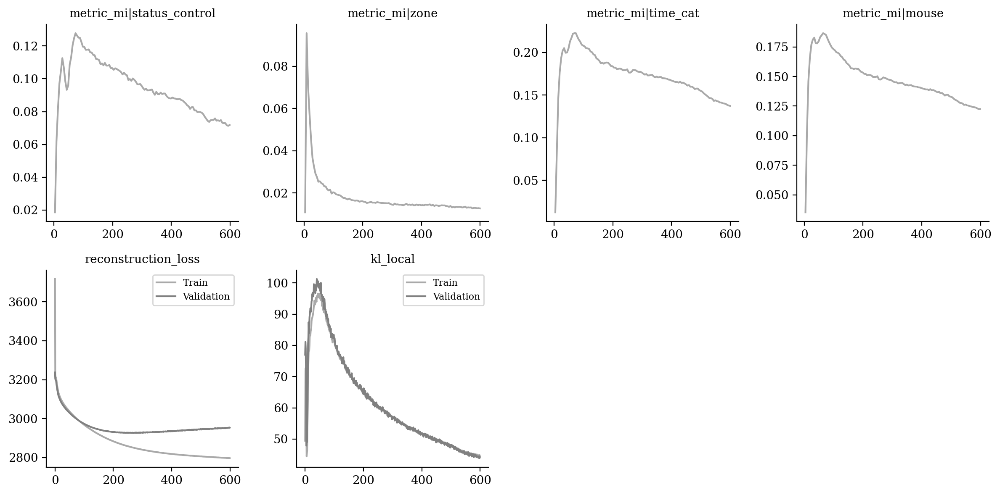

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

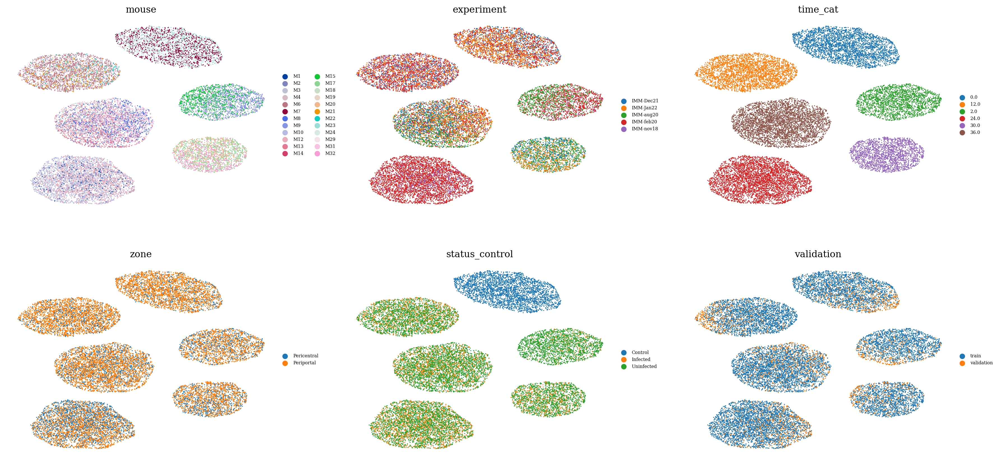

In [13]:
sublatent = DM.configurations.get_by_obs_key("time_cat").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

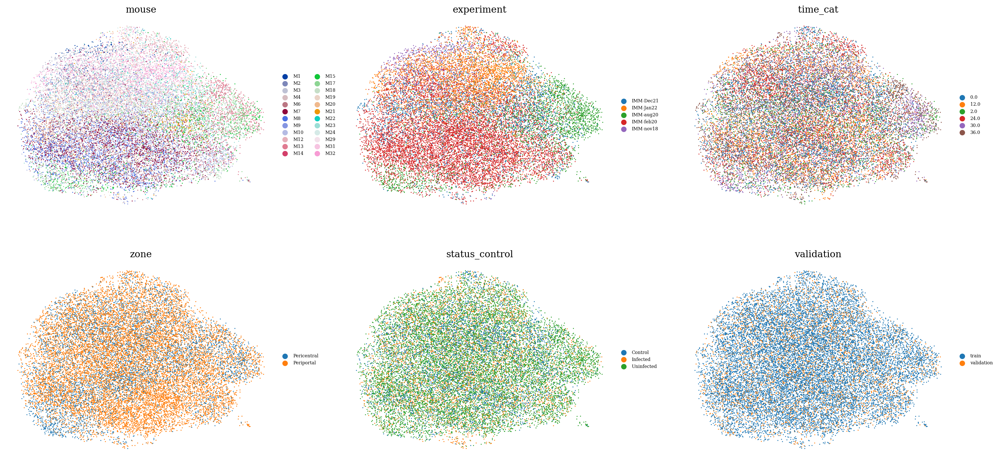

In [14]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )